# Intro
Name:  

    Explore_cld_retrieval_v2

Purpose:  

    Run throught the retrieved cloud properties and either flag or assure retrieval quality
    Use the rertievals based on multiple different ACAOD
  
Input:

    none at command line
  
Output:

    figures and save files...
  
Keywords:

    none
  
Dependencies:

    - Sp_parameters.py : for Sp class definition, and for defining the functions used to build parameters
    - matplotlib
    - mpltools
    - numpy
    - scipy : for saving and reading
    - plotting_utils (user defined plotting routines)
    - hdf5storage
  
Needed Files:

  - file.rc : for consistent creation of look of matplotlib figures
  - 4STAR_cloud retrieval .mat files
  
 Modification History:
 
     Written: by Samuel LeBlanc, NASA Ames, Moffett Field, CA, 2016-10-26
     Modified: Samuel LeBlanc, Sanata Cruz, 2019-08-26
               - based on original notebook

# Import of modules

In [45]:
%config InlineBackend.rc = {}
import matplotlib 
#matplotlib.rc_file('C:\\Users\\sleblan2\\Research\\python_codes\\file.rc')
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpltools import color
%matplotlib notebook
import numpy as np
import scipy.io as sio
import hdf5storage as hs
import Sp_parameters as Sp

In [46]:
from path_utils import getpath

In [47]:
from Sp_parameters import smooth

In [48]:
fo = getpath('ORACLES')

Return path named:  ORACLES /mnt/c/Users/lebla/Research/ORACLES/


In [49]:
fp = fo+'starzen/'
fp_plot = fo+'plot/'

In [50]:
fp, fp_plot

(u'/mnt/c/Users/lebla/Research/ORACLES/starzen/',
 u'/mnt/c/Users/lebla/Research/ORACLES/plot/')

In [7]:
# set the basic directory path
#fp = 'C:/Users/sleblan2/Research/ORACLES/starzen/'
#fp_plot = 'C:/Users/sleblan2/Research/ORACLES/plot/'

In [51]:
vr = 'R2'

In [52]:
vv = 'v5'

# Load the files

In [100]:
dds = ['20160827','20160830','20160831','20160902','20160904','20160906','20160908',
       '20160910','20160912','20160914','20160918','20160920','20160924','20160925','20160927']

In [10]:
rts_low, rts_mid, rts_80, rts_65, rts_05, rts_10, rts_15 = [],[],[],[],[],[],[]
sps = []

In [11]:
for daystr in dds:
    print daystr
    rt = hs.loadmat(fp+'v5_lowaod/{}_zen_cld_retrieved.mat'.format(daystr))
    s = sio.loadmat(fp+'4STAR_{}starzen.mat'.format(daystr))
    sp = Sp.Sp(s)
    rts_low.append(rt)
    sps.append(sp)

20160827
1556 1556
in rads
(749, 1556) 2 1556
1 in ui
(749, 1556)
Calculating the utc times
No indexed good values, choosing all times that are greater than 0 and that are not parked
good length: 746 / 749
20160830
1556 1556
in rads
(305, 1556) 2 1556
1 in ui
(305, 1556)
Calculating the utc times
No indexed good values, choosing all times that are greater than 0 and that are not parked
good length: 235 / 305
20160831
1556 1556
in rads
(1337, 1556) 2 1556
1 in ui
(1337, 1556)
Calculating the utc times
No indexed good values, choosing all times that are greater than 0 and that are not parked
good length: 1303 / 1337
20160902
1556 1556
in rads
(1013, 1556) 2 1556
1 in ui
(1013, 1556)
Calculating the utc times
No indexed good values, choosing all times that are greater than 0 and that are not parked
good length: 515 / 1013
20160904
1556 1556
in rads
(1858, 1556) 2 1556
1 in ui
(1858, 1556)
Calculating the utc times
No indexed good values, choosing all times that are greater than 0 and that

In [12]:
for daystr in dds:
    print daystr
    rt =[]
    rt = hs.loadmat(fp+'v5_midaod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_mid.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


In [13]:
for daystr in dds:
    print daystr
    rt = []
    rt = hs.loadmat(fp+'v5_65aod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_65.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


In [14]:
for daystr in dds:
    print daystr
    rt = []
    rt = hs.loadmat(fp+'v5_80aod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_80.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


In [15]:
for daystr in dds:
    print daystr
    rt = []
    rt = hs.loadmat(fp+'v5_05aod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_05.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


In [16]:
for daystr in dds:
    print daystr
    rt = []
    rt = hs.loadmat(fp+'v5_10aod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_10.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


In [17]:
for daystr in dds:
    print daystr
    rt = []
    rt = hs.loadmat(fp+'v5_15aod/{}_zen_cld_retrieved.mat'.format(daystr))
    rts_15.append(rt)

20160827
20160830
20160831
20160902
20160904
20160906
20160908
20160910
20160912
20160914
20160918
20160920
20160924
20160925
20160927


## Load the cloud probe incloud flag

In [18]:
from load_utils import mat2py_time,toutc

In [19]:
p = sio.netcdf_file(fp+'..//data_other//oracles.cloud.timings.nc','r')

In [20]:
p.variables

OrderedDict([('timevec_20160902',
              <scipy.io.netcdf.netcdf_variable at 0x7fceac251590>),
             ('timevec_20160904',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9f10>),
             ('timevec_20160906',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9850>),
             ('timevec_20160908',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e97d0>),
             ('timevec_20160910',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9c10>),
             ('timevec_20160912',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9c50>),
             ('timevec_20160914',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9dd0>),
             ('timevec_20160918',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9d90>),
             ('timevec_20160920',
              <scipy.io.netcdf.netcdf_variable at 0x7fce945e9b50>),
             ('timevec_20160924',
              <scipy.io.netcdf.netcdf_variable a

In [21]:
p.variables['timevec_20160914'].data

array([736587.32859954, 736587.32861111, 736587.32862269, ...,
       736587.65826389, 736587.65827546, 736587.65828704])

In [22]:
t_0914 = mat2py_time(p.variables['timevec_20160914'].data)

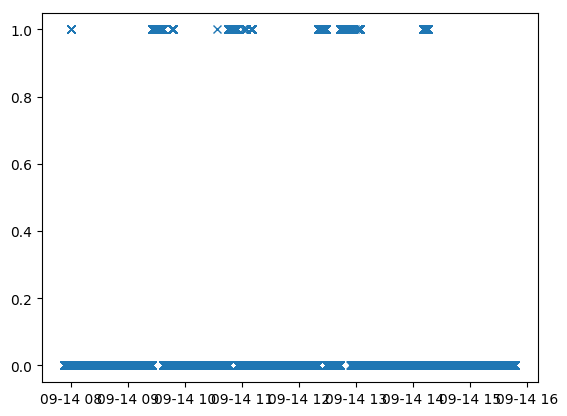

In [27]:
plt.figure()
plt.plot(t_0914,p.variables['cloud_time_20160914'].data,'x')

## Load the AOD ict files

In [23]:
ar6 = hs.loadmat(fo+'/aod_ict/v8/R3/all_aod_ict_R3_2016.mat')

ar6['flac'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)
ar6['flacr'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)&(ar6['fl_routine'])
ar6['flaco'] = (ar6['qual_flag']==0)&(ar6['flag_acaod']==1)&~(ar6['fl_routine'])

ar6['flr'] = (ar6['qual_flag']==0) & (ar6['fl_routine'])
ar6['flo'] = (ar6['qual_flag']==0) & ~(ar6['fl_routine'])
ar6['fl'] = (ar6['qual_flag']==0)

# Start plotting the results

In [24]:
rt.keys()

[u'tau', u'utc', u'ki', u'sza', u'lon', u'lat', u'phase', u'alt', u'ref']

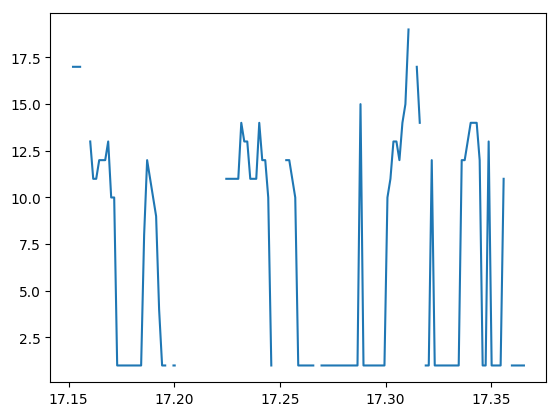

In [30]:
plt.figure()
plt.plot(rt['utc'],rt['tau'])

In [22]:
rt = rts[9]

IndexError: list index out of range

<IPython.core.display.Javascript object>


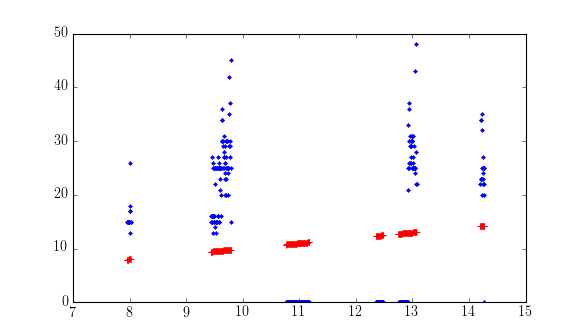

In [15]:
plt.figure()
plt.plot(rts[9]['utc'],rts[9]['tau'],'.')
plt.plot(rts[9]['utc'],rts[9]['utc'],'r+')

<IPython.core.display.Javascript object>


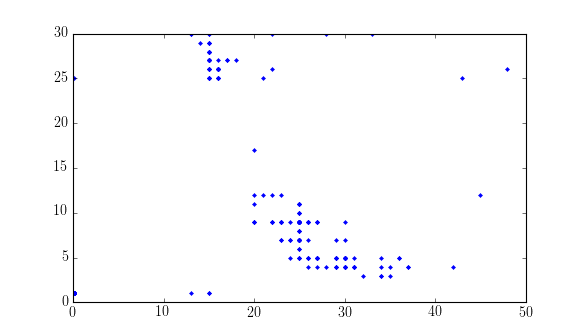

In [16]:
plt.figure()
plt.plot(rts[9]['tau'],rts[9]['ref'],'.')

In [27]:
igood = rts[9]['tau']>0

NameError: name 'rts' is not defined

In [32]:
igood[0:10]

NameError: name 'igood' is not defined

In [14]:
sp = sps[9]

<IPython.core.display.Javascript object>


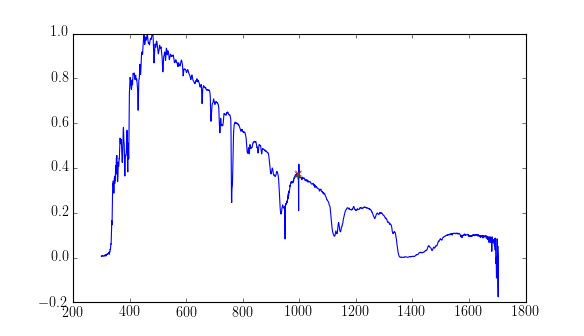

In [15]:
i=68
i_vis = [1061,1062,1064]
i_nir = [1060,1063]
plt.figure()
plt.plot(sp.wvl,sp.norm[i,:])
#plt.xlim(970,1030)
plt.plot(sp.wvl[i_vis],sp.norm[i,i_vis],'rx')
plt.plot(sp.wvl[i_nir],sp.norm[i,i_nir],'g+')


In [16]:
np.nanmean(sp.norm[i,iw])

NameError: name 'iw' is not defined

In [17]:
np.nanmean(sp.norm[i,ii])

NameError: name 'ii' is not defined

## Plot some of the sza for each day to ensure good fitting of lut

<IPython.core.display.Javascript object>


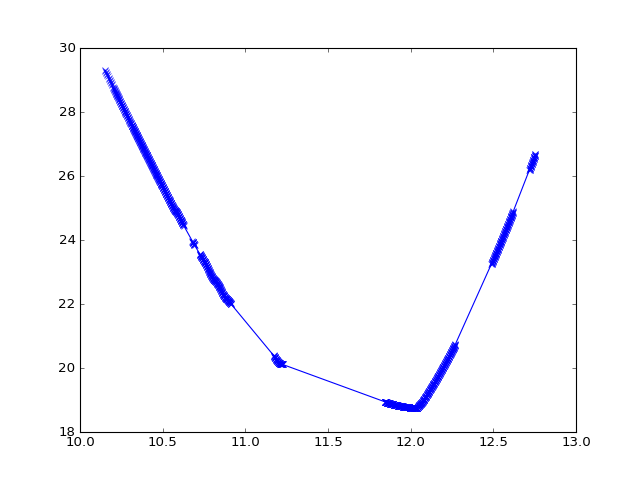

In [35]:
plt.figure()
plt.plot(sps[7].utc,sps[7].sza,'x-')

# Now setup filters to weed out bad data

## Filter out data points where nir and vis spectrometers don't match

In [25]:
i_vis = [1061,1062,1064]
i_nir = [1060,1063]

In [26]:
for i,daystr in enumerate(dds):
    nvis = np.nanmean(sps[i].norm[:,i_vis],axis=1)
    nnir = np.nanmean(sps[i].norm[:,i_nir],axis=1)
    rts_low[i]['delta'] = abs(nvis-nnir)
    rts_low[i]['fl_match'] = rts_low[i]['delta']<0.06
    
    print daystr,rts_low[i]['delta'].shape,rts_low[i]['delta'][rts_low[i]['fl_match']].shape,\
        float(rts_low[i]['delta'][rts_low[i]['fl_match']].shape[0])/ float(rts_low[i]['delta'].shape[0])*100.0
        
    rts_mid[i]['delta'] = abs(nvis-nnir)
    rts_mid[i]['fl_match'] = rts_low[i]['delta']<0.06
    rts_65[i]['delta'] = abs(nvis-nnir)
    rts_65[i]['fl_match'] = rts_low[i]['delta']<0.06
    rts_80[i]['delta'] = abs(nvis-nnir)
    rts_80[i]['fl_match'] = rts_low[i]['delta']<0.06
    rts_05[i]['fl_match'] = rts_low[i]['delta']<0.06
    rts_10[i]['fl_match'] = rts_low[i]['delta']<0.06
    rts_15[i]['fl_match'] = rts_low[i]['delta']<0.06

20160827 (749,) (543,) 72.4966622163
20160830 (305,) (163,) 53.4426229508
20160831 (1337,) (909,) 67.9880329095
20160902 (1013,) (642,) 63.3761105627
20160904 (1858,) (1178,) 63.4015069968
20160906 (1120,) (736,) 65.7142857143
20160908 (105,) (70,) 66.6666666667
20160910 (1415,) (1034,) 73.074204947
20160912 (662,) (434,) 65.5589123867
20160914 (438,) (303,) 69.1780821918
20160918 (553,) (408,) 73.7793851718
20160920 (341,) (195,) 57.1847507331
20160924 (1369,) (1102,) 80.4967129291
20160925 (600,) (474,) 79.0
20160927 (145,) (109,) 75.1724137931


## Now filter out the times which were at too high altitude

In [27]:
fl_alt = rt['alt']<1000.0

In [28]:
for i,daystr in enumerate(dds):
    rts_low[i]['fl_alt'] = rts_low[i]['alt'][:,0]<1000.0
    print daystr,rts_low[i]['utc'].shape,rts_low[i]['utc'][rts_low[i]['fl_alt']].shape,\
        float(rts_low[i]['utc'][rts_low[i]['fl_alt']].shape[0])/ float(rts_low[i]['utc'].shape[0])*100.0
    rts_mid[i]['fl_alt'] = rts_mid[i]['alt'][:,0]<1000.0
    rts_65[i]['fl_alt'] = rts_65[i]['alt'][:,0]<1000.0
    rts_80[i]['fl_alt'] = rts_80[i]['alt'][:,0]<1000.0
    rts_05[i]['fl_alt'] = rts_80[i]['fl_alt']
    rts_10[i]['fl_alt'] = rts_80[i]['fl_alt']
    rts_15[i]['fl_alt'] = rts_80[i]['fl_alt']

20160827 (749,) (736,) 98.26435247
20160830 (305,) (305,) 100.0
20160831 (1337,) (1226,) 91.6978309648
20160902 (1013,) (972,) 95.9526159921
20160904 (1858,) (1543,) 83.0462863294
20160906 (1120,) (877,) 78.3035714286
20160908 (105,) (101,) 96.1904761905
20160910 (1415,) (928,) 65.5830388693
20160912 (662,) (368,) 55.5891238671
20160914 (438,) (438,) 100.0
20160918 (553,) (353,) 63.8336347197
20160920 (341,) (341,) 100.0
20160924 (1369,) (803,) 58.6559532505
20160925 (600,) (598,) 99.6666666667
20160927 (145,) (145,) 100.0


## Filter for in cloud

In [29]:
from write_utils import nearest_neighbor

In [30]:
for i,daystr in enumerate(dds):
    try:
        p_time = mat2py_time(p.variables['timevec_{}'.format(daystr)].data)
    except KeyError: # no in cloud data, so choose all of them
        rts_low[i]['fl_incld'] = rts_low[i]['utc']>0.0
        continue
    putc = toutc(p_time)
    rts_low[i]['incld'] = nearest_neighbor(putc,p.variables['cloud_time_{}'.format(daystr)].data,rts_low[i]['utc'],dist=1.0/3600)
    rts_low[i]['fl_incld'] = rts_low[i]['incld']==0
    print daystr,rts_low[i]['utc'].shape,rts_low[i]['utc'][rts_low[i]['fl_incld']].shape,\
        float(rts_low[i]['utc'][rts_low[i]['fl_incld']].shape[0])/ float(rts_low[i]['utc'].shape[0])*100.0

20160902 (1013,) (707,) 69.7926949654
20160904 (1858,) (911,) 49.0312163617
20160906 (1120,) (762,) 68.0357142857
20160908 (105,) (44,) 41.9047619048
20160910 (1415,) (766,) 54.1342756184
20160912 (662,) (350,) 52.8700906344
20160914 (438,) (199,) 45.4337899543
20160918 (553,) (333,) 60.2169981917
20160920 (341,) (282,) 82.6979472141
20160924 (1369,) (359,) 26.2235208181
20160925 (600,) (267,) 44.5
20160927 (145,) (106,) 73.1034482759


In [31]:
for i,daystr in enumerate(dds):
    rts_mid[i]['fl_incld'] = rts_low[i]['fl_incld']
    rts_65[i]['fl_incld'] = rts_low[i]['fl_incld']
    rts_80[i]['fl_incld'] = rts_low[i]['fl_incld']
    rts_15[i]['fl_incld'] = rts_low[i]['fl_incld']
    rts_10[i]['fl_incld'] = rts_low[i]['fl_incld']
    rts_05[i]['fl_incld'] = rts_low[i]['fl_incld']
    

## Filter for high ki squared residuals

In [33]:
dki = 2.66
for i,daystr in enumerate(dds):
    rts_low[i]['fl_ki'] = rts_low[i]['ki']<dki
    print daystr,rts_low[i]['utc'].shape,rts_low[i]['utc'][rts_low[i]['fl_ki']].shape,\
        float(rts_low[i]['utc'][rts_low[i]['fl_ki']].shape[0])/ float(rts_low[i]['utc'].shape[0])*100.0
        
    rts_mid[i]['fl_ki'] = rts_mid[i]['ki']<dki
    rts_65[i]['fl_ki'] = rts_65[i]['ki']<dki
    rts_80[i]['fl_ki'] = rts_80[i]['ki']<dki
    rts_05[i]['fl_ki'] = rts_05[i]['ki']<dki
    rts_10[i]['fl_ki'] = rts_10[i]['ki']<dki
    rts_15[i]['fl_ki'] = rts_15[i]['ki']<dki

20160827 (749,) (560,) 74.7663551402
20160830 (305,) (174,) 57.0491803279
20160831 (1337,) (1049,) 78.459237098
20160902 (1013,) (727,) 71.7670286278
20160904 (1858,) (1187,) 63.8858988159
20160906 (1120,) (858,) 76.6071428571
20160908 (105,) (63,) 60.0
20160910 (1415,) (1181,) 83.4628975265
20160912 (662,) (524,) 79.1540785498
20160914 (438,) (351,) 80.1369863014
20160918 (553,) (463,) 83.7251356239
20160920 (341,) (205,) 60.1173020528
20160924 (1369,) (1174,) 85.7560262966
20160925 (600,) (490,) 81.6666666667
20160927 (145,) (57,) 39.3103448276


## Combine the filters

In [34]:
tot=0
tot_fl=0
for i,daystr in enumerate(dds):
    rts_low[i]['fl'] = rts_low[i]['fl_match'] & rts_low[i]['fl_alt'] & rts_low[i]['fl_incld'] & rts_low[i]['fl_ki']
    print daystr,rts_low[i]['utc'].shape,rts_low[i]['utc'][rts_low[i]['fl']].shape,\
        float(rts_low[i]['utc'][rts_low[i]['fl']].shape[0])/ float(rts_low[i]['utc'].shape[0])*100.0 
    tot = tot+len(rts_low[i]['utc'])
    tot_fl = tot_fl+len(rts_low[i]['utc'][rts_low[i]['fl']])
    
    rts_mid[i]['fl'] = rts_mid[i]['fl_match'] & rts_mid[i]['fl_alt'] & rts_mid[i]['fl_incld'] & rts_mid[i]['fl_ki']
    rts_65[i]['fl'] = rts_65[i]['fl_match'] & rts_65[i]['fl_alt'] & rts_65[i]['fl_incld'] & rts_65[i]['fl_ki']
    rts_80[i]['fl'] = rts_80[i]['fl_match'] & rts_80[i]['fl_alt'] & rts_80[i]['fl_incld'] & rts_80[i]['fl_ki']
    rts_05[i]['fl'] = rts_05[i]['fl_match'] & rts_05[i]['fl_alt'] & rts_05[i]['fl_incld'] & rts_05[i]['fl_ki']
    rts_10[i]['fl'] = rts_10[i]['fl_match'] & rts_10[i]['fl_alt'] & rts_10[i]['fl_incld'] & rts_10[i]['fl_ki']
    rts_15[i]['fl'] = rts_15[i]['fl_match'] & rts_15[i]['fl_alt'] & rts_15[i]['fl_incld'] & rts_15[i]['fl_ki']

20160827 (749,) (481,) 64.2189586115
20160830 (305,) (163,) 53.4426229508
20160831 (1337,) (858,) 64.1735228123
20160902 (1013,) (379,) 37.4136229023
20160904 (1858,) (293,) 15.7696447793
20160906 (1120,) (326,) 29.1071428571
20160908 (105,) (15,) 14.2857142857
20160910 (1415,) (470,) 33.2155477032
20160912 (662,) (198,) 29.9093655589
20160914 (438,) (129,) 29.4520547945
20160918 (553,) (230,) 41.5913200723
20160920 (341,) (173,) 50.7331378299
20160924 (1369,) (276,) 20.1607012418
20160925 (600,) (200,) 33.3333333333
20160927 (145,) (30,) 20.6896551724


In [35]:
print tot, tot_fl, float(tot_fl)/float(tot)*100.0

12010 4221 35.1457119067


# Now plot each retrieved product, filtered

In [36]:
from Sp_parameters import smooth

<IPython.core.display.Javascript object>


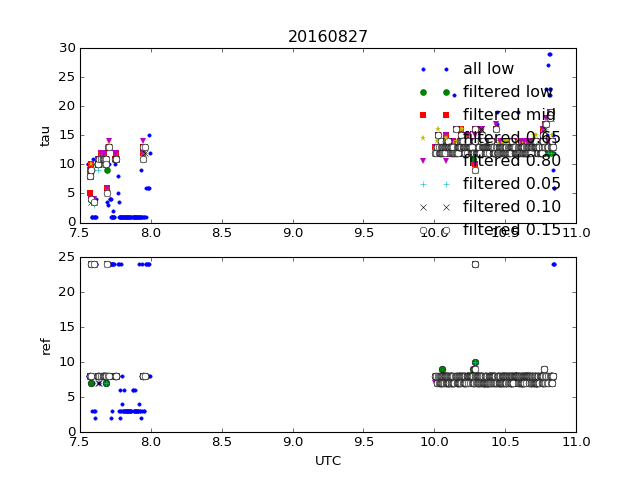

<IPython.core.display.Javascript object>


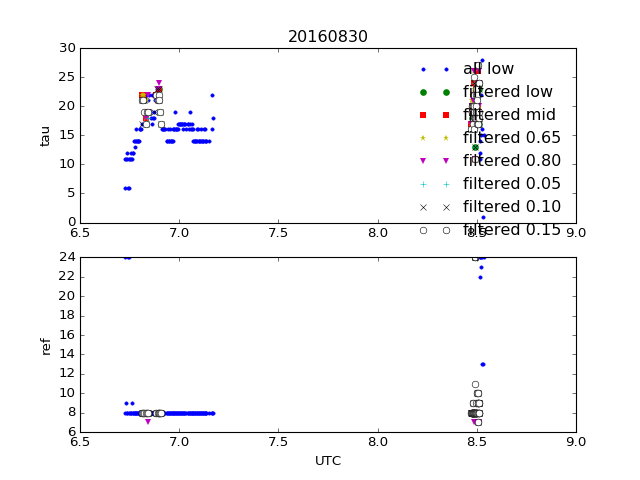

<IPython.core.display.Javascript object>


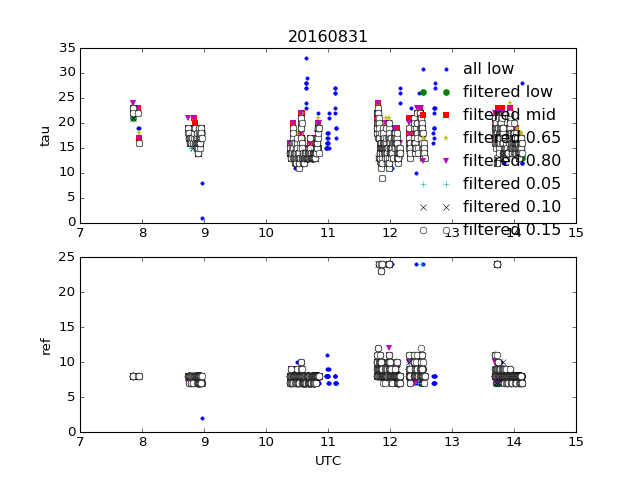

<IPython.core.display.Javascript object>


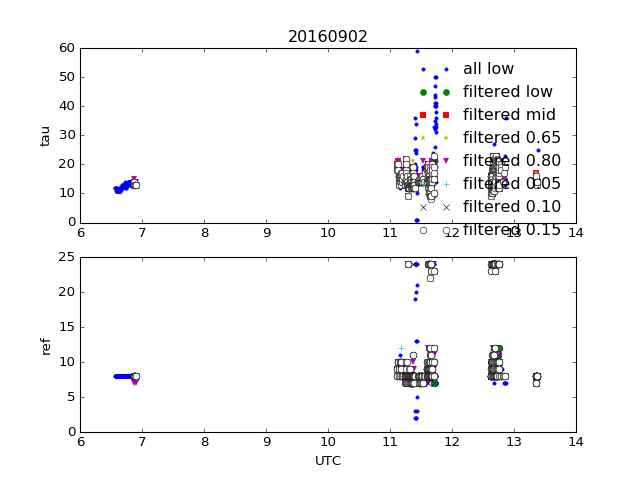

<IPython.core.display.Javascript object>


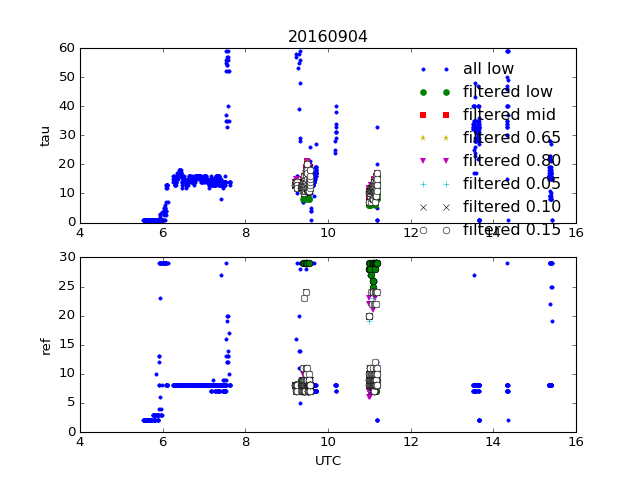

<IPython.core.display.Javascript object>


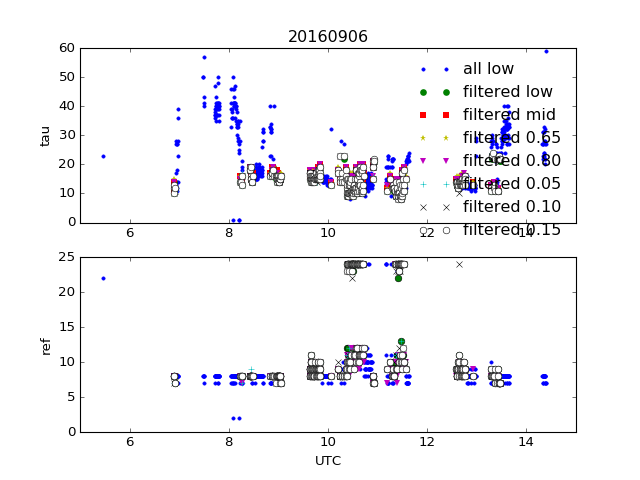

<IPython.core.display.Javascript object>


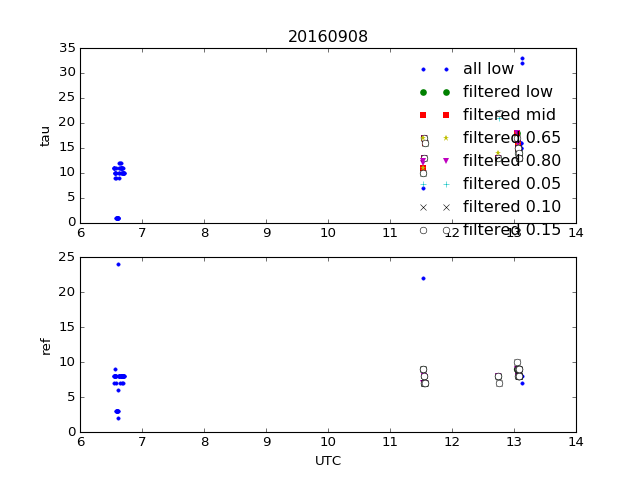

<IPython.core.display.Javascript object>


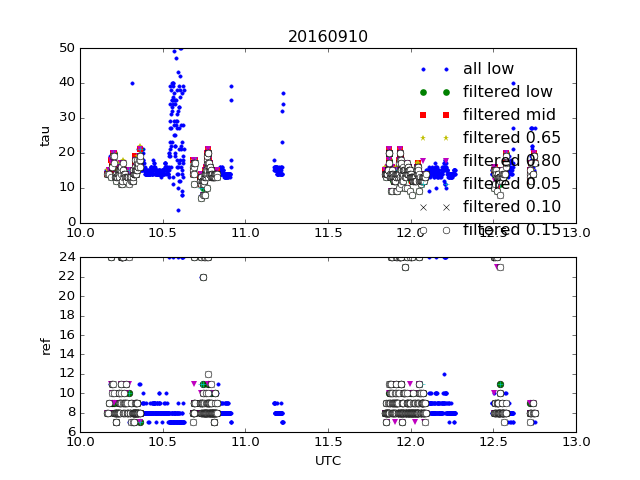

<IPython.core.display.Javascript object>


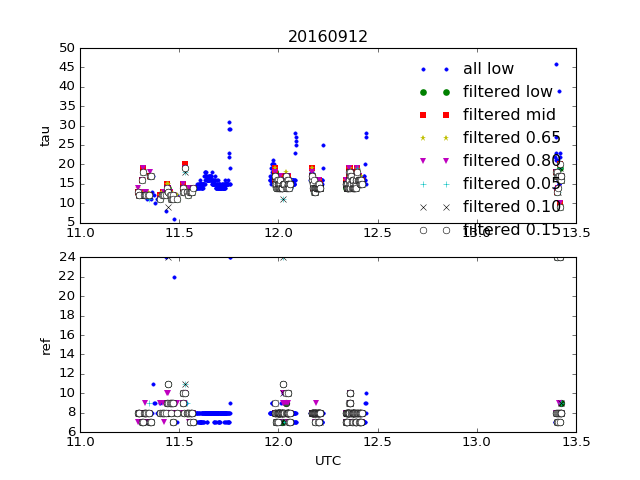

<IPython.core.display.Javascript object>


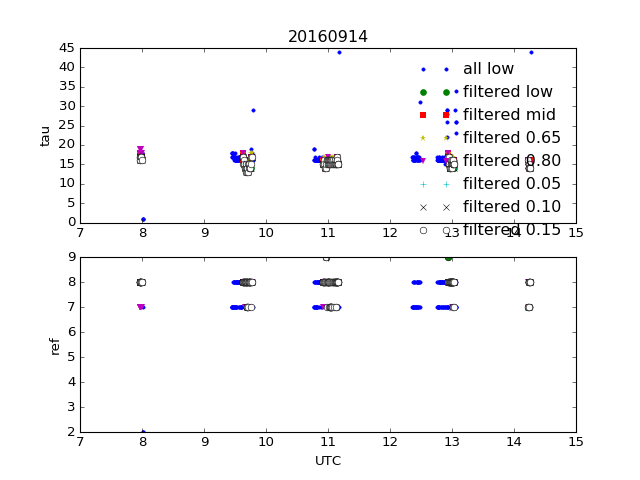

<IPython.core.display.Javascript object>


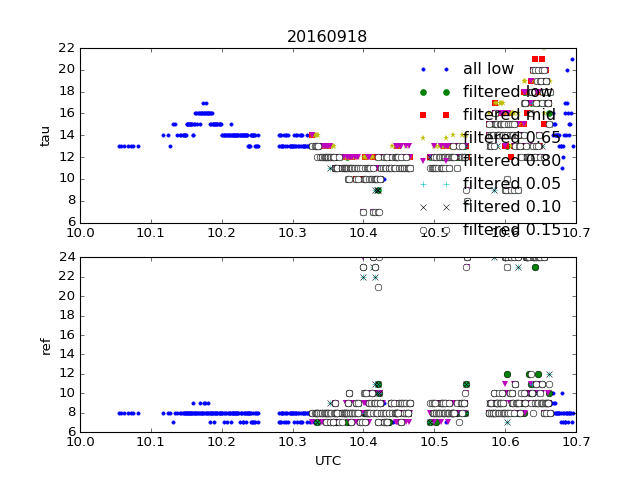

<IPython.core.display.Javascript object>


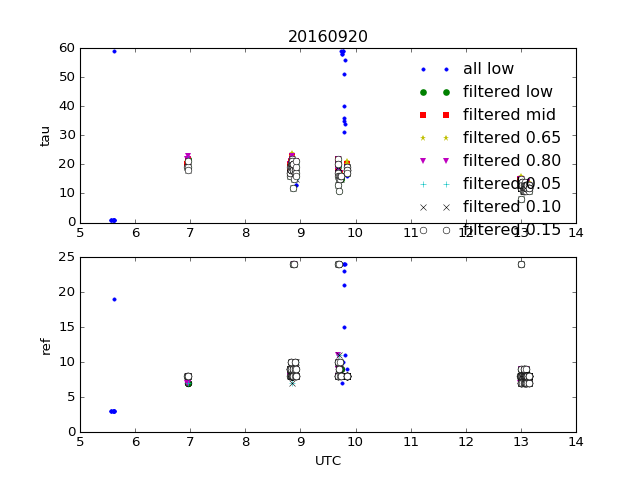

<IPython.core.display.Javascript object>


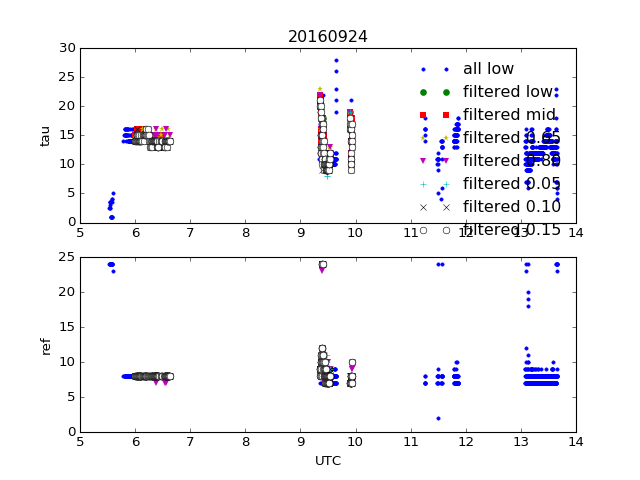

<IPython.core.display.Javascript object>


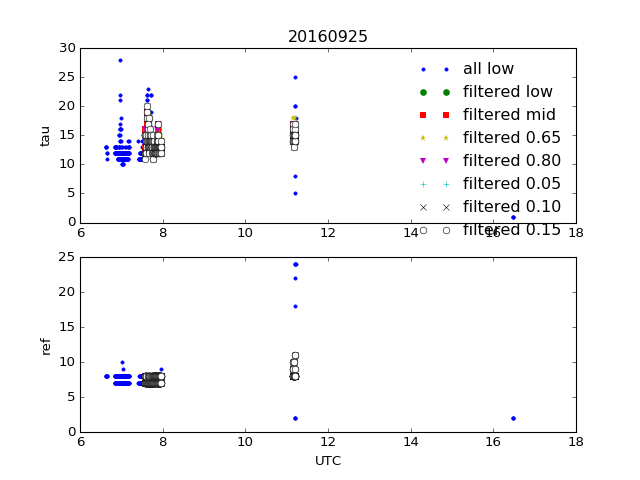

<IPython.core.display.Javascript object>


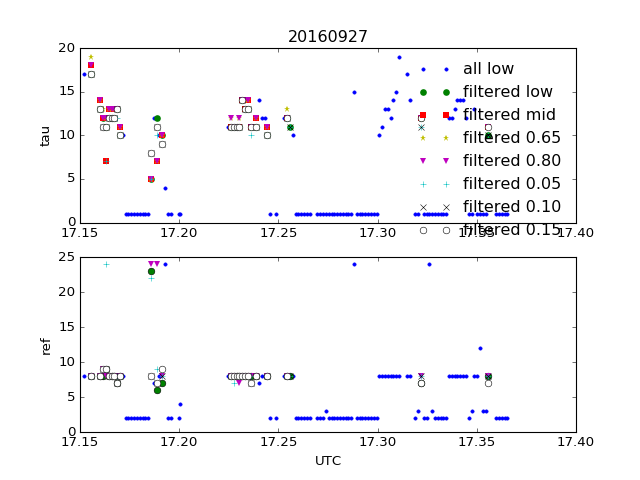

In [36]:
for i,daystr in enumerate(dds):
    plt.figure()
    ax1 = plt.subplot(211)
    ax2 = plt.subplot(212,sharex=ax1)
    ax1.plot(rts_low[i]['utc'],rts_low[i]['tau'],'b.',label='all low')
    ax1.plot(rts_low[i]['utc'][rts_low[i]['fl']],rts_low[i]['tau'][rts_low[i]['fl']],'go',markeredgecolor='None',label='filtered low')
    ax1.plot(rts_mid[i]['utc'][rts_mid[i]['fl']],rts_mid[i]['tau'][rts_mid[i]['fl']],'rs',markeredgecolor='None',label='filtered mid')
    ax1.plot(rts_65[i]['utc'][rts_65[i]['fl']],rts_65[i]['tau'][rts_65[i]['fl']],'y*',markeredgecolor='None',label='filtered 0.65')
    ax1.plot(rts_80[i]['utc'][rts_80[i]['fl']],rts_80[i]['tau'][rts_80[i]['fl']],'mv',markeredgecolor='None',label='filtered 0.80')
    ax1.plot(rts_05[i]['utc'][rts_05[i]['fl']],rts_05[i]['tau'][rts_05[i]['fl']],'c+',label='filtered 0.05')
    ax1.plot(rts_10[i]['utc'][rts_10[i]['fl']],rts_10[i]['tau'][rts_10[i]['fl']],'kx',label='filtered 0.10')
    ax1.plot(rts_15[i]['utc'][rts_15[i]['fl']],rts_15[i]['tau'][rts_15[i]['fl']],'wo',label='filtered 0.15')
    try:
        ax1.plot(rts_low[i]['utc'][rts_low[i]['fl']],smooth(rts_low[i]['tau'][rts_low[i]['fl']],6),'kx',label='smooth low')
    except:
        pass
    ax1.set_ylabel('tau')
    ax1.legend(frameon=False)
    
    ax2.plot(rts_low[i]['utc'],rts_low[i]['ref'],'b.')
    ax2.plot(rts_low[i]['utc'][rts_low[i]['fl']],rts_low[i]['ref'][rts_low[i]['fl']],'go')
    try:
        ax2.plot(rts_low[i]['utc'][rts_low[i]['fl']],smooth(rts_low[i]['ref'][rts_low[i]['fl']],6),'kx')
    except:
        pass
    ax2.plot(rts_80[i]['utc'][rts_80[i]['fl']],rts_80[i]['ref'][rts_80[i]['fl']],'mv',markeredgecolor='None',label='filtered 0.80')
    ax2.plot(rts_05[i]['utc'][rts_05[i]['fl']],rts_05[i]['ref'][rts_05[i]['fl']],'c+',label='filtered 0.05')
    ax2.plot(rts_10[i]['utc'][rts_10[i]['fl']],rts_10[i]['ref'][rts_10[i]['fl']],'kx',label='filtered 0.10')
    ax2.plot(rts_15[i]['utc'][rts_15[i]['fl']],rts_15[i]['ref'][rts_15[i]['fl']],'wo',label='filtered 0.15')
    ax2.set_ylabel('ref')
    ax2.set_xlabel('UTC')
    ax1.set_title(daystr)

<IPython.core.display.Javascript object>


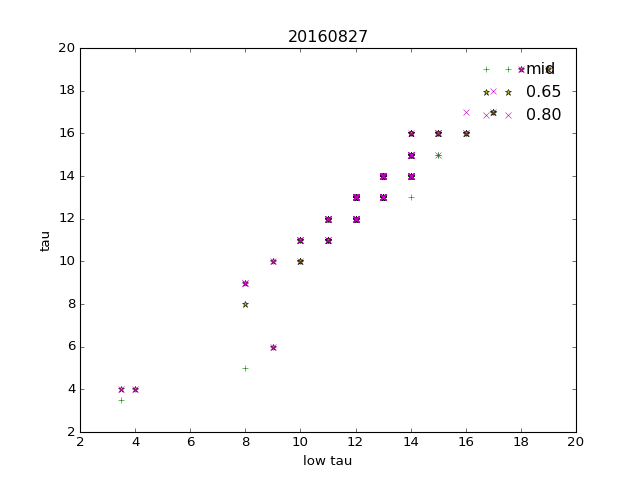

<IPython.core.display.Javascript object>


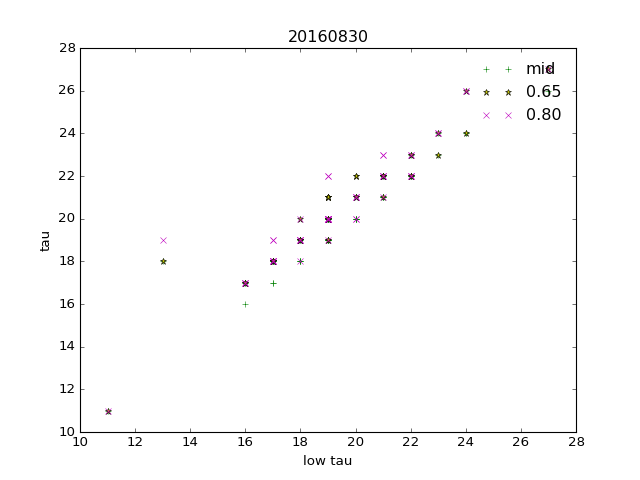

<IPython.core.display.Javascript object>


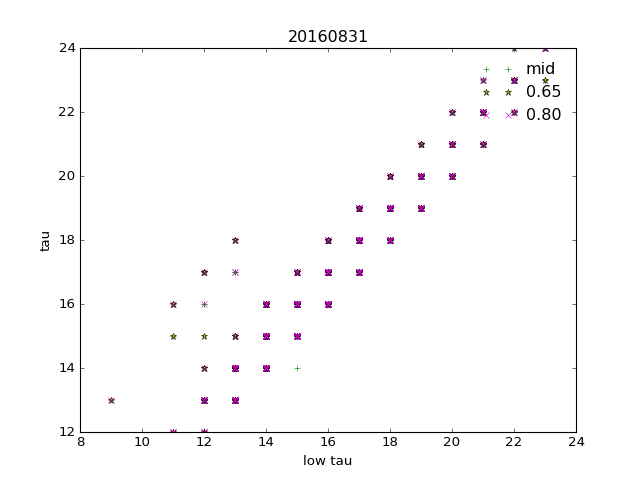

<IPython.core.display.Javascript object>


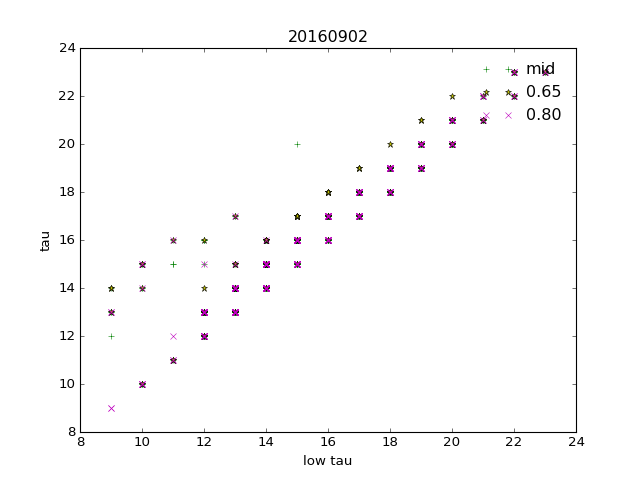

<IPython.core.display.Javascript object>


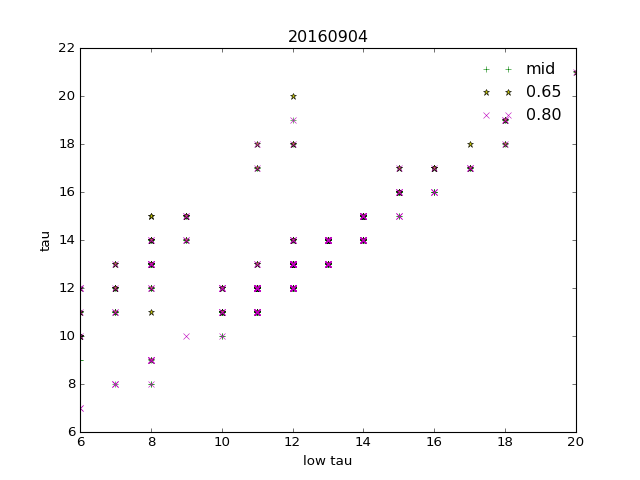

<IPython.core.display.Javascript object>


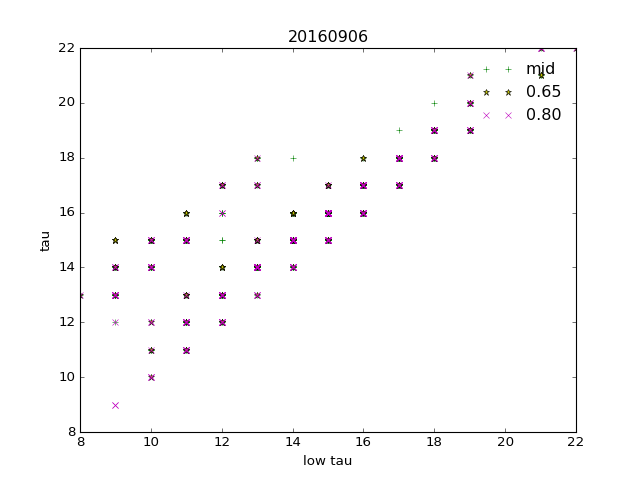

<IPython.core.display.Javascript object>


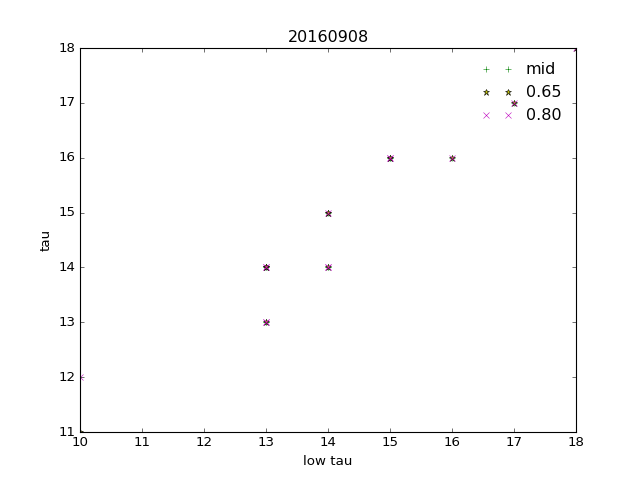

<IPython.core.display.Javascript object>


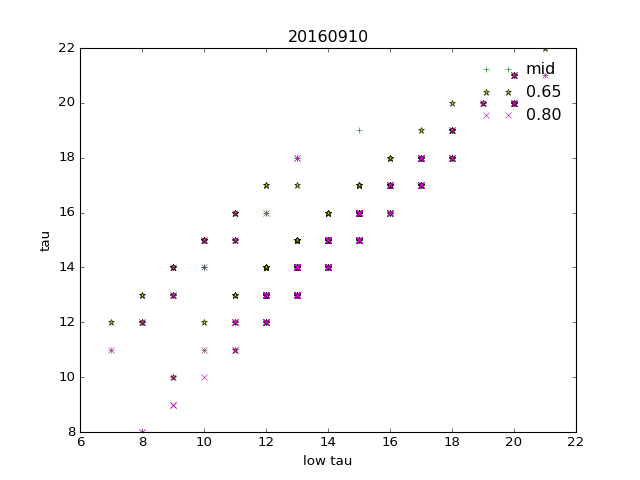

<IPython.core.display.Javascript object>


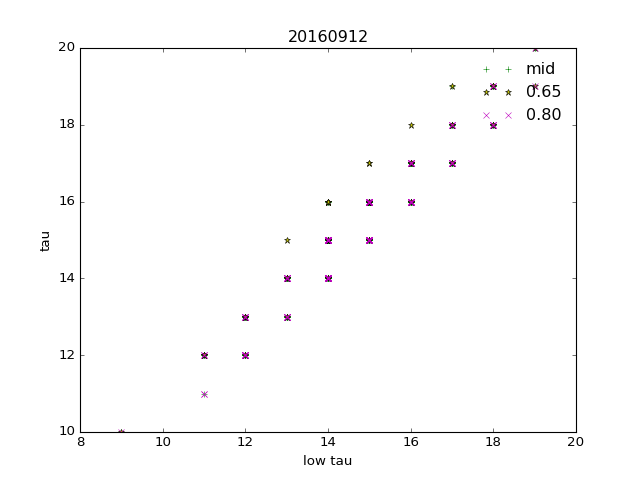

<IPython.core.display.Javascript object>


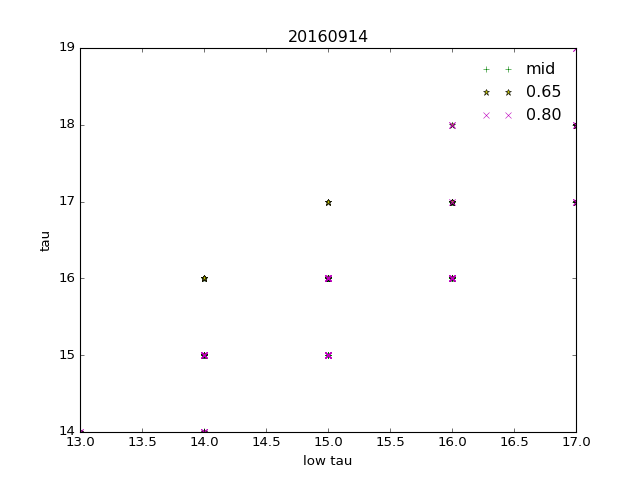

<IPython.core.display.Javascript object>


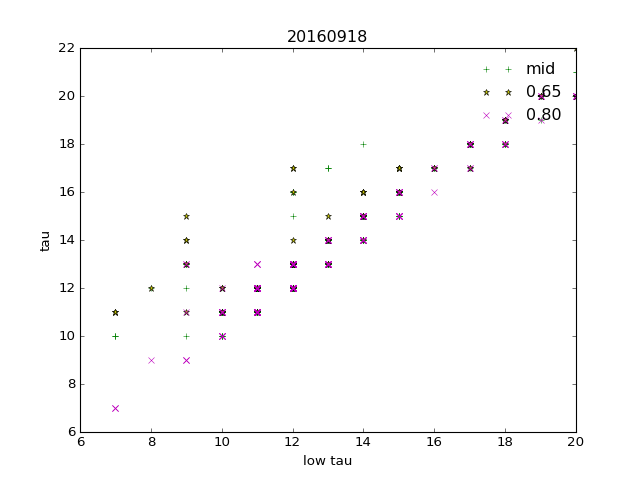

<IPython.core.display.Javascript object>


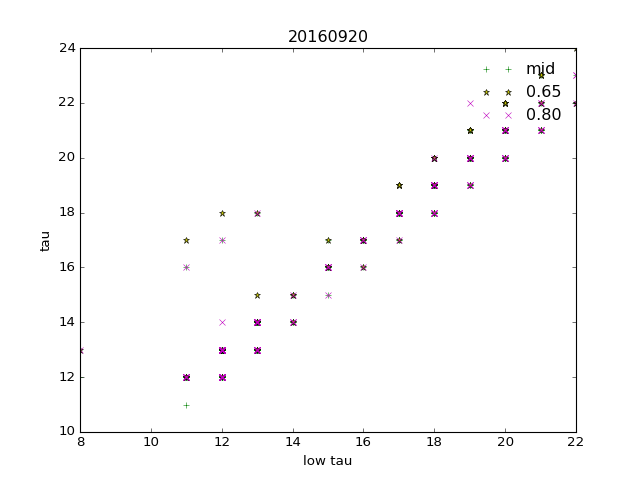

<IPython.core.display.Javascript object>


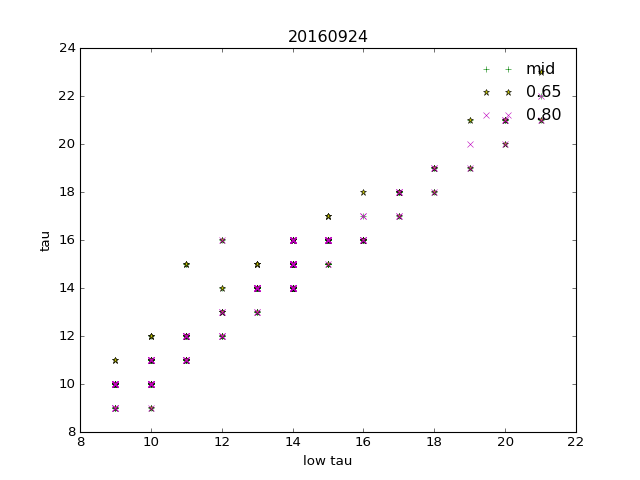

<IPython.core.display.Javascript object>


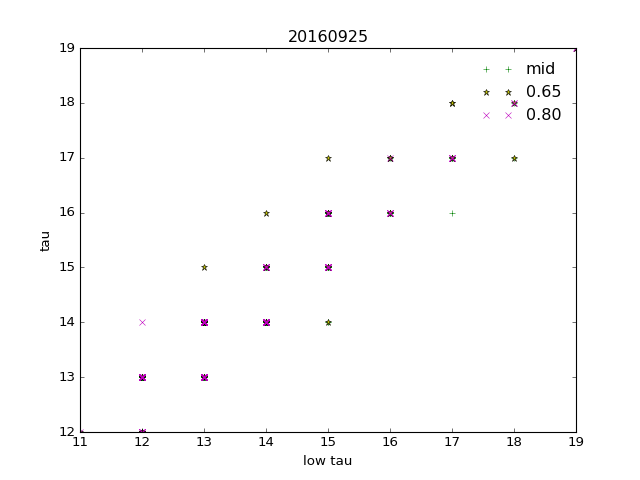

<IPython.core.display.Javascript object>


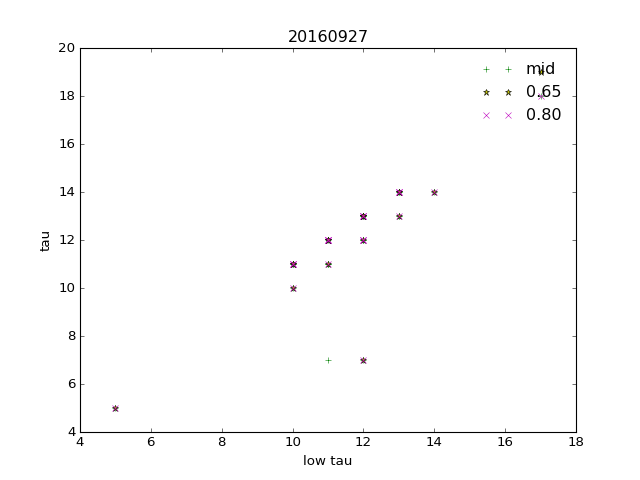

In [61]:
for i,daystr in enumerate(dds):
    plt.figure()
    plt.plot(rts_low[i]['tau'][rts_mid[i]['fl']],rts_mid[i]['tau'][rts_mid[i]['fl']],'g+',label='mid')
    plt.plot(rts_low[i]['tau'][rts_mid[i]['fl']],rts_65[i]['tau'][rts_mid[i]['fl']],'y*',label='0.65')
    plt.plot(rts_low[i]['tau'][rts_mid[i]['fl']],rts_80[i]['tau'][rts_mid[i]['fl']],'mx',label='0.80')
    plt.legend(frameon=False)
    plt.title(daystr)
    plt.ylabel('tau')
    plt.xlabel('low tau')

<IPython.core.display.Javascript object>


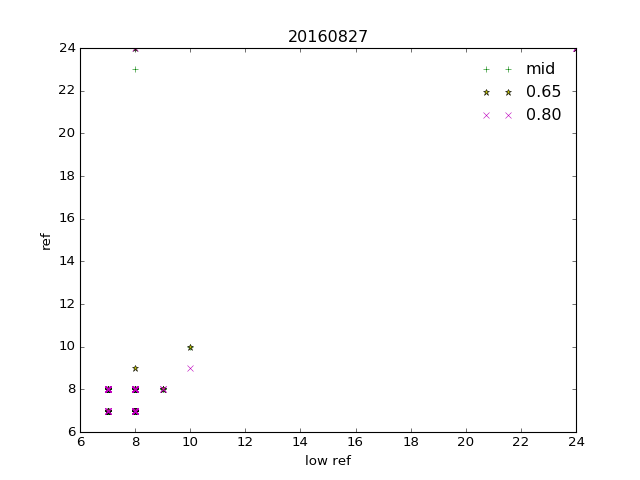

<IPython.core.display.Javascript object>


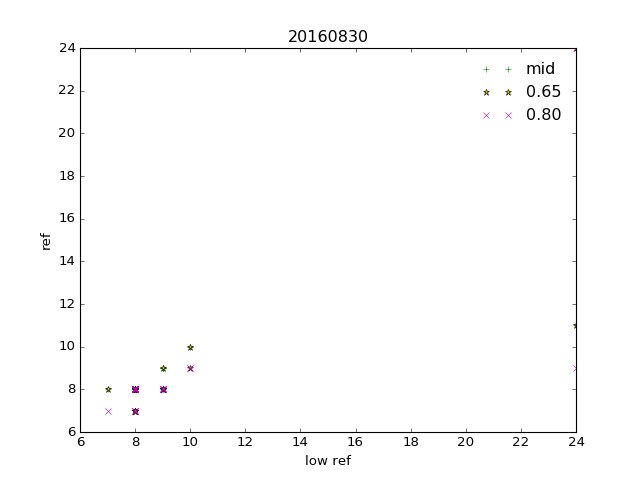

<IPython.core.display.Javascript object>


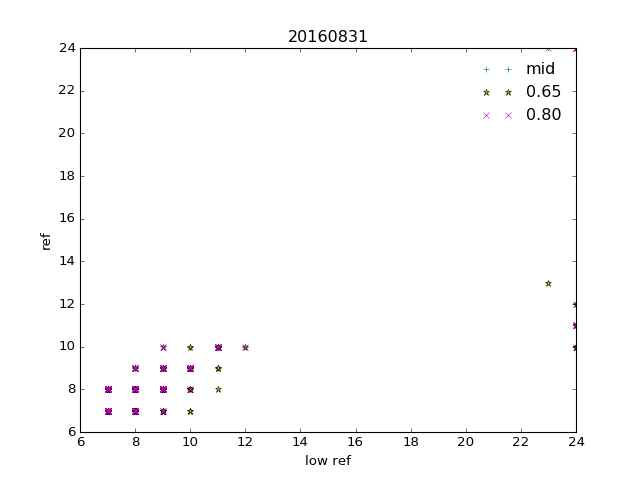

<IPython.core.display.Javascript object>


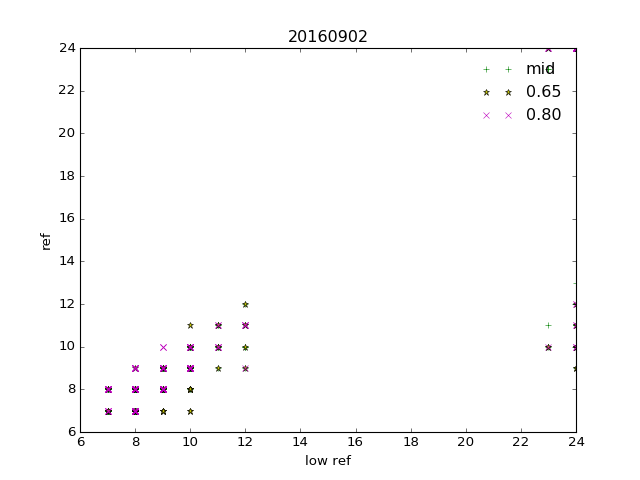

<IPython.core.display.Javascript object>


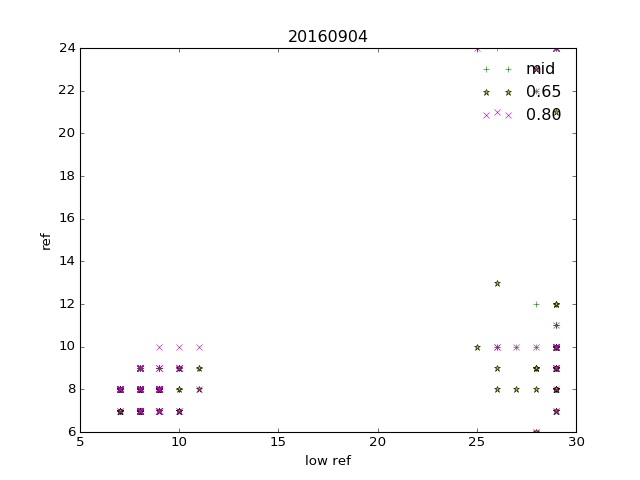

<IPython.core.display.Javascript object>


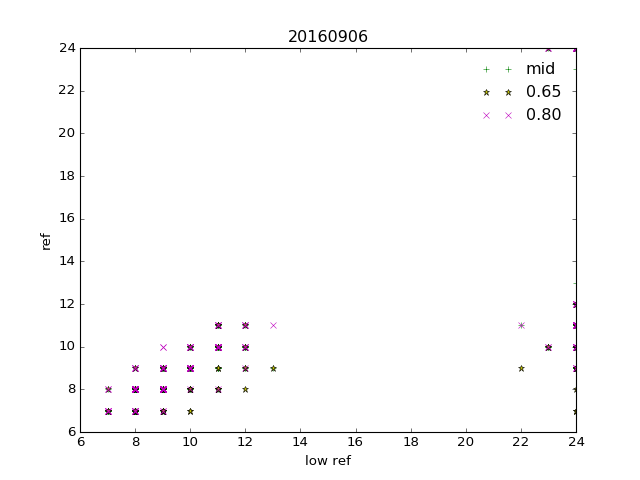

<IPython.core.display.Javascript object>


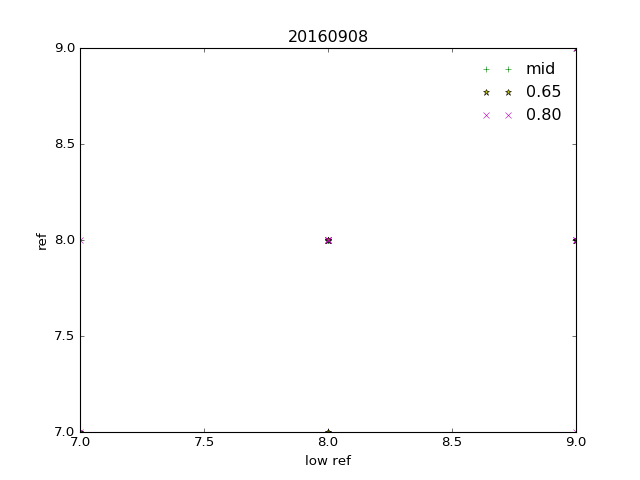

<IPython.core.display.Javascript object>


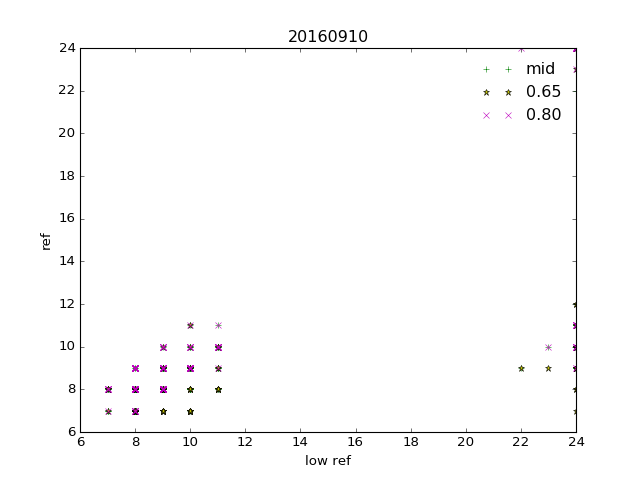

<IPython.core.display.Javascript object>


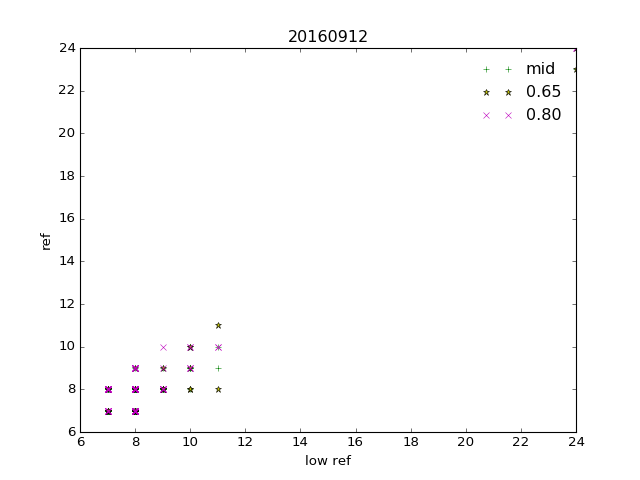

<IPython.core.display.Javascript object>


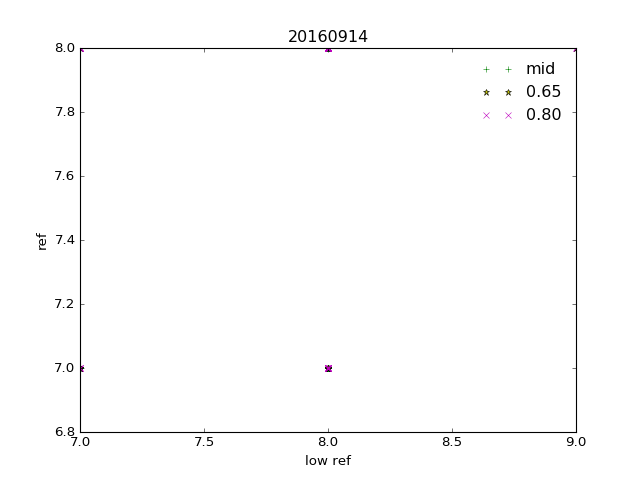

<IPython.core.display.Javascript object>


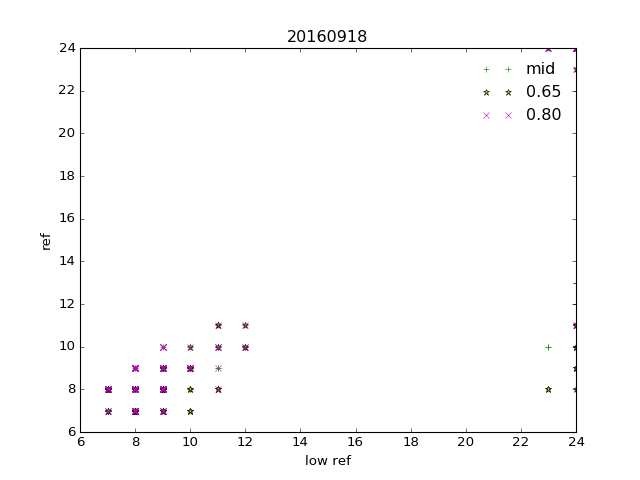

<IPython.core.display.Javascript object>


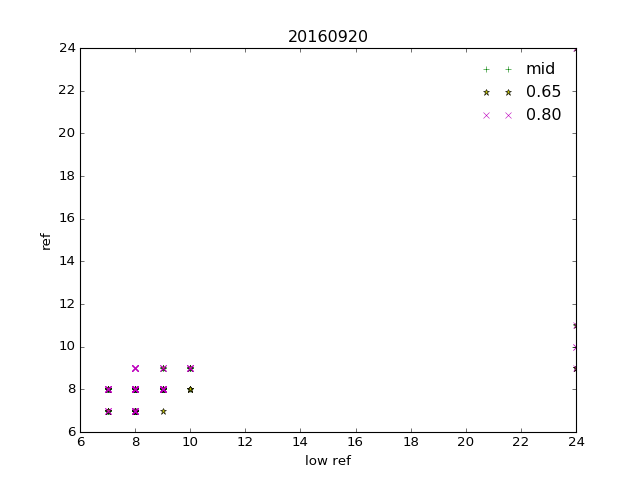

<IPython.core.display.Javascript object>


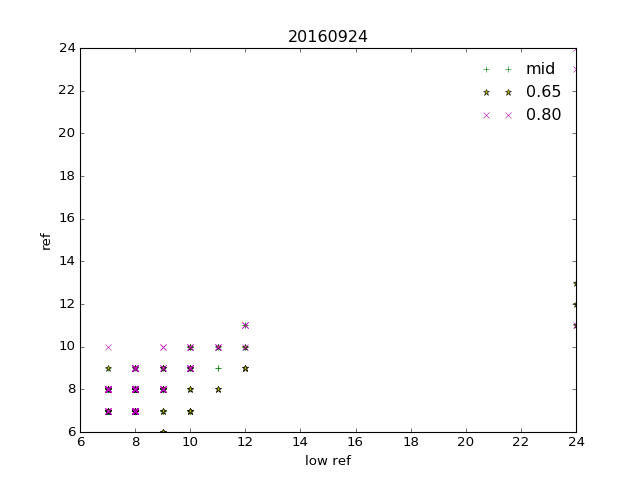

<IPython.core.display.Javascript object>


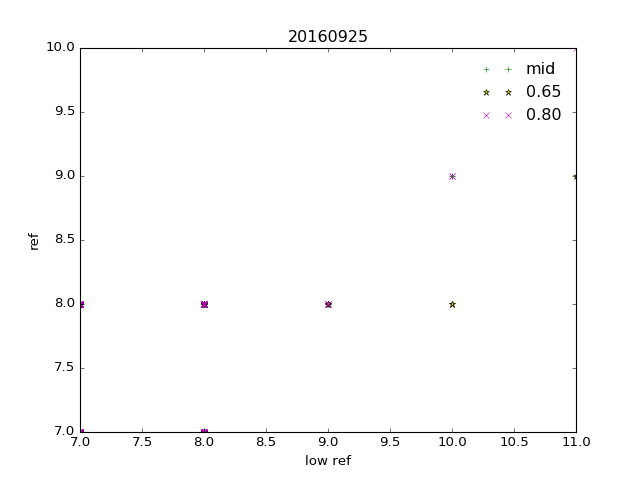

<IPython.core.display.Javascript object>


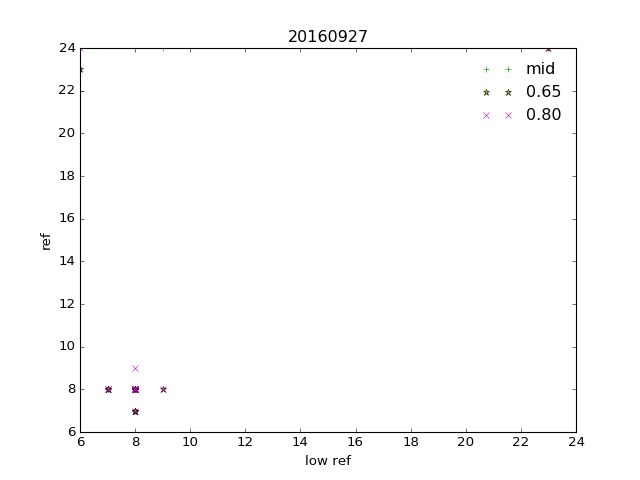

In [62]:
for i,daystr in enumerate(dds):
    plt.figure()
    plt.plot(rts_low[i]['ref'][rts_mid[i]['fl']],rts_mid[i]['ref'][rts_mid[i]['fl']],'g+',label='mid')
    plt.plot(rts_low[i]['ref'][rts_mid[i]['fl']],rts_65[i]['ref'][rts_mid[i]['fl']],'y*',label='0.65')
    plt.plot(rts_low[i]['ref'][rts_mid[i]['fl']],rts_80[i]['ref'][rts_mid[i]['fl']],'mx',label='0.80')
    plt.legend(frameon=False)
    plt.title(daystr)
    plt.ylabel('ref')
    plt.xlabel('low ref')

## Now select the values of tau dependant on the ACAOD

In [37]:
ar6.keys()

[u'AOD1040',
 u'AOD0532',
 u'AOD0530',
 u'UNCAOD0550',
 u'UNCAOD0700',
 u'AOD0355',
 u'AOD1627',
 u'AOD0520',
 u'UNCAOD0620',
 u'AOD0606',
 u'AOD1064',
 u'Latitude',
 u'UNCAOD0452',
 u'fl_alt_6',
 u'AOD0620',
 u'AOD0700',
 u'AOD0550',
 u'AOD0660',
 'flaco',
 u'UNCAOD1627',
 u'AOD0452',
 u'fl_routine',
 u'AOD0470',
 u'fl1',
 u'UNCAOD1236',
 u'fl3',
 u'fl2',
 'flo',
 u'UNCAOD1064',
 u'UNCAOD0501',
 u'AOD_angstrom_470_865',
 u'AOD_polycoef_a0',
 u'AOD_polycoef_a2',
 u'UNCAOD0606',
 u'UNCAOD0355',
 u'qual_flag',
 u'UNCAOD0675',
 u'AOD1559',
 u'UNCAOD1650',
 u'UNCAOD1559',
 u'UNCAOD1250',
 u'AOD0501',
 u'Longitude',
 u'AOD_polycoef_a1',
 u'UNCAOD0660',
 u'GPS_Alt',
 u'AOD1250',
 u'flac',
 u'UNCAOD0380',
 u'fl',
 u'AOD0675',
 u'fl_QA',
 u'AOD1236',
 u'AOD1650',
 u'UNCAOD0470',
 u'AOD0380',
 u'UNCAOD0865',
 u'Start_UTC',
 u'flr',
 u'UNCAOD0781',
 u'days',
 u'UNCAOD0520',
 u'fl_alt_22',
 u'AOD0781',
 u'fl_alt_18',
 u'flag_acaod',
 u'fl_alt',
 u'AOD0865',
 u'amass_aer',
 u'flacr',
 u'UNCAOD1020

In [38]:
ar6['Start_UTC']

array([11.85694444, 11.85722222, 11.8575    , ..., 17.93      ,
       17.93027778, 17.93055556])

In [39]:
ar6['days']

array([ 0.,  0.,  0., ..., 17., 17., 17.])

In [40]:
days6 = ['20160824','20160825','20160827','20160830','20160831','20160902','20160904','20160906','20160908',
       '20160910','20160912','20160914','20160918','20160920','20160924','20160925','20160927','20160930']

In [41]:
dds

['20160827',
 '20160830',
 '20160831',
 '20160902',
 '20160904',
 '20160906',
 '20160908',
 '20160910',
 '20160912',
 '20160914',
 '20160918',
 '20160920',
 '20160924',
 '20160925',
 '20160927']

In [42]:
for i,daystr in enumerate(dds):
    rts_low[i]['acaod'] = rts_low[i]['utc']*0.0
    idd = (ar6['days']==float(i+2)) & (ar6['fl_QA']==1) & (ar6['flag_acaod']==1) & (ar6['AOD0501']<2.0)
    if not any(idd): 
        print daystr, 'False'
        continue
    rts_low[i]['acaod'] = nearest_neighbor(ar6['Start_UTC'][idd],ar6['AOD0501'][idd],rts_low[i]['utc'],dist=15.0/60.0)
    print daystr,rts_low[i]['utc'].shape,np.nanmin(rts_low[i]['acaod']),np.nanmax(rts_low[i]['acaod']),np.nanmean(rts_low[i]['acaod'])

20160827 (749,) 0.354 0.618 0.4062115869017633
20160830 False
20160831 (1337,) 0.056 0.772 0.5578117647058823
20160902 (1013,) 0.263 0.467 0.3810696296296296
20160904 (1858,) 0.038 0.612 0.3655911111111111
20160906 (1120,) 0.158 0.633 0.39523561346362646
20160908 (105,) 0.249 0.429 0.31500000000000006
20160910 (1415,) 0.291 0.363 0.33279717314487633
20160912 (662,) 0.309 0.407 0.34547432024169183
20160914 (438,) 0.068 0.385 0.33688013698630137
20160918 (553,) 0.419 0.462 0.4376011235955056
20160920 (341,) 0.213 0.656 0.6266049382716049
20160924 (1369,) 0.114 1.008 0.6867869198312235
20160925 (600,) 0.331 0.97 0.49713966480446936
20160927 (145,) 0.261 0.274 0.26931724137931035


In [43]:
aod_luts = [0.15,0.3,0.45,0.6,1.5,1.95,2.4]

In [44]:
acaod_index = []
for i,dayst in enumerate(dds): acaod_index.append([np.abs(aod_luts-a).argmin() for a in rts_low[i]['acaod']])

In [45]:
acaod_index[4]

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


In [46]:
i = 4
tmpt = np.array([rts_05[i]['tau'],rts_10[i]['tau'],rts_15[i]['tau'],rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']])

In [47]:
tmpt.shape

(7, 1858)

In [48]:
np.array(acaod_index[4]).shape

(1858,)

In [49]:
ta = np.array([tmpt[a,j] for j,a in enumerate(acaod_index[i])])

In [50]:
ta.shape

(1858,)

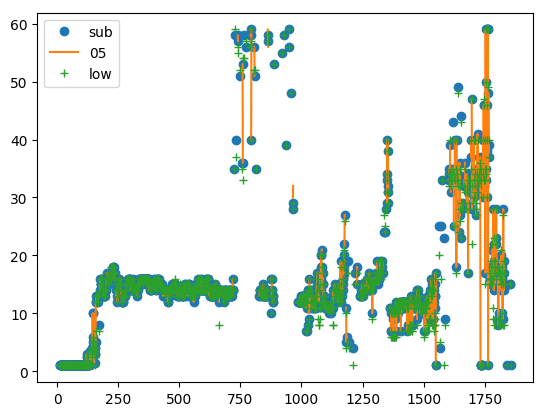

In [51]:
plt.figure()
plt.plot(ta,'o',label='sub')
plt.plot(rts_05[i]['tau'],label='05')
plt.plot(rts_low[i]['tau'],'+',label='low')
plt.legend()

In [108]:
rts = rts_mid

In [109]:
for i,daystr in enumerate(dds):
    ta, re = [],[]
    tmpt = np.array([rts_05[i]['tau'],rts_10[i]['tau'],rts_15[i]['tau'],rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']])
    tmpr = np.array([rts_05[i]['ref'],rts_10[i]['ref'],rts_15[i]['ref'],rts_low[i]['ref'],rts_mid[i]['ref'],rts_65[i]['ref'],rts_80[i]['ref']])
    ta = np.array([tmpt[a,j] for j,a in enumerate(acaod_index[i])])
    re = np.array([tmpr[a,j] for j,a in enumerate(acaod_index[i])])
    rts[i]['tau'] = ta
    rts[i]['ref'] = re

In [110]:
for i,daystr in enumerate(dds):
    try:
        rts[i]['tau_fl'] = smooth(rts[i]['tau'][rts_mid[i]['fl']],2,old=True)
        rts[i]['ref_fl'] = smooth(rts[i]['ref'][rts_mid[i]['fl']],2,old=True)
    except TypeError:
        print 'except',i
        rts[i]['tau_fl'] = rts[i]['tau'][rts_mid[i]['fl']]
        rts[i]['ref_fl'] = rts[i]['ref'][rts_mid[i]['fl']]
    rts[i]['lat_fl'] = rts_mid[i]['lat'][rts_mid[i]['fl']]
    rts[i]['lon_fl'] = rts_mid[i]['lon'][rts_mid[i]['fl']]
    rts[i]['alt_fl'] = rts_mid[i]['alt'][rts_mid[i]['fl']]
    rts[i]['utc_fl'] = rts_mid[i]['utc'][rts_mid[i]['fl']]
    
    rts[i]['tau_err'] = np.nanmax([rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']],axis=0)\
                          - np.nanmin([rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']],axis=0)
    rts[i]['tau_err_fl'] = smooth(rts_mid[i]['tau_err'][rts_mid[i]['fl']],2,old=True)
    rts[i]['ref_err'] = np.nanmax([rts_low[i]['ref'],rts_mid[i]['ref'],rts_65[i]['ref'],rts_80[i]['ref']],axis=0)\
                          - np.nanmin([rts_low[i]['ref'],rts_mid[i]['ref'],rts_65[i]['ref'],rts_80[i]['ref']],axis=0)
    rts[i]['ref_err_fl'] = smooth(rts_mid[i]['ref_err'][rts_mid[i]['fl']],2,old=True)
    
    rts[i]['LWP_fl'] = 5.0/9.0 * rts[i]['tau_fl']* rts[i]['ref_fl']
    rts[i]['LWP_err_fl'] = np.sqrt((5.0/9.0 * rts[i]['ref_fl'] * rts[i]['tau_err_fl'])**2.0+\
                                   (5.0/9.0 * rts[i]['tau_fl'] * rts[i]['ref_err_fl'])**2.0)
    rts[i]['LWP'] = 5.0/9.0 * rts[i]['tau']* rts[i]['ref']
    rts[i]['LWP_err'] = np.sqrt((5.0/9.0 * rts[i]['ref'] * rts[i]['tau_err'])**2.0+\
                                (5.0/9.0 * rts[i]['tau'] * rts[i]['ref_err'])**2.0)
    

In [105]:
#for i,daystr in enumerate(dds):
#    try:
#        rts_mid[i]['tau_fl'] = smooth(rts_mid[i]['tau'][rts_mid[i]['fl']],6,old=True)
#        rts_mid[i]['ref_fl'] = smooth(rts_mid[i]['ref'][rts_mid[i]['fl']],6,old=True)
#    except TypeError:
#        print 'except',i
#        rts_mid[i]['tau_fl'] = rts_mid[i]['tau'][rts_mid[i]['fl']]
#        rts_mid[i]['ref_fl'] = rts_mid[i]['ref'][rts_mid[i]['fl']]
    rts_mid[i]['lat_fl'] = rts_mid[i]['lat'][rts_mid[i]['fl']]
    rts_mid[i]['lon_fl'] = rts_mid[i]['lon'][rts_mid[i]['fl']]
    rts_mid[i]['alt_fl'] = rts_mid[i]['alt'][rts_mid[i]['fl']]
    rts_mid[i]['utc_fl'] = rts_mid[i]['utc'][rts_mid[i]['fl']]
    
    rts_mid[i]['tau_err'] = np.nanmax([rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']],axis=0)\
                          - np.nanmin([rts_low[i]['tau'],rts_mid[i]['tau'],rts_65[i]['tau'],rts_80[i]['tau']],axis=0)
    rts_mid[i]['tau_err_fl'] = smooth(rts_mid[i]['tau_err'][rts_mid[i]['fl']],6,old=True)
    rts_mid[i]['ref_err'] = np.nanmax([rts_low[i]['ref'],rts_mid[i]['ref'],rts_65[i]['ref'],rts_80[i]['ref']],axis=0)\
                          - np.nanmin([rts_low[i]['ref'],rts_mid[i]['ref'],rts_65[i]['ref'],rts_80[i]['ref']],axis=0)
    rts_mid[i]['ref_err_fl'] = smooth(rts_mid[i]['ref_err'][rts_mid[i]['fl']],6,old=True)
    
    rts_mid[i]['LWP_fl'] = 5.0/9.0 * rts_mid[i]['tau_fl']* rts_mid[i]['ref_fl']
    rts_mid[i]['LWP_err_fl'] = np.sqrt((5.0/9.0 * rts_mid[i]['ref_fl'] * rts_mid[i]['tau_err_fl'])**2.0+\
                                       (5.0/9.0 * rts_mid[i]['tau_fl'] * rts_mid[i]['ref_err_fl'])**2.0)
    rts_mid[i]['LWP'] = 5.0/9.0 * rts_mid[i]['tau']* rts_mid[i]['ref']
    rts_mid[i]['LWP_err'] = np.sqrt((5.0/9.0 * rts_mid[i]['ref'] * rts_mid[i]['tau_err'])**2.0+\
                                       (5.0/9.0 * rts_mid[i]['tau'] * rts_mid[i]['ref_err'])**2.0)
    

## Save the acaod indices for easier loading later

In [111]:
dds

['20160827',
 '20160830',
 '20160831',
 '20160902',
 '20160904',
 '20160906',
 '20160908',
 '20160910',
 '20160912',
 '20160914',
 '20160918',
 '20160920',
 '20160924',
 '20160925',
 '20160927']

In [112]:
ind,utc_ind = {},{}
for i,d in enumerate(dds):
    ind[d] = np.array(acaod_index[i])
    utc_ind[d] = np.array(rts[i]['utc'])

In [113]:
files_ind = {
    '0':'ORACLES_lut_v5_05aod.txt',
    '1':'ORACLES_lut_v5_10aod.txt',
    '2':'ORACLES_lut_v5_15aod.txt',
    '3':'ORACLES_lut_v5_lowaod.txt',
    '4':'ORACLES_lut_v5_midaod.txt',
    '5':'ORACLES_lut_v5_65aod.txt',
    '6':'ORACLES_lut_v5_80aod.txt'}

In [114]:
import write_utils as wu

In [115]:
ddd = wu.dict_keys_to_unicode({'files':wu.dict_keys_to_unicode(files_ind),'acaod_index':wu.dict_keys_to_unicode(ind),
                            'utc':wu.dict_keys_to_unicode(utc_ind)})

In [116]:
ddd['files']

{u'0': 'ORACLES_lut_v5_05aod.txt',
 u'1': 'ORACLES_lut_v5_10aod.txt',
 u'2': 'ORACLES_lut_v5_15aod.txt',
 u'3': 'ORACLES_lut_v5_lowaod.txt',
 u'4': 'ORACLES_lut_v5_midaod.txt',
 u'5': 'ORACLES_lut_v5_65aod.txt',
 u'6': 'ORACLES_lut_v5_80aod.txt'}

In [117]:
ddd['acaod_index']['20160827'].dtype

dtype('int64')

In [118]:
hs.savemat(fp+'acaod_index_v5b.mat',ddd)

# Now write these values to ict file

In [119]:
import write_utils as wu

In [120]:
hdict = {'PI':'Samuel LeBlanc',
     'Institution':'NASA Ames Research Center',
     'Instrument':'Spectrometers for Sky-Scanning, Sun-Tracking Atmospheric Research (4STAR)',
     'campaign':'ORACLES 2016',
     'special_comments':'Retrieved cloud properties, averaged over 6 seconds of hyperspectral zenith radiance measurements from 4STAR while under clouds.',
     'PI_contact':'Samuel.leblanc@nasa.gov',
     'platform':'NASA P3',
     'location':'based out of Walvis Bay, Namibia, actual location of measurement included in file',
     'instrument_info':'Derived product from 4STAR zenith measurements',
     'data_info':'Using the cloud property retrieval method based on spectral transmitted light measurements described by LeBlanc, Pileskie, Schmidt, and Coddington (2015), AMT, https://doi.org/10.5194/amt-8-1361-2015 ,modified to include impact of overlying aerosol layer.',
     'uncertainty':'See included variables.',
     'DM_contact':'Samuel LeBlanc, samuel.leblanc@nasa.gov',
     'project_info':'ORACLES 2016 deployment; August-September 2016; Walvis Bay, Namibia',
     'stipulations':'This is a public release of the ORACLES-2016 data set. We strongly recommend that you consult the PI, both for updates to the data set, and for the proper and most recent interpretation of the data for specific science use.',
     'rev_comments':"""R3: Relaxed the kisquare lvalue limit for valid retrievals to 2.0. 
R2: Significant retrieval advancement and bug fixes, reducing COD values by about half. Renewed look-up-table creation accounting for actual above cloud AOD values. 
    Included uncertainties of retrieved products and the calculations of related cloud liquid water path.
R1: Archival for first public release of retrieved cloud properties. Future releases is expected to contain uncertainty estimates. 
    Same filtering and notes on data quality as previous release. Retrieved cloud properties includes the assumption of the presence of an overlying aerosol layer having AOD=0.36, SSA=0.87, and ASY=0.64 at 500 nm.
R0: Preliminary archival of cloud properties retrieved from 4STAR sky radiance measurements. Final radiance calibration not yet applied. Filtered out in-cloud data, bad measurements, and high clouds. 
    Data is subject to uncertainties linked to detector stability, transfer efficiency of light through fiber optic cable, and deposition on the instrument window."""
    }
order = ['LAT','LON','COD','REF','LWP','COD_err','REF_err','LWP_err']

In [121]:
for i,daystr in enumerate(dds):
    d_dict = {'Start_UTC':{'data':rts[i]['utc'][rts[i]['fl']]*3600.0,'unit':'seconds from midnight UTC','long_description':'time keeping'},
              'utc':{'data':rts[i]['utc'][rts[i]['fl']],'unit':'seconds from midnight UTC','long_description':'time keeping'},
          'COD':{'data':rts[i]['tau_fl'],'unit':'None','long_description':'Cloud Optical Depth of overlying cloud'},
          'REF':{'data':rts[i]['ref_fl'],'unit':'micrometer','long_description':'Cloud drop effective radius for liquid clouds'},
          'LAT':{'data':rts[i]['lat'][rts[i]['fl']],'unit':'Degrees','long_description':'Latitude of measurement, negative for Southern hemisphere'},
          'LON':{'data':rts[i]['lon'][rts[i]['fl']],'unit':'Degrees','long_description':'Longitude of measurement, East is positive, from -180 to 180'},
          'COD_err':{'data':rts[i]['tau_err_fl'],'unit':'None','long_description':'Retrieval uncertainty of Cloud Optical Depth'},
          'REF_err':{'data':rts[i]['ref_err_fl'],'unit':'micrometer','long_description':'Retrieval uncertainty of Cloud effective radius. When uncertainty greater than 2 micrometer, retrieval is considered to have failed.'},
          'LWP':{'data':rts[i]['LWP_fl'],'unit':'g/meter^2','long_description':'Calculated Liquid Water Path of overlying cloud, (5/9*COD*REF) assuming linearly increasing effective radius with altitude (based on Wood and Hartmann, 2006, J. Clim., https://doi.org/10.1175/JCLI3702.1)'},
          'LWP_err':{'data':rts[i]['LWP_err_fl'],'unit':'g/meter^2','long_description':'Retrieval uncertainty of Liuid Water Path, based on error propogation of COD_err and ref_err'}
             }
    d_dict_out = wu.prep_data_for_ict(d_dict,in_var_name='utc',out_var_name='Start_UTC', in_input=True,time_interval=1.0)
    wu.write_ict(hdict,d_dict_out,filepath=fp+'..//zen_ict/v5/',
              data_id='4STAR_CLD',loc_id='P3',date=daystr,rev='R3',order=order)    

LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160827_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160830_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160831_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160902_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160904_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_err
File writing successful to: /mnt/c/Users/lebla/Research/ORACLES/starzen/..//zen_ict/v5/4STAR-CLD_P3_20160906_R3.ict
LAT
LON
COD
REF
LWP
COD_err
REF_err
LWP_

## For use of this python, save values to mat files

In [122]:
rtss = {str(i):rr for i,rr in enumerate(rts)}

In [123]:
def dict_keys_to_unicode(d):
    out = dict()
    for k, v in d.items():
        out[k.decode()] = v
    return out

for n in rtss.keys():
    if type(rtss[n]) is list:
        print n
        for i,t in enumerate(rtss[n]):
            rtss[n][i] = dict_keys_to_unicode(t)
    else:
        print 'no',n
        rtss[n] = dict_keys_to_unicode(rtss[n])


no 11
no 10
no 13
no 12
no 14
no 1
no 0
no 3
no 2
no 5
no 4
no 7
no 6
no 9
no 8


In [125]:
hs.savemat(fp+'..//zen_ict/v5/{}_all_retrieved.mat'.format(vv),rtss)

## Optionally load the saved mat files

In [115]:
rtss = hs.loadmat(fp+'..//zen_ict/v5/{}_all_retrieved.mat'.format(vr))

In [34]:
if not 'rts' in locals():
    rts = []
    for n in sorted([int(u) for u in rtss.keys()]):
        rts.append(rtss[str(n)])
elif not rts:
    for n in sorted([int(u) for u in rtss.keys()]):
        rts.append(rtss[str(n)])

# Make plots

## Read the files as a verification

In [126]:
vv = 'R3'

In [127]:
from load_utils import load_ict

In [128]:
out_RA = []
out_head_RA = []
for d in dds:
    fname_aod = fp+'..//zen_ict/v5/4STAR-CLD_P3_{}_{vr}.ict'.format(d,vr=vv)
    tt,th = load_ict(fname_aod,return_header=True)
    out_RA.append(tt)
    out_head_RA.append(th)

('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'LAT', 'LON', 'COD', 'REF', 'LWP', 'COD_err', 'REF_err', 'LWP_err')
('Start_UTC', 'L

In [129]:
out_head_RA[5]

['49, 1001\n',
 'Samuel LeBlanc\n',
 'NASA Ames Research Center\n',
 'Spectrometers for Sky-Scanning, Sun-Tracking Atmospheric Research (4STAR)\n',
 'ORACLES 2016\n',
 '1,1\n',
 '2016,09,06,2019,12,11\n',
 '1.0\n',
 'Start_UTC, Seconds, Time of measurement continuous starting from midnight UTC\n',
 '8\n',
 '1,1,1,1,1,1,1,1\n',
 '-9999.000,-9999.000,-9999.000,-9999.000,-9999.000,-9999.000,-9999.000,-9999.000\n',
 'LAT, Degrees, Latitude of measurement, negative for Southern hemisphere\n',
 'LON, Degrees, Longitude of measurement, East is positive, from -180 to 180\n',
 'COD, None, Cloud Optical Depth of overlying cloud\n',
 'REF, micrometer, Cloud drop effective radius for liquid clouds\n',
 'LWP, g/meter^2, Calculated Liquid Water Path of overlying cloud, (5/9*COD*REF) assuming linearly increasing effective radius with altitude (based on Wood and Hartmann, 2006, J. Clim., https://doi.org/10.1175/JCLI3702.1)\n',
 'COD_err, None, Retrieval uncertainty of Cloud Optical Depth\n',
 'REF_err

In [130]:
nm = out_RA[0].dtype.names

In [131]:
nm

('Start_UTC',
 'LAT',
 'LON',
 'COD',
 'REF',
 'LWP',
 'COD_err',
 'REF_err',
 'LWP_err')

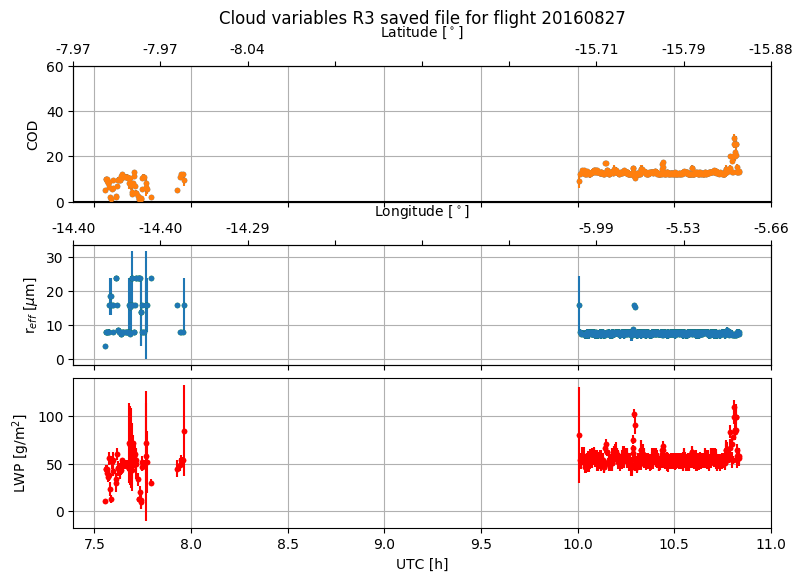

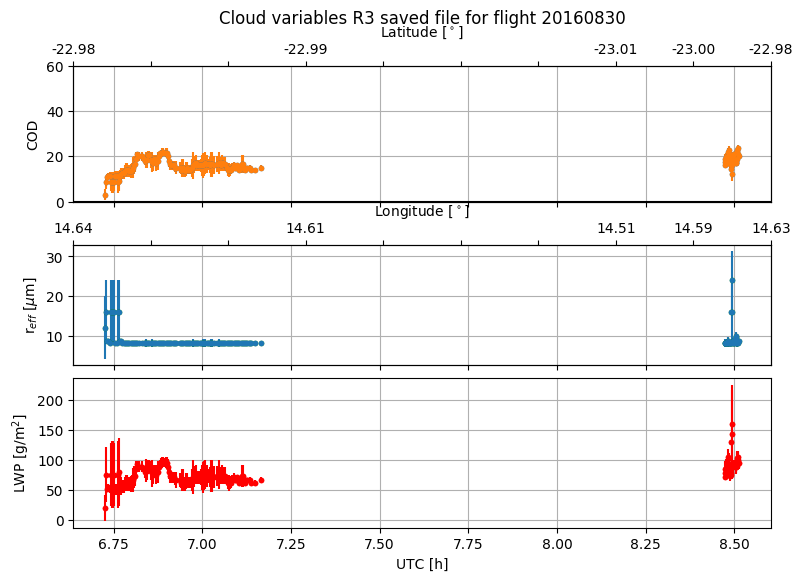

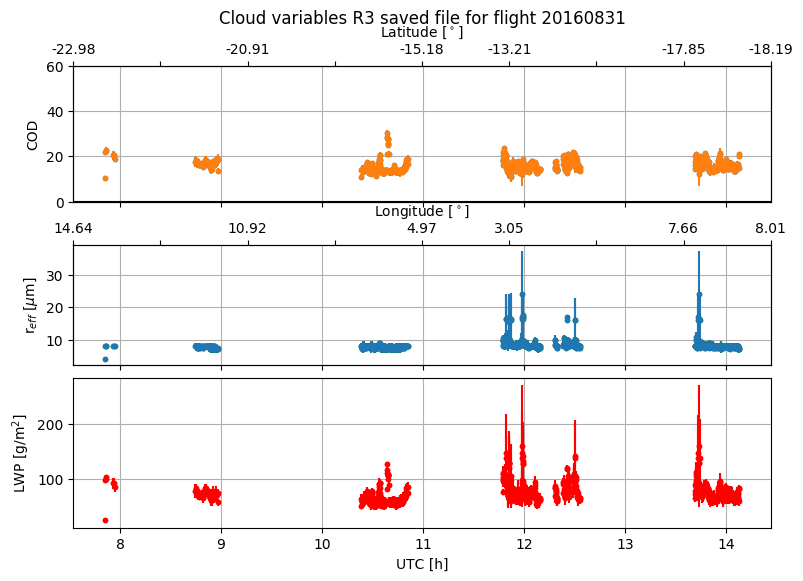

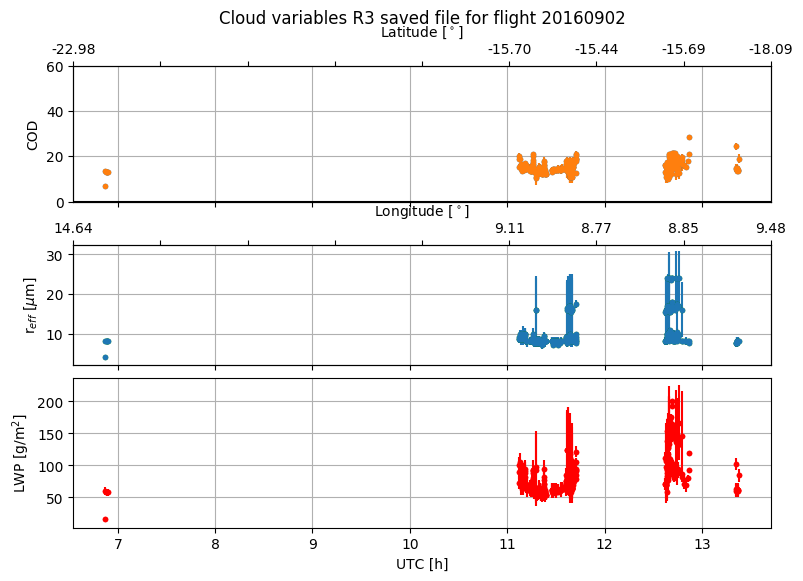

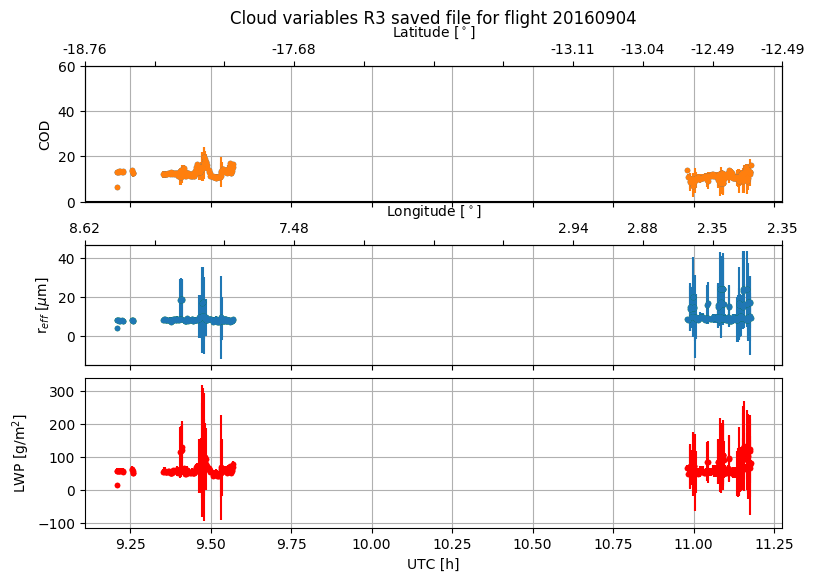

...

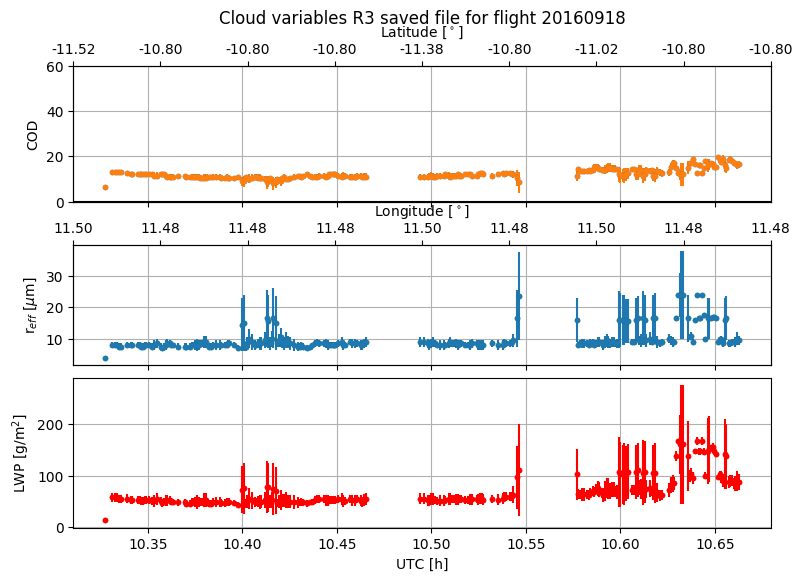

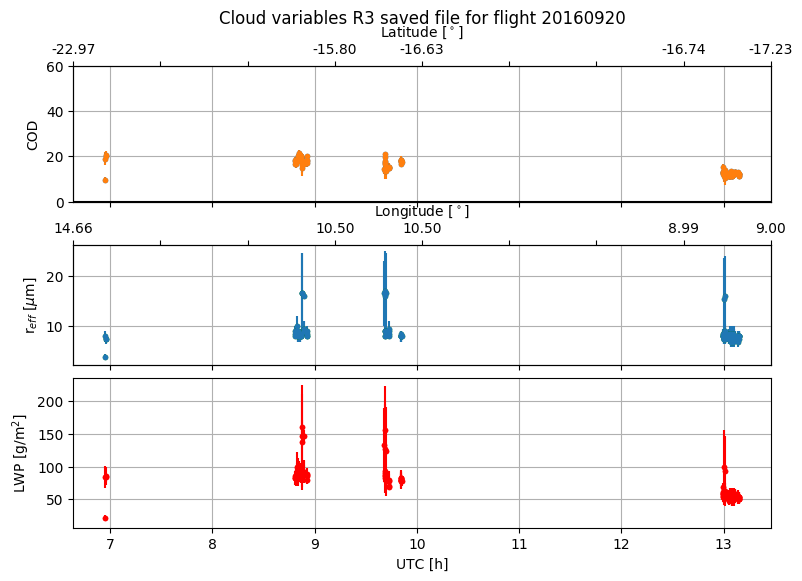

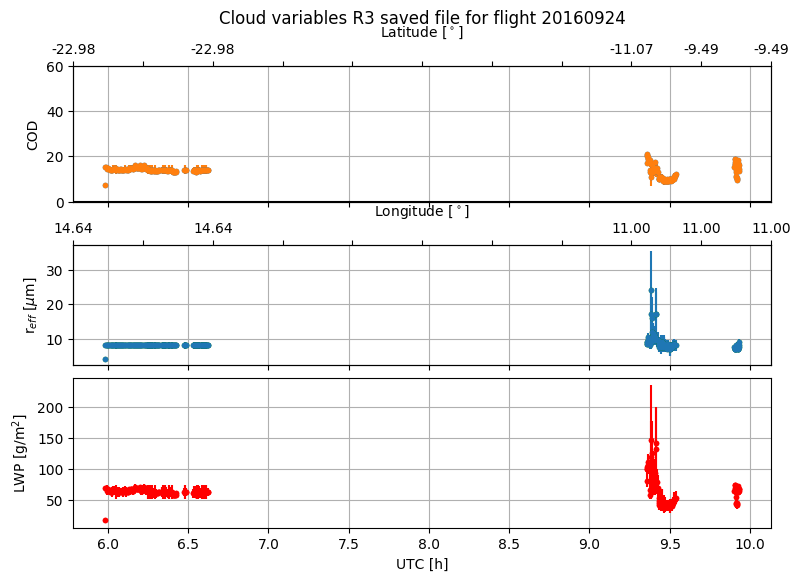

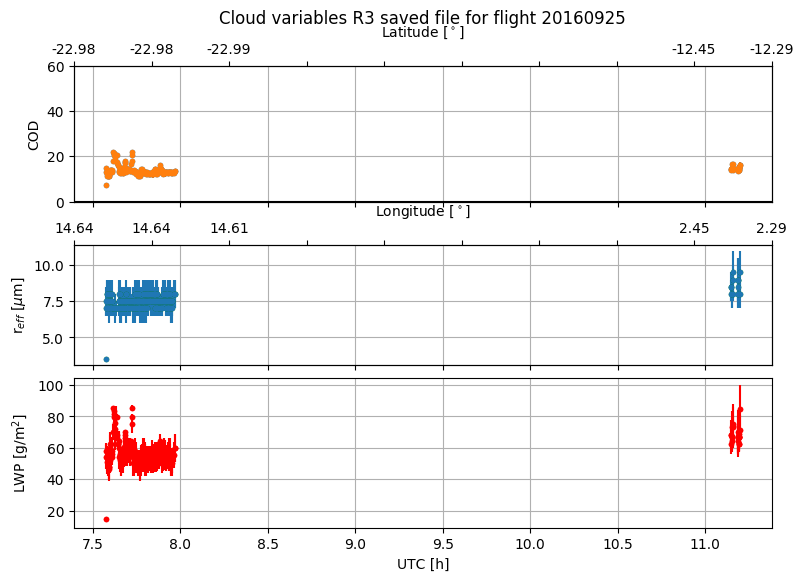

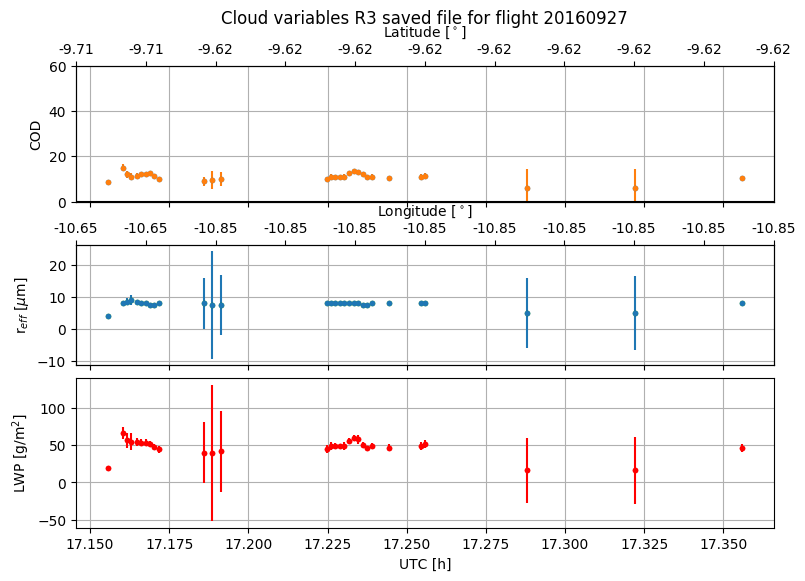

In [132]:
for i,d in enumerate(dds):
    fig,ax = plt.subplots(3,sharex=True,figsize=(9,6))
    ax = ax.ravel()
    ax[0].set_title('Cloud variables {} saved file for flight {}'.format(vv,d),y=1.25)
    #ax[0].set_color_cycle([plt.cm.gist_ncar(k) for k in np.linspace(0, 1, len(wl))])
    ax[0].plot(out_RA[i][nm[0]],out_RA[i]['COD'],'.')
    ax[0].errorbar(out_RA[i][nm[0]],out_RA[i]['COD'],yerr=out_RA[i]['COD_err'],linestyle='None',marker='.')
    ax[0].set_ylabel('COD')
    ax[0].set_ylim(0,60)
    ax[0].axhline(0,color='k')
    ax[0].grid()
    axy0 = ax[0].twiny()
    axy0.set_xlim(ax[0].get_xlim())
    xt = ax[0].get_xticks()
    xl = []
    for x in xt:
        ii = np.argmin(abs(out_RA[i][nm[0]]-x))
        if np.isfinite(out_RA[i]['LAT'][ii]):
            xl.append('{:2.2f}'.format(out_RA[i]['LAT'][ii]))
        else:
            ia = np.isfinite(out_RA[i]['LAT'][ii-1200:ii+1200])
            if any(ia):
                laa = np.interp([1200],np.arange(len(ia))[ia],out_RA[i]['LAT'][ii-1200:ii+1200][ia])
                if not np.isfinite(laa[0]):
                    xl.append(' ')
                else:
                    xl.append('{:2.2f}'.format(laa[0]))
            else: xl.append(' ')
    axy0.set_xticks(xt)
    axy0.set_xticklabels(xl)
    axy0.set_xlabel('Latitude [$^\\circ$]')
    box = ax[0].get_position()
    ax[0].set_position([box.x0, box.y0, box.width, box.height*1.0])
    axy0.set_position([box.x0, box.y0, box.width, box.height*1.0])
    
    ax[1].plot(out_RA[i][nm[0]],out_RA[i]['REF'],'g.')
    ax[1].errorbar(out_RA[i][nm[0]],out_RA[i]['REF'],yerr=out_RA[i]['REF_err'],linestyle='None',marker='.')
    ax[1].set_ylabel('r$_{{eff}}$ [$\\mu$m]')
    #ax[1].set_xlabel('UTC [h]')
    ax[1].grid()
    axy1 = ax[1].twiny()
    axy1.set_xlim(ax[1].get_xlim())
    x1t = ax[1].get_xticks()
    x1l = []
    for x in x1t:
        ii = np.argmin(abs(out_RA[i][nm[0]]-x))
        if np.isfinite(out_RA[i]['LON'][ii]):
            x1l.append('{:2.2f}'.format(out_RA[i]['LON'][ii]))
        else:
            iio = np.isfinite(out_RA[i]['LON'][ii-1200:ii+1200])
            if any(iio):
                loo = np.interp([1200],np.arange(len(iio))[iio],out_RA[i]['LON'][ii-1200:ii+1200][iio])
                if not np.isfinite(loo[0]):
                    x1l.append(' ')
                else:
                    x1l.append('{:2.2f}'.format(loo[0]))
            else: x1l.append(' ')
    axy1.set_xticks(x1t)
    axy1.set_xticklabels(x1l)
    axy1.set_xlabel('Longitude [$^\\circ$]')
    box = ax[1].get_position()
    ax[1].set_position([box.x0, box.y0, box.width, box.height*0.88])
    axy1.set_position([box.x0, box.y0, box.width, box.height*0.88])
    
    ax[2].plot(out_RA[i][nm[0]],out_RA[i]['LWP'],'r.')
    ax[2].errorbar(out_RA[i][nm[0]],out_RA[i]['LWP'],yerr=out_RA[i]['LWP_err'],linestyle='None',marker='.',color='r')
    ax[2].set_ylabel('LWP [g/m$^2$]')
    ax[2].set_xlabel('UTC [h]')
    ax[2].grid()
    box = ax[2].get_position()
    ax[2].set_position([box.x0, box.y0, box.width, box.height*1.1])

    plt.savefig(fp+'..//zen_ict/v5/{vv}_{}.png'.format(d,vv=vv),dpi=600,transparent=True)

In [77]:
nm

('Start_UTC',
 'LAT',
 'LON',
 'COD',
 'REF',
 'LWP',
 'COD_err',
 'REF_err',
 'LWP_err')

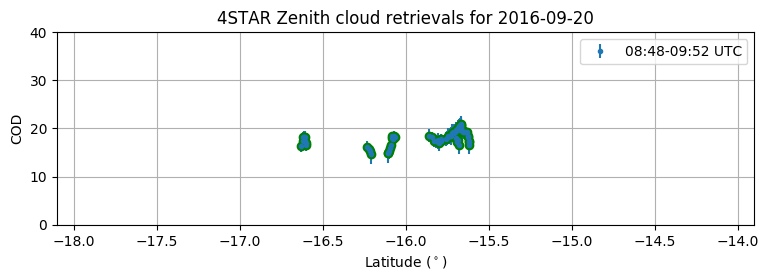

In [97]:
plt.figure(figsize=(9,2.5))
plt.plot(out_RA[0]['LAT'][iu],out_RA[0]['COD'][iu],'og')
plt.errorbar(out_RA[0]['LAT'][iu],out_RA[0]['COD'][iu],yerr=out_RA[0]['COD_err'][iu],linestyle='None',marker='.',label='08:48-09:52 UTC')
plt.grid()
plt.legend(frameon=True)
plt.xlim(-18.1,-13.9)
plt.ylim(0,40)
plt.ylabel('COD')
plt.xlabel('Latitude ($^\\circ$)')
plt.title('4STAR Zenith cloud retrievals for 2016-09-20')
plt.savefig(fp+'..//zen_ict/v5/4STAR-CLD-COD_P3_{}_{vv}.png'.format(d,vv=vv),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


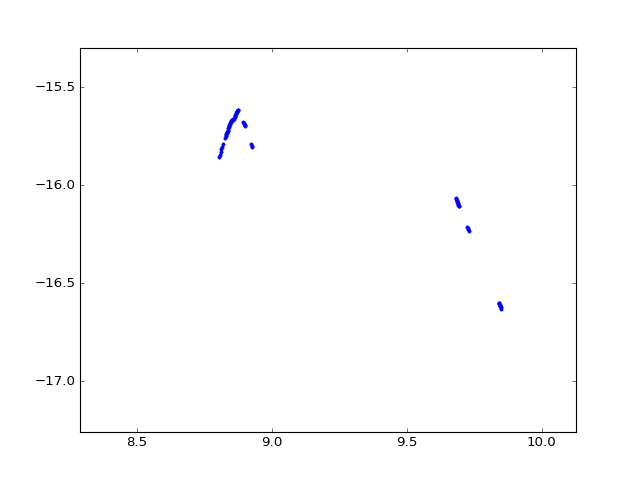

In [36]:
plt.figure()
plt.plot(out_RA[0]['Start_UTC'],out_RA[0]['LAT'],'.')

In [96]:
iu = (out_RA[0]['Start_UTC']>8.8) & (out_RA[0]['Start_UTC']<9.86)

## Combine the data into a single array

In [133]:
ar = {}
for n in rts[0].keys():
    ar[n] = np.array([])

In [134]:
ar['days'] = np.array([])

In [135]:
for i,d in enumerate(dds):
    ar['days'] = np.append(ar['days'],np.zeros_like(rts[i]['utc'])+i)
    for n in rts[0].keys():
        ar[n] = np.append(ar[n],rts[i][n])

## Save the combined array

In [136]:
import hdf5storage as hs

In [137]:
hs.savemat(fp+'..//zen_ict/v5/{}_all_cld_ict.mat'.format(vv),ar)

## Optionally load the all ict file

In [53]:
if not 'ar' in locals():
    ar = hs.loadmat(fp+'..//zen_ict/v5/{}_all_cld_ict.mat'.format(vr))

In [55]:
ar.keys()

[u'fl_alt',
 u'tau',
 u'ref_err',
 u'LWP',
 u'sza',
 u'lat_fl',
 u'lat',
 u'alt',
 u'tau_err_fl',
 u'lon_fl',
 u'tau_err',
 u'alt_fl',
 u'lon',
 u'tau_fl',
 u'LWP_err',
 u'LWP_err_fl',
 u'ref',
 u'ref_err_fl',
 u'fl_ki',
 u'utc_fl',
 u'LWP_fl',
 u'delta',
 u'phase',
 u'fl',
 u'fl_match',
 u'utc',
 u'ki',
 u'days',
 u'fl_incld',
 u'ref_fl']

<IPython.core.display.Javascript object>


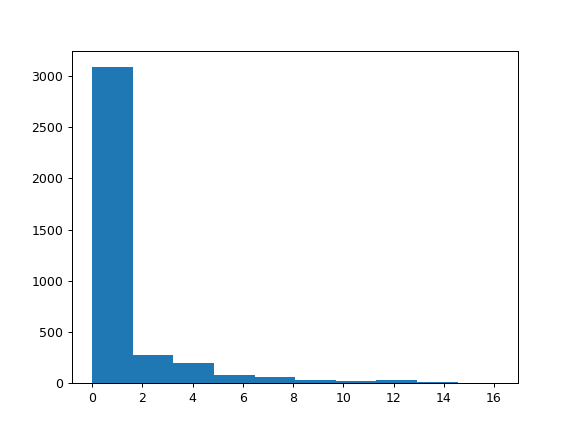

(array([3087.,  275.,  202.,   83.,   59.,   31.,   23.,   37.,   15.,
           4.]),
 array([ 0.        ,  1.61666667,  3.23333333,  4.85      ,  6.46666667,
         8.08333333,  9.7       , 11.31666667, 12.93333333, 14.55      ,
        16.16666667]),
 <a list of 10 Patch objects>)

In [56]:
plt.figure()
plt.hist(ar['ref_err_fl'])

## plot the data on a map

In [54]:
import plotting_utils as pu

In [87]:
from map_interactive import build_basemap

In [88]:
rts[i]['tau_fl']

array([ 5.        ,  6.66666667,  8.        ,  9.33333333,  9.16666667,
        8.08333333,  6.58333333,  5.16666667,  5.5       ,  5.66666667,
        4.66666667,  4.33333333,  4.75      ,  6.16666667,  6.        ,
        6.16666667,  7.33333333,  8.58333333,  9.66666667,  9.83333333,
       10.33333333, 10.66666667, 10.83333333, 11.16666667, 11.33333333,
       11.33333333, 11.16666667, 11.        , 10.83333333, 10.83333333,
        9.83333333,  9.83333333,  9.66666667,  8.66666667,  7.58333333,
        6.25      ,  7.58333333,  7.91666667,  7.91666667,  7.66666667,
        7.75      ,  7.91666667,  5.91666667,  3.91666667,  2.41666667,
        2.16666667,  1.66666667,  1.25      ,  2.75      ,  4.41666667,
        6.08333333,  7.58333333,  8.25      ,  9.33333333,  8.25      ,
        6.58333333,  6.25      ,  6.58333333,  7.58333333,  8.41666667,
        8.83333333, 10.66666667, 11.16666667, 11.16666667, 11.83333333,
       11.83333333, 12.83333333, 12.83333333, 12.83333333, 12.66

In [90]:
for i,daystr in enumerate(dds):
    print rts[i]['lat'][rts[i]['fl']][:,0].shape,rts[i]['lon'][rts[i]['fl']][:,0].shape,rts[i]['tau_fl'].shape

(481,) (481,) (481,)


/home/samuel/.local/lib/python2.7/site-packages/matplotlib/figure.py:457: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


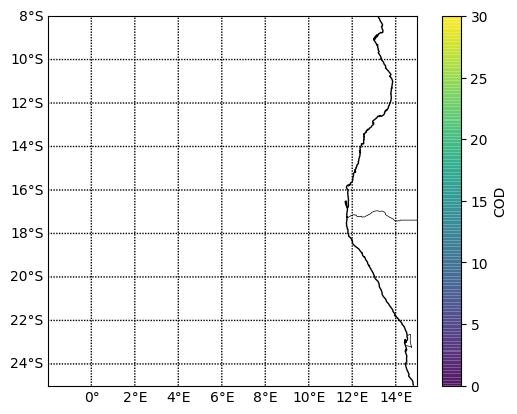

In [92]:
fig = plt.figure()
ax = plt.subplot(111)
m = build_basemap(lower_left=[-2,-25],upper_right=[15,-8],ax=ax,larger=False)
sa = []
for i,daystr in enumerate(dds):
    x,y = m(rts[i]['lon'][rts[i]['fl']][:,0]+i*0.03,rts[i]['lat'][rts[i]['fl']][:,0])
    sca = ax.scatter(x,y,c=rts[i]['tau_fl'],
              s=20,alpha=0.7,vmin=0.0,vmax=30.0,edgecolor='None')
    sa.append(sca)
#pu.prelim()
cb = plt.colorbar(sa[0])
cb.set_label('COD')
plt.savefig(fp+'..//zen_ict/v5/{}_COD_map.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


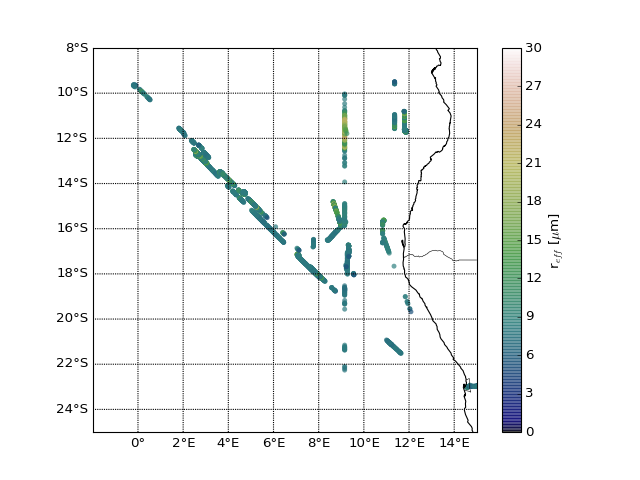

In [92]:
fig = plt.figure()
ax = plt.subplot(111)
m = build_basemap(lower_left=[-2,-25],upper_right=[15,-8],ax=ax,larger=False)
sa = []
for i,daystr in enumerate(dds):
    x,y = m(rts[i]['lon'][rts[i]['fl']][:,0]+i*0.03,rts[i]['lat'][rts[i]['fl']][:,0])
    sca = ax.scatter(x,y,c=rts[i]['ref_fl'],
              s=20,alpha=0.7,vmin=0.0,vmax=30.0,edgecolor='None',cmap=plt.cm.gist_earth)
    sa.append(sca)
#pu.prelim()
cb = plt.colorbar(sa[0])
cb.set_label('r$_{{eff}}$ [$\\mu$m]')
plt.savefig(fp+'..//zen_ict/v5/{}_REF_map.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


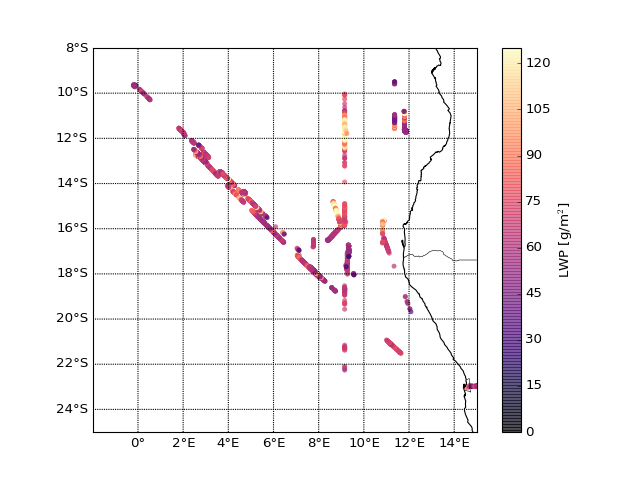

In [93]:
fig = plt.figure()
ax = plt.subplot(111)
m = build_basemap(lower_left=[-2,-25],upper_right=[15,-8],ax=ax,larger=False)
sa = []
for i,daystr in enumerate(dds):
    x,y = m(rts[i]['lon'][rts[i]['fl']][:,0]+i*0.03,rts[i]['lat'][rts[i]['fl']][:,0])
    sca = ax.scatter(x,y,c=rts[i]['LWP_fl'],
              s=20,alpha=0.7,vmin=0.0,vmax=125.0,edgecolor='None',cmap=plt.cm.magma)
    sa.append(sca)
#pu.prelim()
cb = plt.colorbar(sa[0])
cb.set_label('LWP [g/m$^2$]')
plt.savefig(fp+'..//zen_ict/v5/{}_LWP_map.png'.format(vr),transparent=True,dpi=600)

## Plot out some statistics of all retrievals

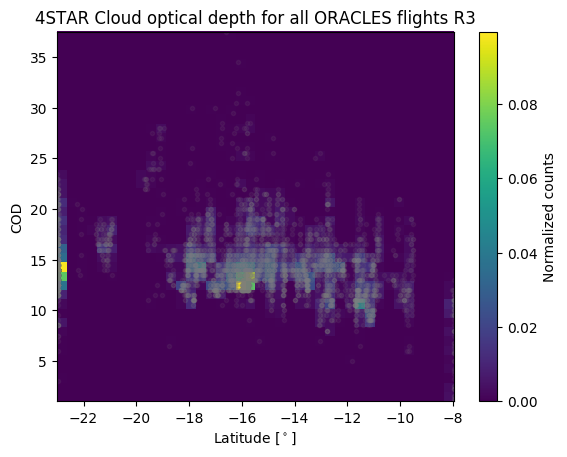

In [138]:
plt.figure()
plt.plot(ar['lat_fl'],ar['tau_fl'],'.',color='grey',alpha=0.1)
plt.hist2d(ar['lat_fl'],ar['tau_fl'],bins=40,normed=True)
plt.xlabel('Latitude [$^\\circ$]')
plt.ylabel('COD')
cb = plt.colorbar()
cb.set_label('Normalized counts')
plt.title('4STAR Cloud optical depth for all ORACLES flights {}'.format(vv))
plt.savefig(fp+'..//zen_ict/v5/{}_COD_hist_lat.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


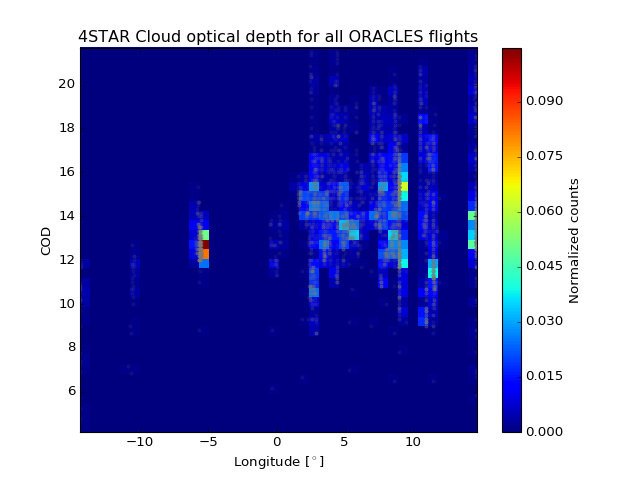

In [95]:
plt.figure()
plt.plot(ar['lon_fl'],ar['tau_fl'],'.',color='grey',alpha=0.1)
plt.hist2d(ar['lon_fl'],ar['tau_fl'],bins=40,normed=True)
plt.xlabel('Longitude [$^\\circ$]')
plt.ylabel('COD')
cb = plt.colorbar()
cb.set_label('Normalized counts')
plt.title('4STAR Cloud optical depth for all ORACLES flights')
plt.savefig(fp+'..//zen_ict/v5/COD_hist_lon.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


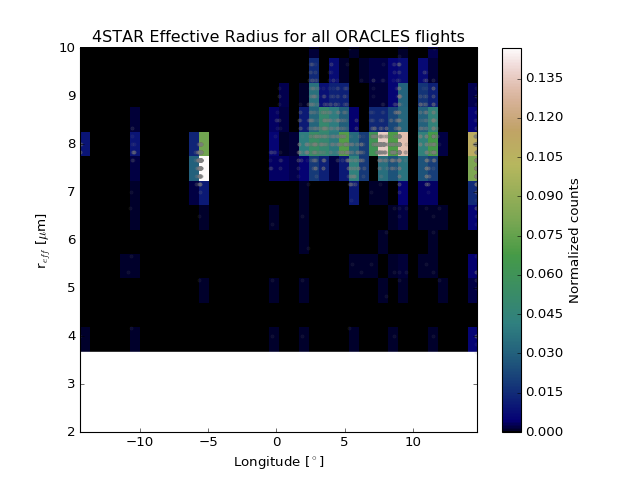

In [96]:
plt.figure()
plt.plot(ar['lon_fl'],ar['ref_fl'],'.',color='grey',alpha=0.1)
plt.hist2d(ar['lon_fl'],ar['ref_fl'],bins=40,normed=True,cmap=plt.cm.gist_earth)
plt.xlabel('Longitude [$^\\circ$]')
plt.ylabel('r$_{{eff}}$ [$\\mu$m]')
plt.ylim(2,10)
cb = plt.colorbar()
cb.set_label('Normalized counts')
plt.title('4STAR Effective Radius for all ORACLES flights')
plt.savefig(fp+'..//zen_ict/v5/ref_hist_lon.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


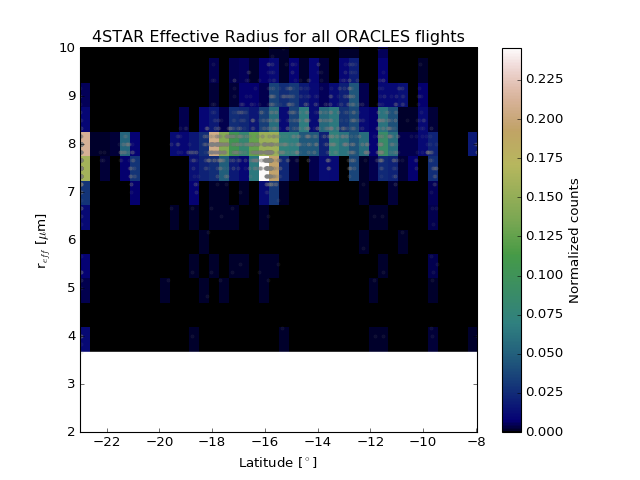

In [97]:
plt.figure()
plt.plot(ar['lat_fl'],ar['ref_fl'],'.',color='grey',alpha=0.1)
plt.hist2d(ar['lat_fl'],ar['ref_fl'],bins=40,normed=True,cmap=plt.cm.gist_earth)
plt.ylim(2,10)
plt.xlabel('Latitude [$^\\circ$]')
plt.ylabel('r$_{{eff}}$ [$\\mu$m]')
cb = plt.colorbar()
cb.set_label('Normalized counts')
plt.title('4STAR Effective Radius for all ORACLES flights')
plt.savefig(fp+'..//zen_ict/v5/ref_hist_lat.png',transparent=True,dpi=600)

/home/samuel/.local/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6571: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


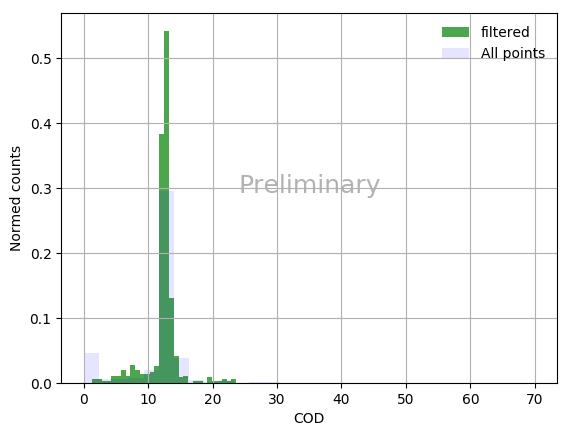

In [98]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=True,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='All points')
plt.ylabel('Normed counts')
plt.xlabel('COD')
plt.grid()
pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/R3_cod_hist.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


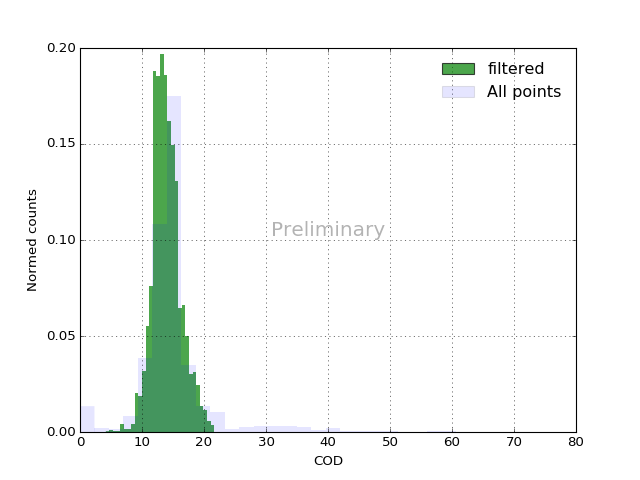

In [98]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=True,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='All points')
plt.ylabel('Normed counts')
plt.xlabel('COD')
plt.grid()
pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/cod_hist.png',transparent=True,dpi=600)

In [128]:
ar.keys()

NameError: name 'ar' is not defined

In [100]:
aam = ar['utc_fl']<12.0
apm = ar['utc_fl']>12.0

<IPython.core.display.Javascript object>


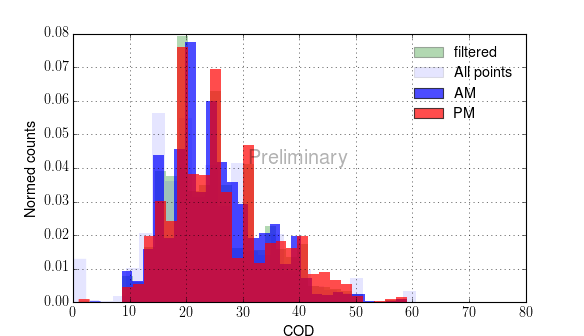

In [12]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.3,normed=True,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='All points')
plt.hist(ar['tau_fl'][aam],bins=30,edgecolor='None',color='b',alpha=0.7,normed=True,label='AM')
plt.hist(ar['tau_fl'][apm],bins=30,edgecolor='None',color='r',alpha=0.7,normed=True,label='PM')
plt.ylabel('Normed counts')
plt.xlabel('COD')
plt.grid()
pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v3/cod_hist_pm_am.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


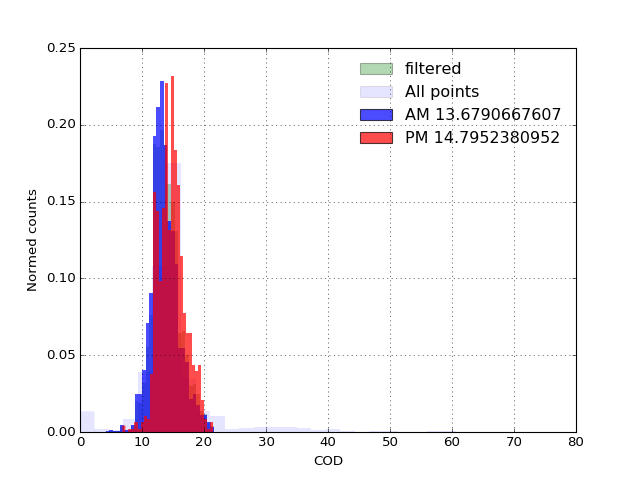

In [108]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.3,normed=True,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='All points')
plt.hist(ar['tau_fl'][aam],bins=30,edgecolor='None',color='b',alpha=0.7,normed=True,label='AM {}'.format(np.nanmean(ar['tau_fl'][aam])))
plt.hist(ar['tau_fl'][apm],bins=30,edgecolor='None',color='r',alpha=0.7,normed=True,label='PM {}'.format(np.nanmean(ar['tau_fl'][apm])))
plt.ylabel('Normed counts')
plt.xlabel('COD')
plt.grid()
#pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/cod_hist_pm_am.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


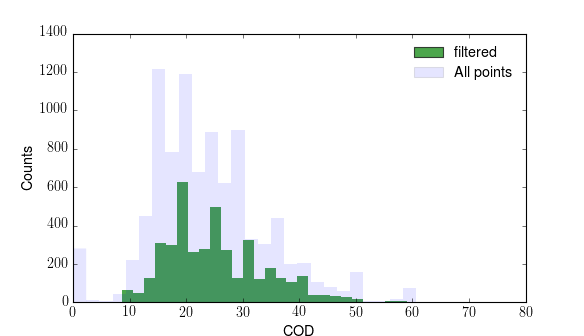

In [94]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=False,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=False,range=(0,70),label='All points')
plt.ylabel('Counts')
plt.xlabel('COD')
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v3/cod_hist_all.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


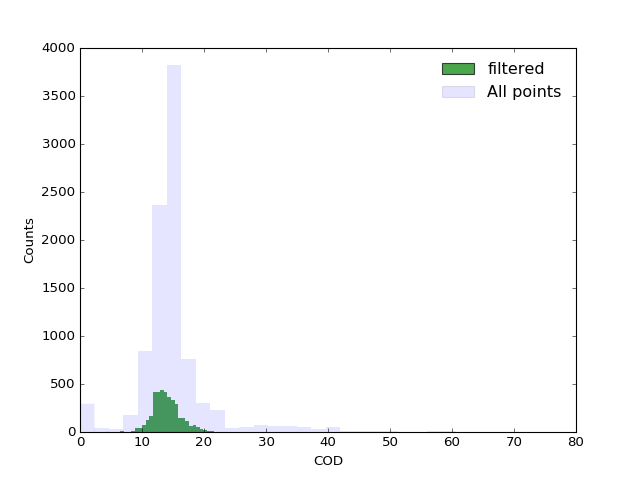

In [102]:
fig = plt.figure()
plt.hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=False,label='filtered')
plt.hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=False,range=(0,70),label='All points')
plt.ylabel('Counts')
plt.xlabel('COD')
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/cod_hist_all.png',transparent=True,dpi=600)

In [103]:
np.nanmean(ar['tau_fl'])

13.965714535290006

In [104]:
np.nanmean(ar['ref_fl'])

9.012928022361983

<IPython.core.display.Javascript object>


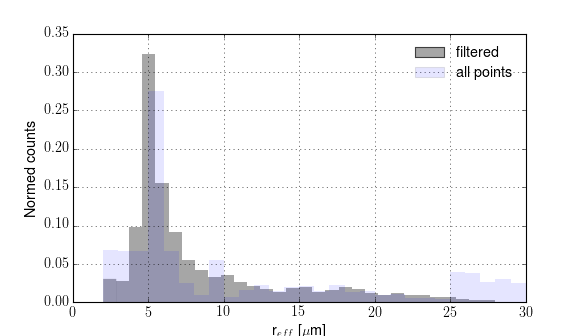

In [102]:
fig = plt.figure()
plt.hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=True,label='filtered')
plt.hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,30),label='all points')
plt.ylabel('Normed counts')
plt.xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.grid()
#pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v3/{}_ref_hist.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


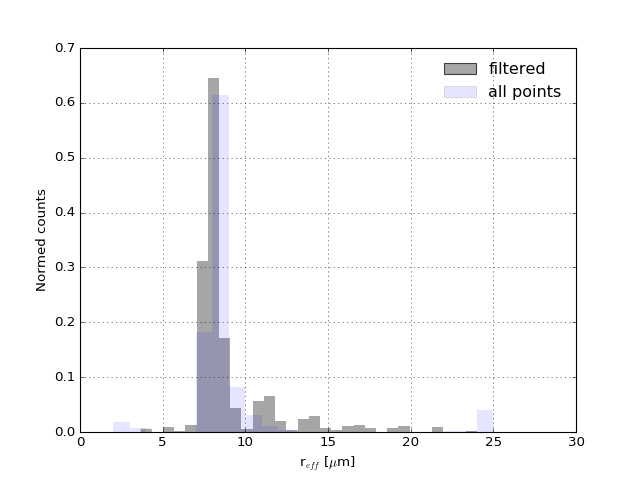

In [105]:
fig = plt.figure()
plt.hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=True,label='filtered')
plt.hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,30),label='all points')
plt.ylabel('Normed counts')
plt.xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.grid()
#pu.prelim()
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/{}_ref_hist.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


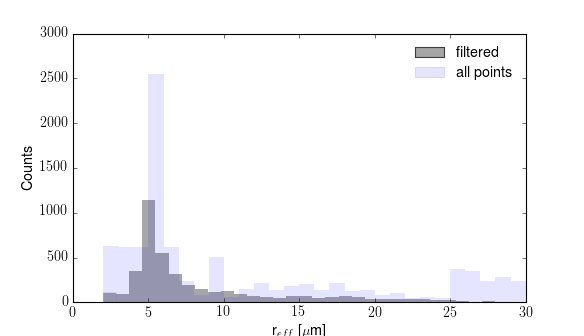

In [101]:
fig = plt.figure()
plt.hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=False,label='filtered')
plt.hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=False,range=(0,30),label='all points')
plt.ylabel('Counts')
plt.xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v3/{}_ref_hist_all.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


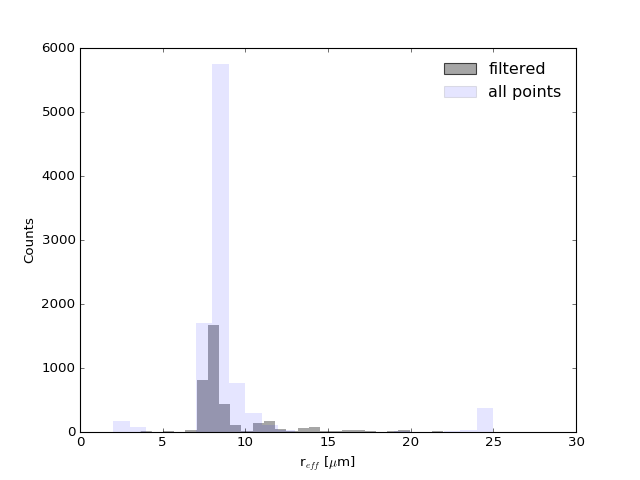

In [106]:
fig = plt.figure()
plt.hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=False,label='filtered')
plt.hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=False,range=(0,30),label='all points')
plt.ylabel('Counts')
plt.xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.legend(frameon=False)
plt.savefig(fp+'..//zen_ict/v5/{}_ref_hist_all.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


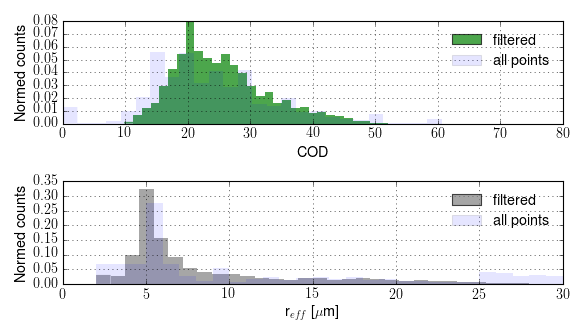

In [100]:
fig,ax = plt.subplots(2,1)
ax = ax.ravel()
ax[0].hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=True,label='filtered')
ax[0].hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='all points')
ax[0].set_ylabel('Normed counts')
ax[0].set_xlabel('COD')
ax[0].grid()
#pu.prelim(ax=ax[0])
ax[0].legend(frameon=False)

ax[1].hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=True,label='filtered')
ax[1].hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,30),label='all points')
ax[1].set_ylabel('Normed counts')
ax[1].set_xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.grid()
#pu.prelim(ax=ax[1])
plt.legend(frameon=False)

plt.tight_layout()

plt.savefig(fp+'..//zen_ict/v3/{}_ref_cod_hist.png'.format(vr),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


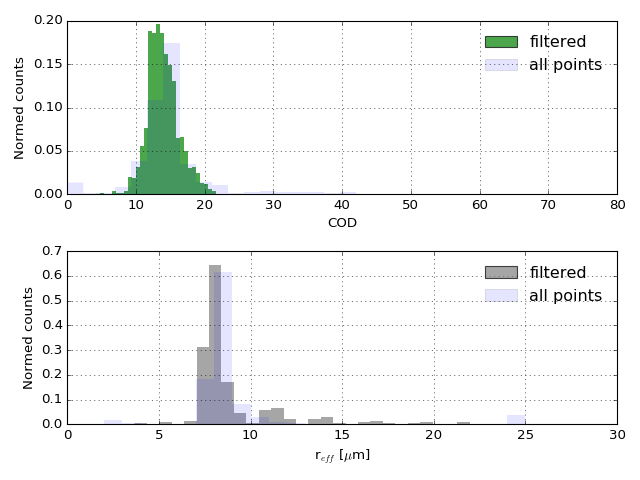

In [107]:
fig,ax = plt.subplots(2,1)
ax = ax.ravel()
ax[0].hist(ar['tau_fl'],bins=30,edgecolor='None',color='g',alpha=0.7,normed=True,label='filtered')
ax[0].hist(ar['tau'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,70),label='all points')
ax[0].set_ylabel('Normed counts')
ax[0].set_xlabel('COD')
ax[0].grid()
#pu.prelim(ax=ax[0])
ax[0].legend(frameon=False)

ax[1].hist(ar['ref_fl'],bins=30,edgecolor='None',color='grey',alpha=0.7,normed=True,label='filtered')
ax[1].hist(ar['ref'],bins=30,edgecolor='None',color='b',alpha=0.1,normed=True,range=(0,30),label='all points')
ax[1].set_ylabel('Normed counts')
ax[1].set_xlabel('r$_{{eff}}$ [$\\mu$m]')
plt.grid()
#pu.prelim(ax=ax[1])
plt.legend(frameon=False)

plt.tight_layout()

plt.savefig(fp+'..//zen_ict/v5/{}_ref_cod_hist.png'.format(vr),transparent=True,dpi=600)

# Evaluate the Cloud Radiative Effect (CRE) from calculated retrieved values

Based on the calculations of CRE found in Link to [ORACLES_cld_CRE](ORACLES_cld_CRE.ipynb)

After running calculations on Pleaides, results are read in and operated

## Load results

In [76]:
fp

u'/mnt/c/Users/lebla/Research/ORACLES/starzen/'

In [229]:
vv = 'v5b'

In [230]:
c = hs.loadmat(fp+'../ORACLES_CRE_{}.mat'.format(vv))

In [231]:
c.keys()

[u'star_aero_CRE',
 u'star_noaero_C',
 u'star_noaero_CRE',
 u'star_noaero_CRE_clear',
 u'star_aero_CRE_clear',
 u'star_aero_C']

In [232]:
c['star_aero_C']

array([[ -32.067543  ,  -33.94471   ,  -32.20283945],
       [ -31.949881  ,  -33.11417   ,  -31.38983944],
       [ -32.767832  ,  -33.32529   ,  -31.57611942],
       ...,
       [-152.975188  , -148.50142   , -136.27535731],
       [-136.124119  , -133.47423   , -122.53959765],
       [-130.759276  , -129.98035   , -119.44640773]])

In [233]:
c['star_aero_CRE'].keys()

[u'dn', u'up']

In [234]:
CRE_aero = c['star_aero_CRE']['up'][:,2] -c['star_aero_CRE_clear']['up'][:,2] 
CRE_noaero = c['star_noaero_CRE']['up'][:,2] -c['star_noaero_CRE_clear']['up'][:,2] 

In [1]:
ca = hs.loadmat(fp+'../ORACLES_CRE_aerosol_{}.mat'.format(vv))

NameError: name 'hs' is not defined

<IPython.core.display.Javascript object>


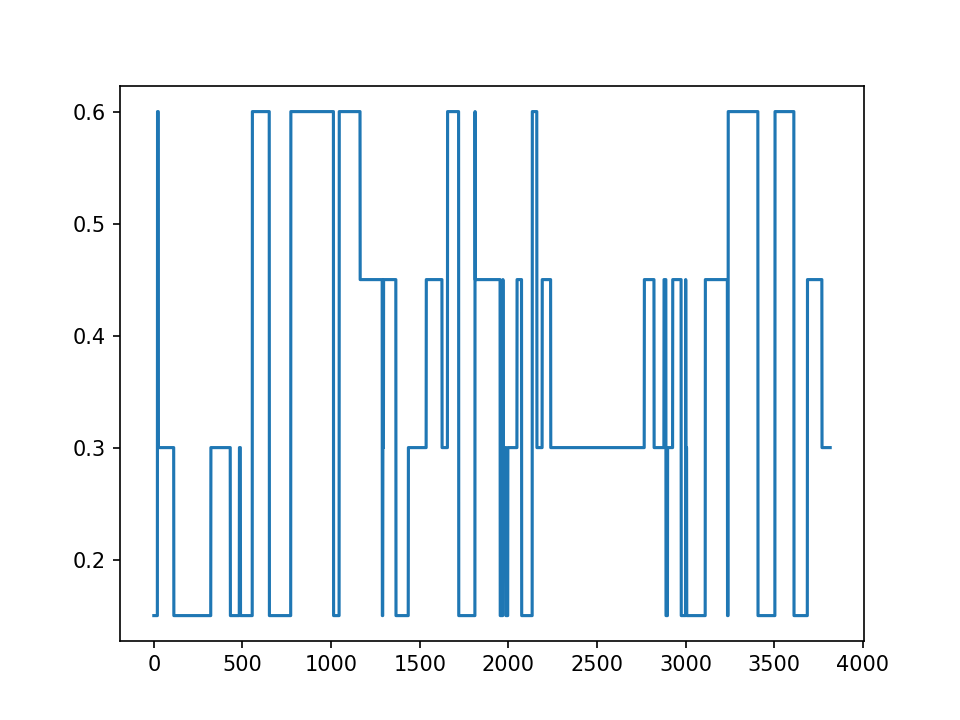

In [320]:
plt.figure()
plt.plot(ca['aod'][:,3])

## Start plotting results of CRE

In [83]:
import plotting_utils as pu

<IPython.core.display.Javascript object>


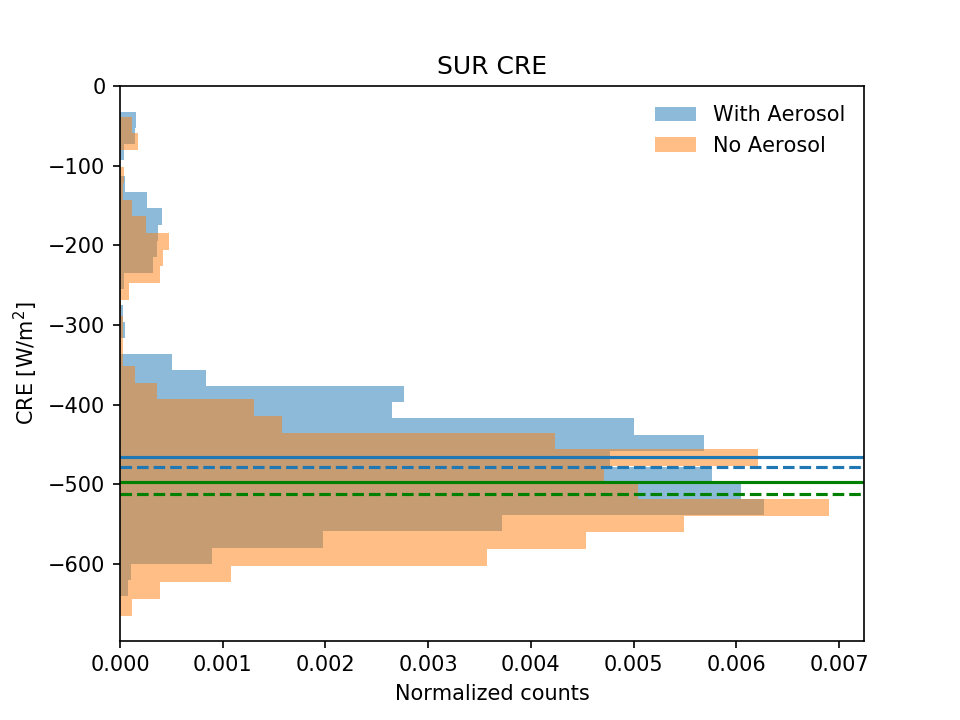

In [235]:
plt.figure()
plt.hist(c['star_aero_C'][:,0],alpha=0.5,label='With Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.hist(c['star_noaero_C'][:,0],alpha=0.5,label='No Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.axhline(np.nanmean(c['star_aero_C'][:,0]))
plt.axhline(np.nanmedian(c['star_aero_C'][:,0]),linestyle='--')

plt.axhline(np.nanmean(c['star_noaero_C'][:,0]),color='g')
plt.axhline(np.nanmedian(c['star_noaero_C'][:,0]),color='g',linestyle='--')

#plt.xlim(0,0.0035)
plt.legend(frameon=False,loc=1)
plt.ylabel('CRE [W/m$^2$]')
plt.title('SUR CRE')
plt.xlabel('Normalized counts')
plt.savefig(fp_plot+'ORACLES_SUR_CRE_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


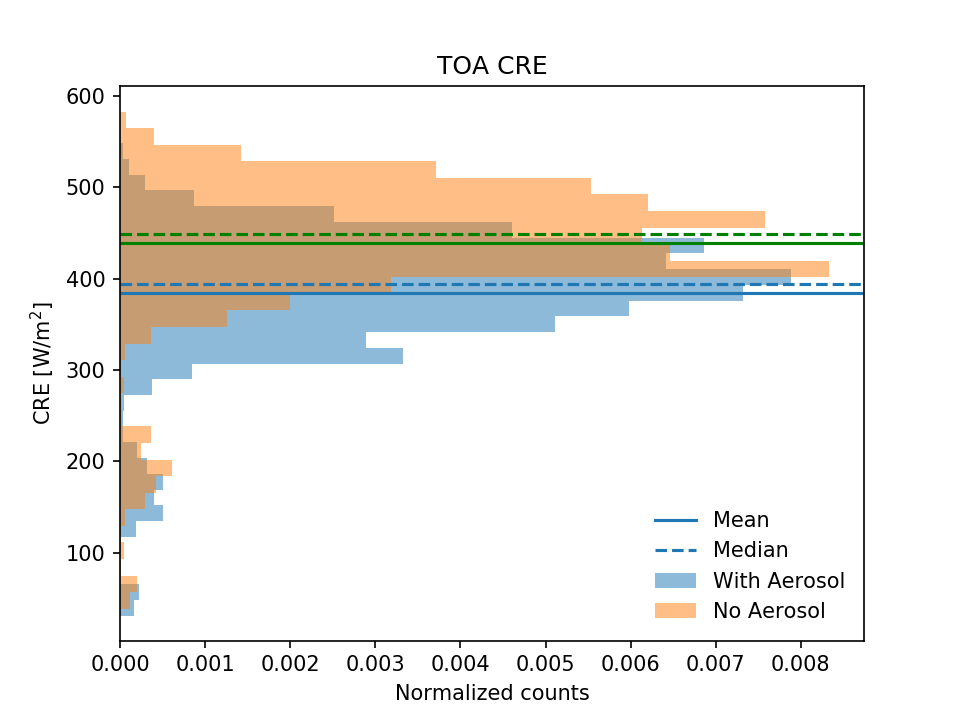

In [236]:
plt.figure()
plt.hist(CRE_aero,alpha=0.5,label='With Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.hist(CRE_noaero,alpha=0.5,label='No Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.axhline(np.nanmean(CRE_aero),label='Mean')
plt.axhline(np.nanmedian(CRE_aero),linestyle='--',label='Median')

plt.axhline(np.nanmean(CRE_noaero),color='g')
plt.axhline(np.nanmedian(CRE_noaero),color='g',linestyle='--')
#plt.xlim(0,0.0035)
plt.legend(frameon=False,loc=4)
plt.ylabel('CRE [W/m$^2$]')
plt.title('TOA CRE')
plt.xlabel('Normalized counts')
plt.savefig(fp_plot+'ORACLES_TOA_CRE_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


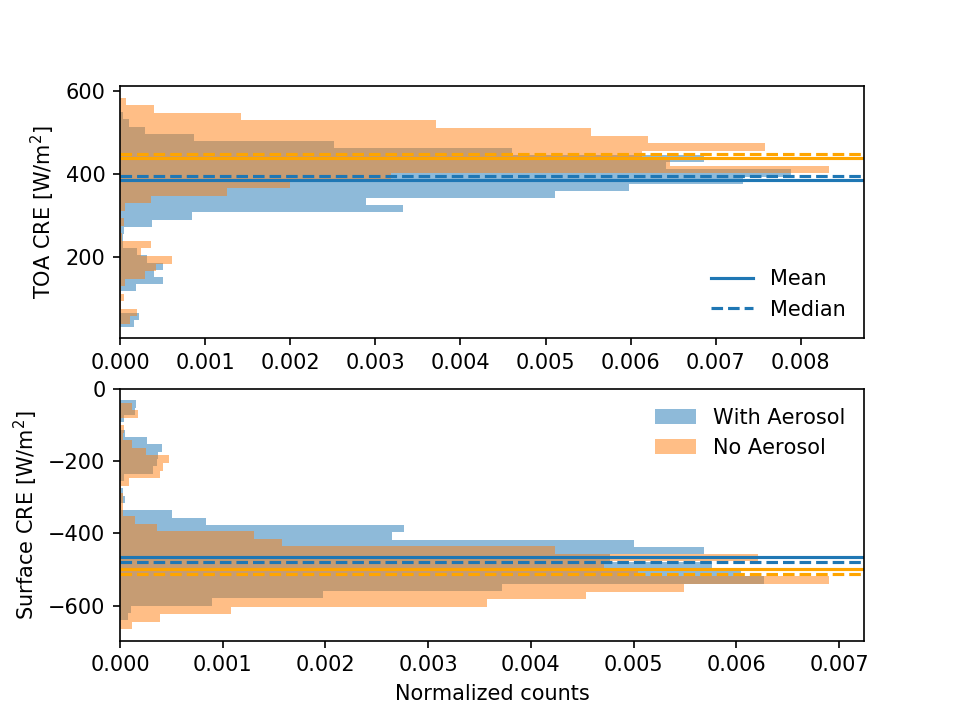

In [237]:
plt.figure()
plt.subplot(2,1,1)
plt.hist(CRE_aero,alpha=0.5,edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.hist(CRE_noaero,alpha=0.5,edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.axhline(np.nanmean(CRE_aero),label='Mean')
plt.axhline(np.nanmedian(CRE_aero),linestyle='--',label='Median')

plt.axhline(np.nanmean(CRE_noaero),color='orange')
plt.axhline(np.nanmedian(CRE_noaero),color='orange',linestyle='--')
#plt.xlim(0,0.0035)
plt.legend(frameon=False,loc=4)
plt.ylabel('TOA CRE [W/m$^2$]')

plt.subplot(2,1,2)
plt.hist(c['star_aero_C'][:,0],alpha=0.5,label='With Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.hist(c['star_noaero_C'][:,0],alpha=0.5,label='No Aerosol',edgecolor='None',normed=True,orientation='horizontal',bins=30)
plt.axhline(np.nanmean(c['star_aero_C'][:,0]))
plt.axhline(np.nanmedian(c['star_aero_C'][:,0]),linestyle='--')

plt.axhline(np.nanmean(c['star_noaero_C'][:,0]),color='orange')
plt.axhline(np.nanmedian(c['star_noaero_C'][:,0]),color='orange',linestyle='--')

#plt.xlim(0,0.0035)
plt.legend(frameon=False,loc=1)
plt.ylabel('Surface CRE [W/m$^2$]')
plt.xlabel('Normalized counts')
plt.savefig(fp_plot+'ORACLES_SUR_TOA_CRE_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


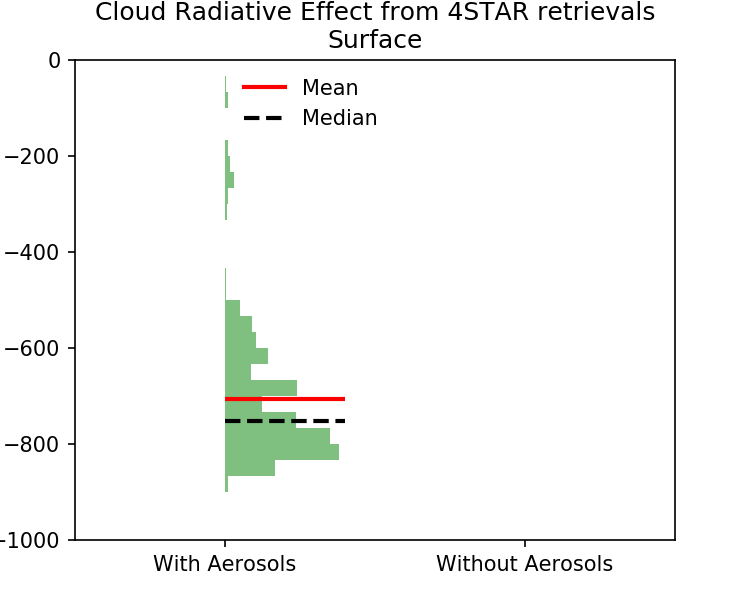

/home/samuel/.local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


ValueError: Width and height specified must be non-negative

In [102]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-1000,0],xlim=[-0.5,1.5])
ax1.set_ylabel('Cloud Radiative Effect [W/m$^2$]')
ax1.set_title('Cloud Radiative Effect from 4STAR retrievals\nSurface')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,c['star_aero_C'][:,0],0,[-1000,0],legend=True,onlyhist=False,loc=2,color='g',bins=30)
pu.plot_vert_hist(fig,ax1,c['star_noaero_C'][:,0],1,[-1000,0],legend=True,color='r',bins=30)
plt.savefig(fp+'../plot/ORACLES_surface_CRE_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


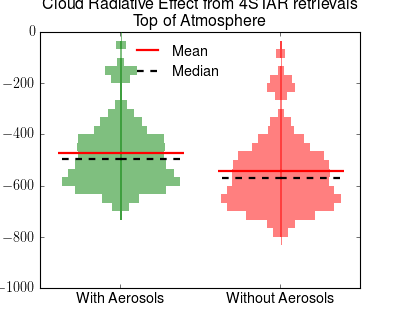

In [43]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-1000,0],xlim=[-0.5,1.5])
ax1.set_ylabel('Cloud Radiative Effect [W/m$^2$]')
ax1.set_title('Cloud Radiative Effect from 4STAR retrievals\nTop of Atmosphere')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,c['star_aero_C'][:,2],0,[-1000,0],legend=True,onlyhist=False,loc=2,color='g',bins=30)
pu.plot_vert_hist(fig,ax1,c['star_noaero_C'][:,2],1,[-1000,0],legend=True,color='r',bins=30)
plt.savefig(fp+'../plot/ORACLES_CRE_toa_4STAR.png',transparent=True,dpi=600)

In [238]:
print 'Surface CRE'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(c['star_aero_C'][:,0]),np.nanmean(c['star_noaero_C'][:,0]))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(c['star_aero_C'][:,0]),np.nanmedian(c['star_noaero_C'][:,0]))
print 'std aero: {}, no aero: {}'.format(np.nanstd(c['star_aero_C'][:,0]),np.nanstd(c['star_noaero_C'][:,0]))

Surface CRE
mean aero: -465.351602669, no aero: -497.7263001
median aero: -478.753291951, no aero: -512.492852741
std aero: 85.2393008031, no aero: 87.1436008012


In [239]:
print 'TOA CRE'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(c['star_aero_C'][:,2]),np.nanmean(c['star_noaero_C'][:,2]))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(c['star_aero_C'][:,2]),np.nanmedian(c['star_noaero_C'][:,2]))
print 'std aero: {}, no aero: {}'.format(np.nanstd(c['star_aero_C'][:,2]),np.nanstd(c['star_noaero_C'][:,2]))

TOA CRE
mean aero: -384.740906513, no aero: -438.684009105
median aero: -394.430641252, no aero: -448.421804307
std aero: 68.6891694784, no aero: 73.4813216012


<IPython.core.display.Javascript object>


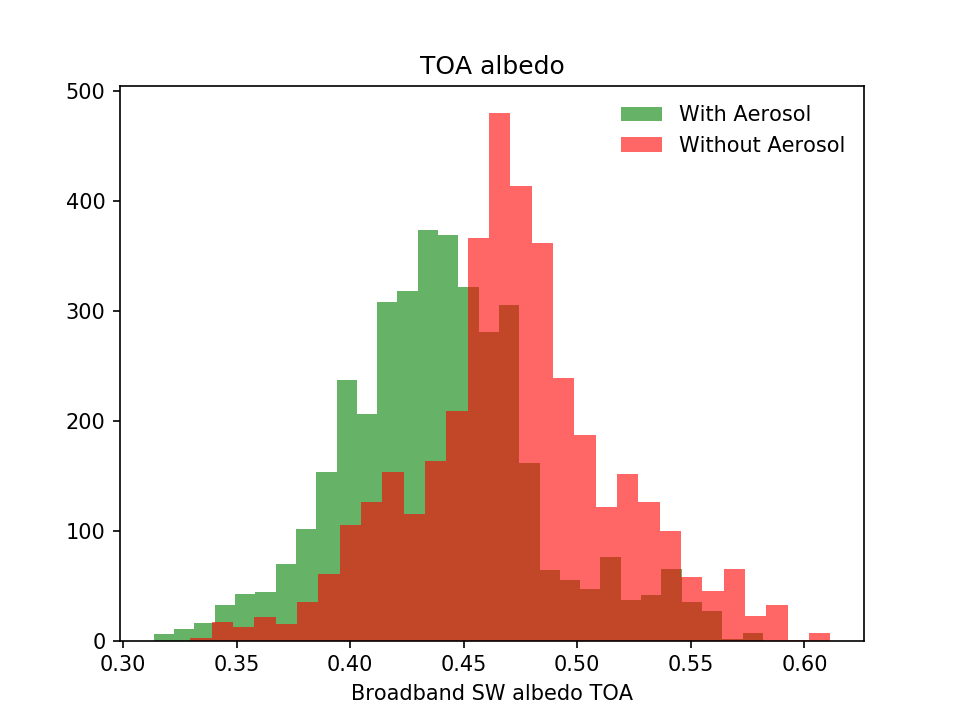

In [240]:
plt.figure()
plt.hist(c['star_aero_CRE']['up'][:,2]/c['star_aero_CRE']['dn'][:,2],normed=False,edgecolor='None',color='g',
         alpha=0.6,label='With Aerosol',bins=30)
plt.hist(c['star_noaero_CRE']['up'][:,2]/c['star_noaero_CRE']['dn'][:,2],normed=False,edgecolor='None',color='r',
         alpha=0.6,label='Without Aerosol',bins=30)
plt.xlabel('Broadband SW albedo TOA')
plt.legend(frameon=False)
plt.title('TOA albedo')
plt.savefig(fp+'../plot/ORACLES_albedo_toa_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

## calculate and plot the relative CRE

### Setup alternate calculations

In [241]:
rCRE_sur_aero = c['star_aero_C'][:,0]/c['star_aero_CRE_clear']['dn'][:,2]*100.0 
rCRE_sur_noaero = c['star_noaero_C'][:,0]/c['star_aero_CRE_clear']['dn'][:,2]*100.0 
rCRE_toa_aero = CRE_aero/c['star_aero_CRE_clear']['dn'][:,2]*100.0 
rCRE_toa_noaero = CRE_noaero/c['star_aero_CRE_clear']['dn'][:,2]*100.0

In [242]:
rCRE_sur_daero = rCRE_sur_aero-rCRE_sur_noaero
rCRE_toa_daero = rCRE_toa_aero-rCRE_toa_noaero

<IPython.core.display.Javascript object>


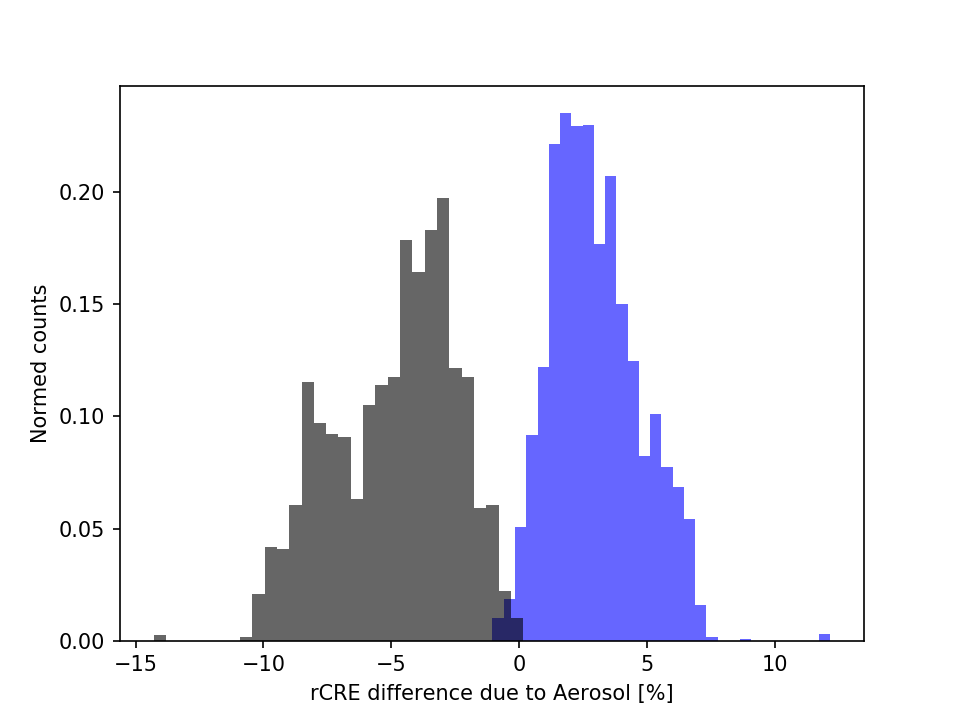

Text(0,0.5,'Normed counts')

In [243]:
plt.figure()
plt.hist(rCRE_sur_daero,normed=True,edgecolor='None',color='blue',alpha=0.6,label='Surface',bins=30)
plt.hist(rCRE_toa_daero,normed=True,edgecolor='None',color='k',alpha=0.6,label='TOA',bins=30)
plt.xlabel('rCRE difference due to Aerosol [%]')
plt.ylabel('Normed counts')

<IPython.core.display.Javascript object>


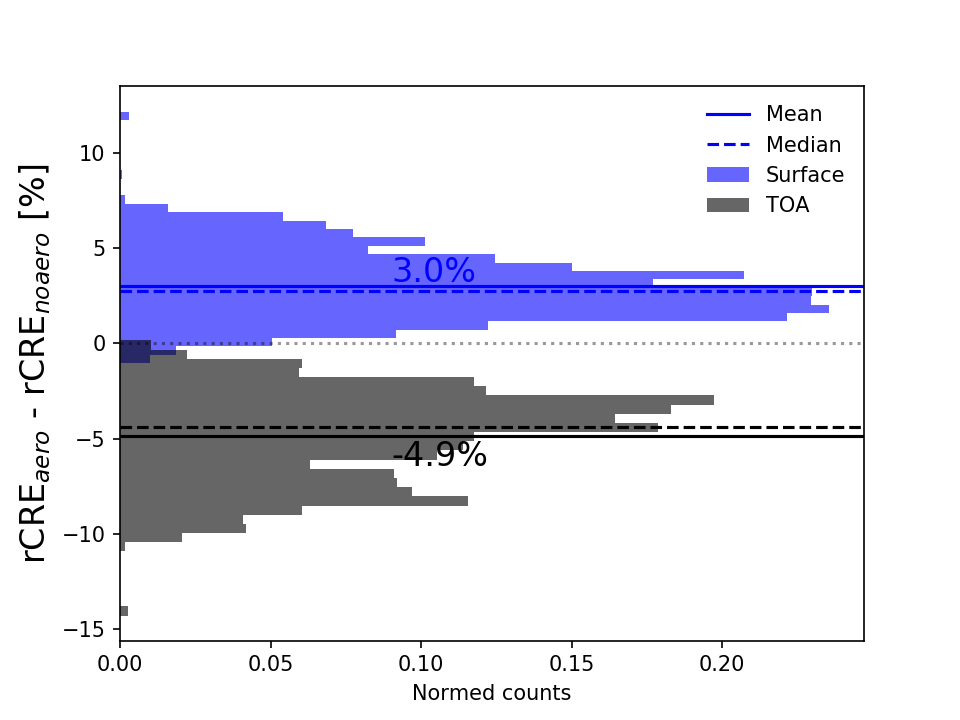

In [244]:
plt.figure()
plt.hist(rCRE_sur_daero,normed=True,edgecolor='None',color='blue',alpha=0.6,label='Surface',orientation='horizontal',bins=30)
plt.hist(rCRE_toa_daero,normed=True,edgecolor='None',color='k',alpha=0.6,label='TOA',orientation='horizontal',bins=30)

plt.axhline(0,color='k',ls=':',alpha=0.4)
plt.axhline(np.nanmean(rCRE_sur_daero),color='b',label='Mean')
plt.axhline(np.nanmedian(rCRE_sur_daero),color='b',linestyle='--',label='Median')
plt.text(0.09,np.nanmean(rCRE_sur_daero)+0.2,'{:3.1f}%'.format(np.nanmean(rCRE_sur_daero)),
         color='b',fontsize=16)

plt.axhline(np.nanmean(rCRE_toa_daero),color='k')
plt.axhline(np.nanmedian(rCRE_toa_daero),color='k',linestyle='--')
plt.text(0.09,np.nanmean(rCRE_toa_daero)-0.2,'{:3.1f}%'.format(np.nanmean(rCRE_toa_daero)),
         color='k',verticalalignment='top',fontsize=16)

plt.legend(frameon=False)

plt.ylabel('rCRE$_{{aero}}$ - rCRE$_{{no aero}}$ [%]',fontsize=16)
plt.xlabel('Normed counts')
#plt.ylim(-20.5,20.5)

plt.savefig(fp_plot+'ORACLES_SUR_TOA_rCRE_dAOD_{}.png'.format(vv),transparent=True,dpi=600)

In [245]:
np.nanstd(rCRE_sur_daero), np.nanstd(rCRE_toa_daero)

(1.7352050189482495, 2.388695287441932)

### Use previous calculations

In [290]:
star_aero_rC = np.zeros_like(c['star_aero_C'])
star_noaero_rC = np.zeros_like(c['star_aero_C'])

In [291]:
star_aero_rC[:,0] = c['star_aero_C'][:,0]/c['star_aero_CRE']['dn'][:,2]*100.0
star_aero_rC[:,1] = c['star_aero_C'][:,1]/c['star_aero_CRE']['dn'][:,2]*100.0
star_aero_rC[:,2] = c['star_aero_C'][:,2]/c['star_aero_CRE']['dn'][:,2]*100.0
star_noaero_rC[:,0] = c['star_noaero_C'][:,0]/c['star_noaero_CRE']['dn'][:,2]*100.0
star_noaero_rC[:,1] = c['star_noaero_C'][:,1]/c['star_noaero_CRE']['dn'][:,2]*100.0
star_noaero_rC[:,2] = c['star_noaero_C'][:,2]/c['star_noaero_CRE']['dn'][:,2]*100.0

In [292]:
star_aero_rC_abc = np.zeros_like(c['star_aero_C'])
star_noaero_rC_abc = np.zeros_like(c['star_aero_C'])

star_aero_rC_abc[:,0] = c['star_aero_C'][:,0]/c['star_aero_CRE']['dn'][:,1]*100.0
star_noaero_rC_abc[:,0] = c['star_noaero_C'][:,0]/c['star_noaero_CRE']['dn'][:,1]*100.0

In [ ]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,0],xlim=[-0.5,1.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('relative Cloud Radiative Effect from 4STAR retrievals\nSurface')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,0],0,[-100,0],legend=True,onlyhist=False,loc=4,color='g',bins=50)
pu.plot_vert_hist(fig,ax1,star_noaero_rC[:,0],1,[-100,0],legend=True,color='r',bins=50)
plt.savefig(fp+'../plot/ORACLES_rCRE_surface_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


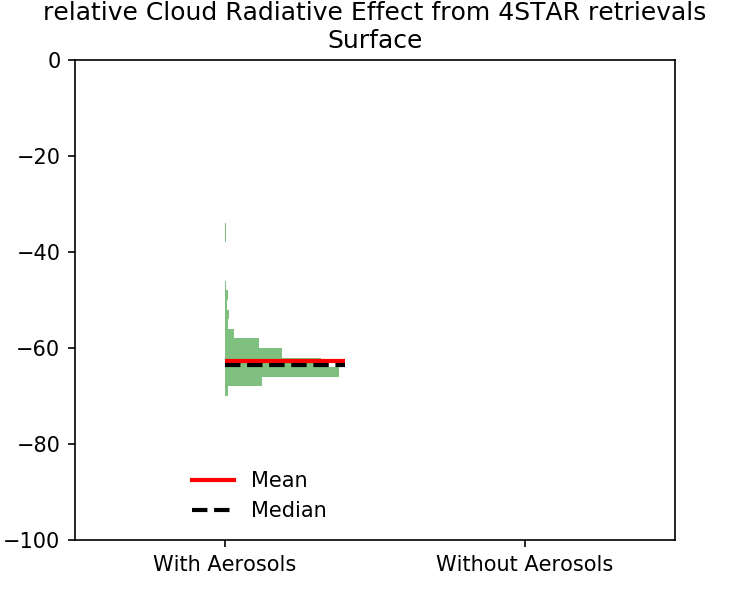

ValueError: Width and height specified must be non-negative

In [127]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,0],xlim=[-0.5,1.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('relative Cloud Radiative Effect from 4STAR retrievals\nSurface')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,0],0,[-100,0],legend=True,onlyhist=False,loc=4,color='g',bins=50)
pu.plot_vert_hist(fig,ax1,star_noaero_rC[:,0],1,[-100,0],legend=True,color='r',bins=50)
plt.savefig(fp+'../plot/ORACLES_rCRE_surface_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


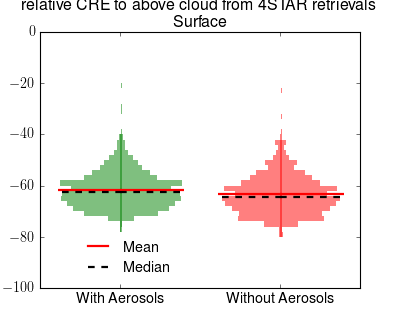

In [90]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,0],xlim=[-0.5,1.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('relative CRE to above cloud from 4STAR retrievals\nSurface')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,c['star_aero_C'][:,0]/c['star_aero_CRE']['dn'][:,1]*100.0,0,[-100,0],legend=True,onlyhist=False,loc=4,color='g',bins=50)
pu.plot_vert_hist(fig,ax1,c['star_noaero_C'][:,0]/c['star_noaero_CRE']['dn'][:,1]*100.0,1,[-100,0],legend=True,color='r',bins=50)
plt.savefig(fp+'../plot/ORACLES_rCRE_above_cloud_for_surface_4STAR.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


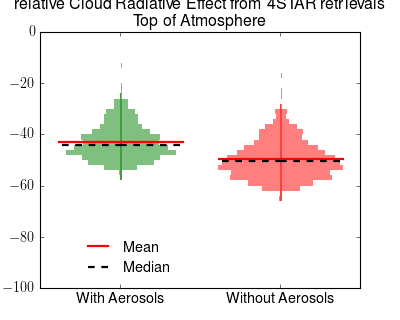

In [84]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,0],xlim=[-0.5,1.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('relative Cloud Radiative Effect from 4STAR retrievals\nTop of Atmosphere')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Aerosols','Without Aerosols'])
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,2],0,[-100,0],legend=True,onlyhist=False,loc=4,color='g',bins=50)
pu.plot_vert_hist(fig,ax1,star_noaero_rC[:,2],1,[-100,0],legend=True,color='r',bins=50)
plt.savefig(fp+'../plot/ORACLES_rCRE_toa_4STAR.png',transparent=True,dpi=600)

In [293]:
print 'Surface rCRE'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(star_aero_rC[:,0]),np.nanmean(star_noaero_rC[:,0]))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(star_aero_rC[:,0]),np.nanmedian(star_noaero_rC[:,0]))
print 'std aero: {}, no aero: {}'.format(np.nanstd(star_aero_rC[:,0]),np.nanstd(star_noaero_rC[:,0]))

Surface rCRE
mean aero: -41.5795753493, no aero: -44.5722176731
median aero: -41.8667947139, no aero: -44.871606104
std aero: 3.80431641858, no aero: 3.9053344375


In [294]:
print 'TOA rCRE'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(star_aero_rC[:,2]),np.nanmean(star_noaero_rC[:,2]))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(star_aero_rC[:,2]),np.nanmedian(star_noaero_rC[:,2]))
print 'std aero: {}, no aero: {}'.format(np.nanstd(star_aero_rC[:,2]),np.nanstd(star_noaero_rC[:,2]))

TOA rCRE
mean aero: -34.5265845954, no aero: -39.4121548559
median aero: -34.8053267092, no aero: -39.7683699943
std aero: 3.75548440685, no aero: 3.69974335978


## plot the aerosol forcing

### Get the AOD

In [12]:
ar.keys()

NameError: name 'ar' is not defined

In [13]:
aca = hs.loadmat(fp+'acaod_index_{}.mat'.format('v5'))

In [14]:
from load_utils import load_from_json

In [15]:
aca['aero'] = {}
for ka in aca['files'].keys():
    aa = load_from_json(fp+'../model/'+aca['files'][ka])
    aca['aero'][ka] = aa['aero']

In [16]:
aca['aero']['1']['z_arr']

[2.0, 5.0]

In [17]:
aod = []
for i,l in enumerate(ar['lat_fl']):
    day = dds[ar['days'][ar['fl'].astype(bool)][i].astype(int)]
    i_aca = np.argmin(abs(aca['utc'][day]-ar['utc_fl'][i]))
    i_aero = '{}'.format(aca['acaod_index'][day][i_aca])
    aod.append(aca['aero'][i_aero]['ext'][0,3]*3.0)

NameError: name 'ar' is not defined

In [264]:
aod = np.array(aod)

In [265]:
aod.shape

(3816,)

In [20]:
aca['aero']['1']

OrderedDict([(u'ext',
              array([[0.19367598, 0.15301802, 0.1368469 , 0.1       , 0.06504064,
                      0.03515906, 0.02846083, 0.02665043, 0.02027237, 0.0121975 ,
                      0.00813167, 0.00406583],
                     [0.        , 0.        , 0.        , 0.        , 0.        ,
                      0.        , 0.        , 0.        , 0.        , 0.        ,
                      0.        , 0.        ]])),
             (u'wvl_arr',
              [200.0,
               350.0,
               400.0,
               500.0,
               650.0,
               875.0,
               980.0,
               1020.0,
               1240.0,
               1710.0,
               2410.0,
               4900.0]),
             (u'expand_hg', True),
             (u'disort_phase', False),
             (u'asy',
              array([[0.75      , 0.71      , 0.69      , 0.645     , 0.58      ,
                      0.52      , 0.512     , 0.51      , 0.49      , 0.45    

### plot the aerosol models

In [23]:
aca['files']

{u'0': 'ORACLES_lut_v5_05aod.txt',
 u'1': 'ORACLES_lut_v5_10aod.txt',
 u'2': 'ORACLES_lut_v5_15aod.txt',
 u'3': 'ORACLES_lut_v5_lowaod.txt',
 u'4': 'ORACLES_lut_v5_midaod.txt',
 u'5': 'ORACLES_lut_v5_65aod.txt',
 u'6': 'ORACLES_lut_v5_80aod.txt'}

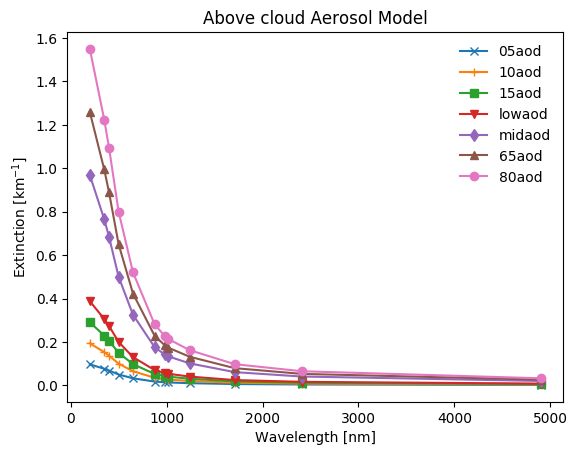

In [41]:
plt.figure()
plt.plot(aca['aero']['0']['wvl_arr'],aca['aero']['0']['ext'][0,:],'x-',label='05aod')
plt.plot(aca['aero']['1']['wvl_arr'],aca['aero']['1']['ext'][0,:],'+-',label='10aod')
plt.plot(aca['aero']['2']['wvl_arr'],aca['aero']['2']['ext'][0,:],'s-',label='15aod')
plt.plot(aca['aero']['3']['wvl_arr'],aca['aero']['3']['ext'][0,:],'v-',label='lowaod')
plt.plot(aca['aero']['4']['wvl_arr'],aca['aero']['4']['ext'][0,:],'d-',label='midaod')
plt.plot(aca['aero']['5']['wvl_arr'],aca['aero']['5']['ext'][0,:],'^-',label='65aod')
plt.plot(aca['aero']['6']['wvl_arr'],aca['aero']['6']['ext'][0,:],'o-',label='80aod')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Extinction [km$^{{-1}}$]')
plt.legend(frameon=False)
plt.title('Above cloud Aerosol Model')
plt.savefig(fp+'acaod_models_ext.png',dpi=600,transparent=True)

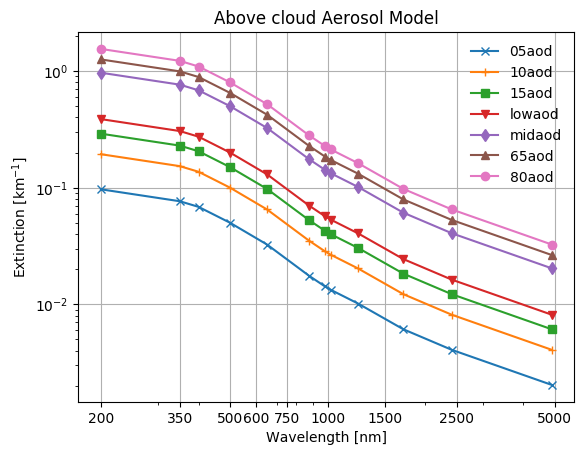

In [43]:
plt.figure()
plt.plot(aca['aero']['0']['wvl_arr'],aca['aero']['0']['ext'][0,:],'x-',label='05aod')
plt.plot(aca['aero']['1']['wvl_arr'],aca['aero']['1']['ext'][0,:],'+-',label='10aod')
plt.plot(aca['aero']['2']['wvl_arr'],aca['aero']['2']['ext'][0,:],'s-',label='15aod')
plt.plot(aca['aero']['3']['wvl_arr'],aca['aero']['3']['ext'][0,:],'v-',label='lowaod')
plt.plot(aca['aero']['4']['wvl_arr'],aca['aero']['4']['ext'][0,:],'d-',label='midaod')
plt.plot(aca['aero']['5']['wvl_arr'],aca['aero']['5']['ext'][0,:],'^-',label='65aod')
plt.plot(aca['aero']['6']['wvl_arr'],aca['aero']['6']['ext'][0,:],'o-',label='80aod')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Extinction [km$^{{-1}}$]')
plt.yscale('log')
plt.xscale('log')
ax1 = plt.gca()
ax1.set_xticks([200,350,500,600,750,1000,1500,2500,5000])
ax1.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
plt.grid()
plt.legend(frameon=False)
plt.title('Above cloud Aerosol Model')
plt.savefig(fp+'acaod_models_ext_log.png',dpi=600,transparent=True)

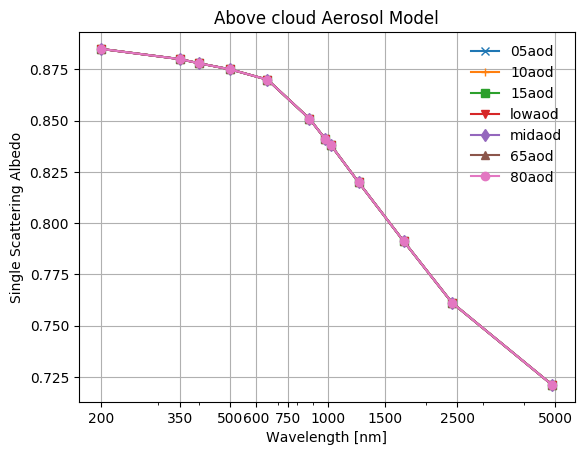

In [42]:
plt.figure()
plt.plot(aca['aero']['0']['wvl_arr'],aca['aero']['0']['ssa'][0,:],'x-',label='05aod')
plt.plot(aca['aero']['1']['wvl_arr'],aca['aero']['1']['ssa'][0,:],'+-',label='10aod')
plt.plot(aca['aero']['2']['wvl_arr'],aca['aero']['2']['ssa'][0,:],'s-',label='15aod')
plt.plot(aca['aero']['3']['wvl_arr'],aca['aero']['3']['ssa'][0,:],'v-',label='lowaod')
plt.plot(aca['aero']['4']['wvl_arr'],aca['aero']['4']['ssa'][0,:],'d-',label='midaod')
plt.plot(aca['aero']['5']['wvl_arr'],aca['aero']['5']['ssa'][0,:],'^-',label='65aod')
plt.plot(aca['aero']['6']['wvl_arr'],aca['aero']['6']['ssa'][0,:],'o-',label='80aod')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Single Scattering Albedo')
plt.xscale('log')
ax1 = plt.gca()
ax1.set_xticks([200,350,500,600,750,1000,1500,2500,5000])
ax1.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
plt.grid()
plt.legend(frameon=False)
plt.title('Above cloud Aerosol Model')
plt.savefig(fp+'acaod_models_ssa_log.png',dpi=600,transparent=True)

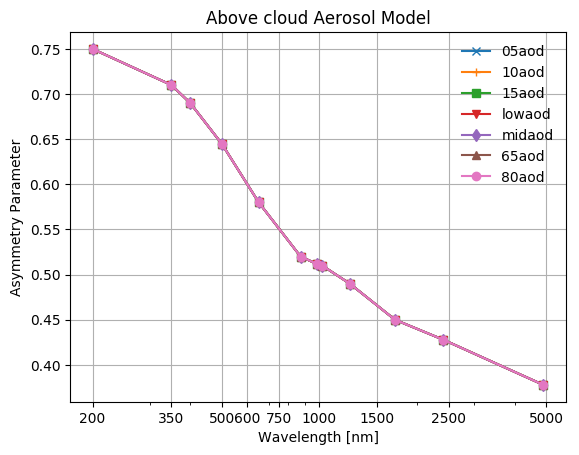

In [44]:
plt.figure()
plt.plot(aca['aero']['0']['wvl_arr'],aca['aero']['0']['asy'][0,:],'x-',label='05aod')
plt.plot(aca['aero']['1']['wvl_arr'],aca['aero']['1']['asy'][0,:],'+-',label='10aod')
plt.plot(aca['aero']['2']['wvl_arr'],aca['aero']['2']['asy'][0,:],'s-',label='15aod')
plt.plot(aca['aero']['3']['wvl_arr'],aca['aero']['3']['asy'][0,:],'v-',label='lowaod')
plt.plot(aca['aero']['4']['wvl_arr'],aca['aero']['4']['asy'][0,:],'d-',label='midaod')
plt.plot(aca['aero']['5']['wvl_arr'],aca['aero']['5']['asy'][0,:],'^-',label='65aod')
plt.plot(aca['aero']['6']['wvl_arr'],aca['aero']['6']['asy'][0,:],'o-',label='80aod')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Asymmetry Parameter')
plt.xscale('log')
ax1 = plt.gca()
ax1.set_xticks([200,350,500,600,750,1000,1500,2500,5000])
ax1.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
plt.grid()
plt.legend(frameon=False)
plt.title('Above cloud Aerosol Model')
plt.savefig(fp+'acaod_models_asy_log.png',dpi=600,transparent=True)

### Determine the DARE

In [266]:
c.keys()

[u'star_aero_CRE',
 u'star_noaero_C',
 u'star_noaero_CRE',
 u'star_noaero_CRE_clear',
 u'star_aero_CRE_clear',
 u'star_aero_C']

In [267]:
c['star_aero_CRE']['dn'].shape

(3816, 3)

<IPython.core.display.Javascript object>


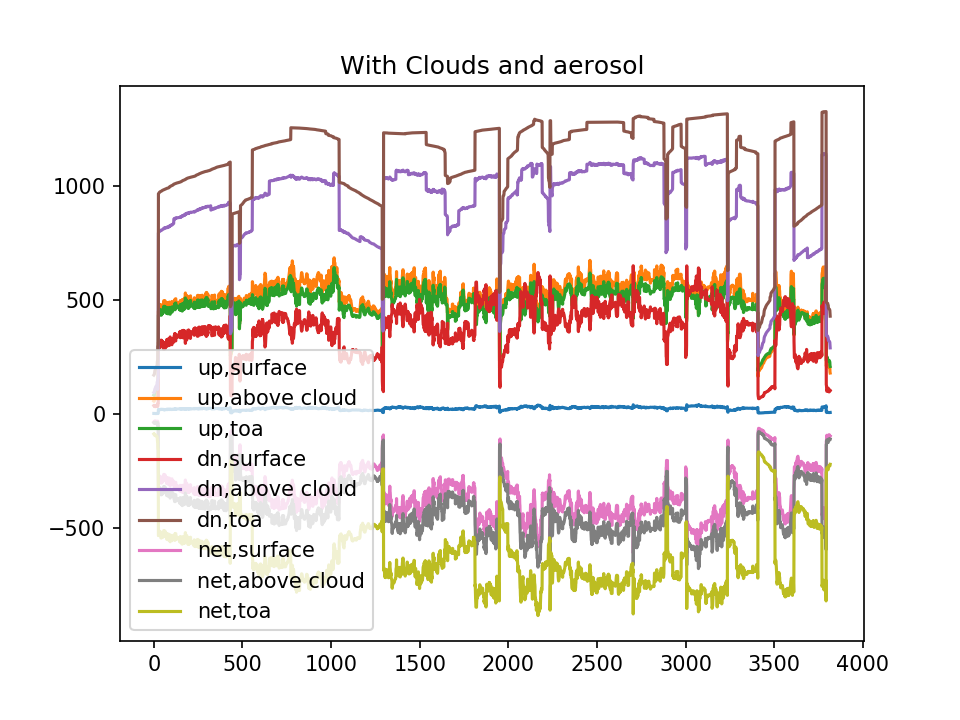

In [268]:
plt.figure()
plt.plot(c['star_aero_CRE']['up'][:,0],label='up,surface')
plt.plot(c['star_aero_CRE']['up'][:,1],label='up,above cloud')
plt.plot(c['star_aero_CRE']['up'][:,2],label='up,toa')
plt.plot(c['star_aero_CRE']['dn'][:,0],label='dn,surface')
plt.plot(c['star_aero_CRE']['dn'][:,1],label='dn,above cloud')
plt.plot(c['star_aero_CRE']['dn'][:,2],label='dn,toa')
plt.plot(c['star_aero_CRE']['up'][:,0]-c['star_aero_CRE']['dn'][:,0],label='net,surface')
plt.plot(c['star_aero_CRE']['up'][:,1]-c['star_aero_CRE']['dn'][:,1],label='net,above cloud')
plt.plot(c['star_aero_CRE']['up'][:,2]-c['star_aero_CRE']['dn'][:,2],label='net,toa')

plt.title('With Clouds and aerosol')
leg = plt.legend()
leg.draggable()

<IPython.core.display.Javascript object>


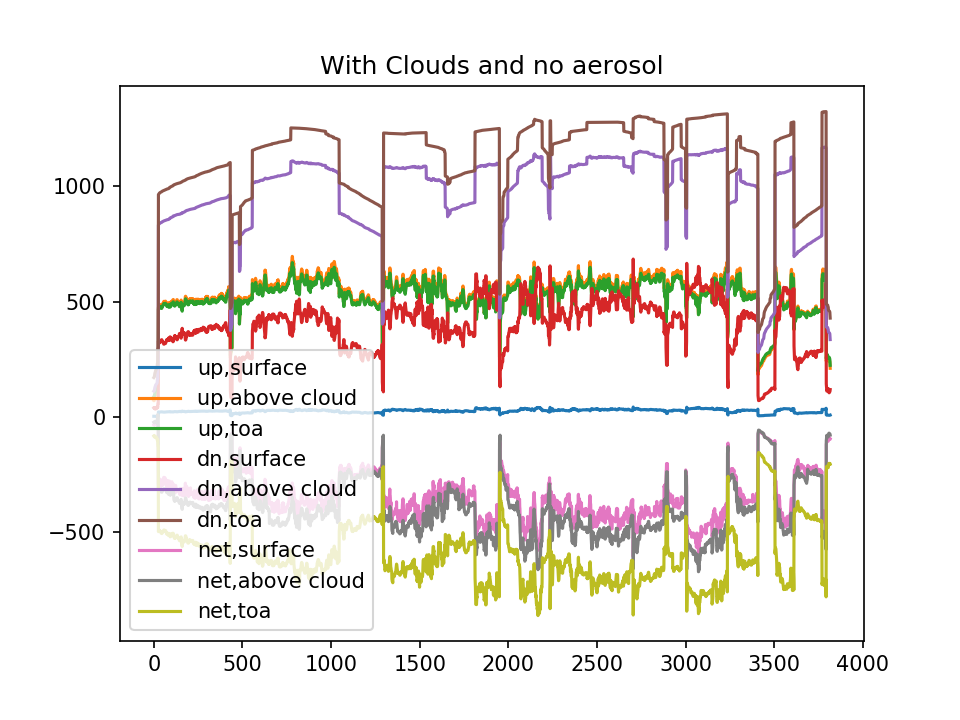

In [269]:
plt.figure()
plt.plot(c['star_noaero_CRE']['up'][:,0],label='up,surface')
plt.plot(c['star_noaero_CRE']['up'][:,1],label='up,above cloud')
plt.plot(c['star_noaero_CRE']['up'][:,2],label='up,toa')
plt.plot(c['star_noaero_CRE']['dn'][:,0],label='dn,surface')
plt.plot(c['star_noaero_CRE']['dn'][:,1],label='dn,above cloud')
plt.plot(c['star_noaero_CRE']['dn'][:,2],label='dn,toa')
plt.plot(c['star_noaero_CRE']['up'][:,0]-c['star_aero_CRE']['dn'][:,0],label='net,surface')
plt.plot(c['star_noaero_CRE']['up'][:,1]-c['star_aero_CRE']['dn'][:,1],label='net,above cloud')
plt.plot(c['star_noaero_CRE']['up'][:,2]-c['star_aero_CRE']['dn'][:,2],label='net,toa')

plt.title('With Clouds and no aerosol')
leg = plt.legend()
leg.draggable()

<IPython.core.display.Javascript object>


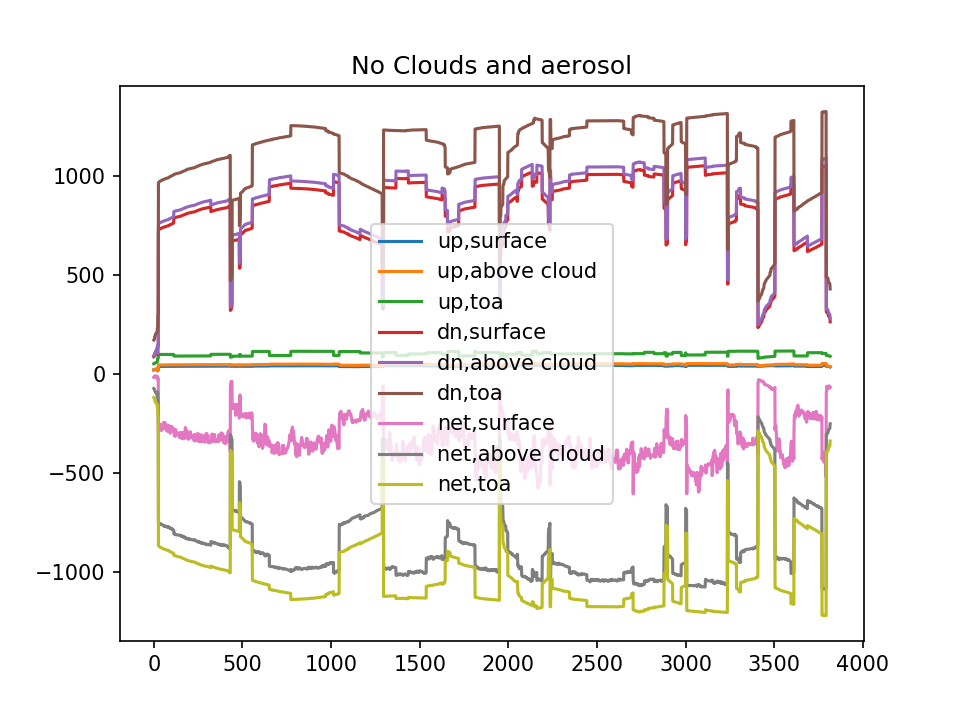

In [270]:
plt.figure()
plt.plot(c['star_aero_CRE_clear']['up'][:,0],label='up,surface')
plt.plot(c['star_aero_CRE_clear']['up'][:,1],label='up,above cloud')
plt.plot(c['star_aero_CRE_clear']['up'][:,2],label='up,toa')
plt.plot(c['star_aero_CRE_clear']['dn'][:,0],label='dn,surface')
plt.plot(c['star_aero_CRE_clear']['dn'][:,1],label='dn,above cloud')
plt.plot(c['star_aero_CRE_clear']['dn'][:,2],label='dn,toa')
plt.plot(c['star_aero_CRE_clear']['up'][:,0]-c['star_aero_CRE']['dn'][:,0],label='net,surface')
plt.plot(c['star_aero_CRE_clear']['up'][:,1]-c['star_aero_CRE']['dn'][:,1],label='net,above cloud')
plt.plot(c['star_aero_CRE_clear']['up'][:,2]-c['star_aero_CRE']['dn'][:,2],label='net,toa')

plt.title('No Clouds and aerosol')
leg = plt.legend()
leg.draggable()

<IPython.core.display.Javascript object>


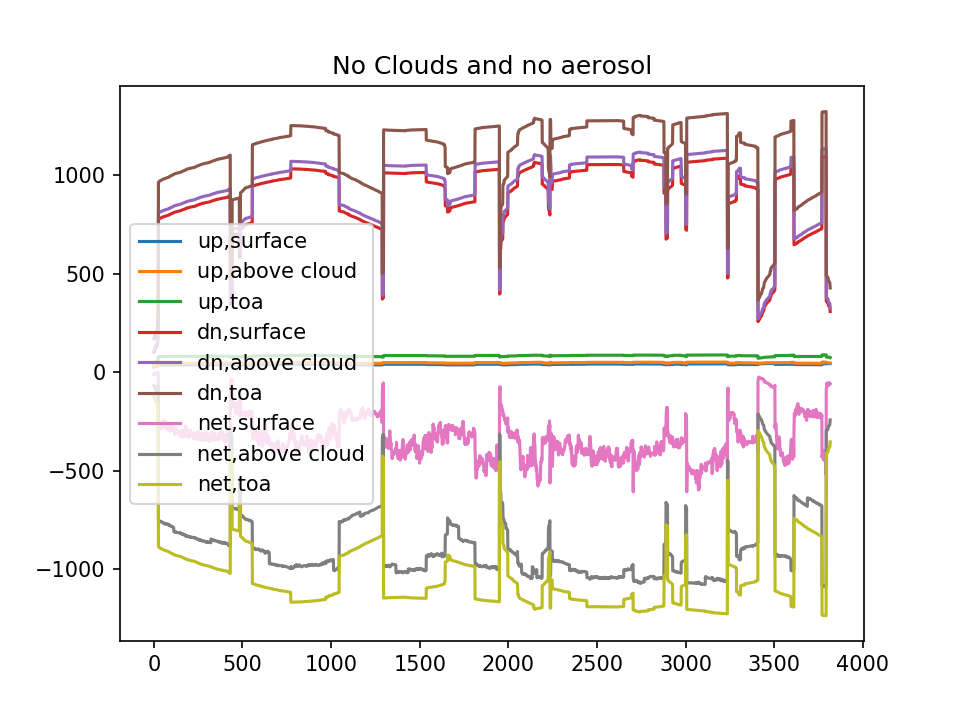

In [271]:
plt.figure()
plt.plot(c['star_noaero_CRE_clear']['up'][:,0],label='up,surface')
plt.plot(c['star_noaero_CRE_clear']['up'][:,1],label='up,above cloud')
plt.plot(c['star_noaero_CRE_clear']['up'][:,2],label='up,toa')
plt.plot(c['star_noaero_CRE_clear']['dn'][:,0],label='dn,surface')
plt.plot(c['star_noaero_CRE_clear']['dn'][:,1],label='dn,above cloud')
plt.plot(c['star_noaero_CRE_clear']['dn'][:,2],label='dn,toa')
plt.plot(c['star_noaero_CRE_clear']['up'][:,0]-c['star_aero_CRE']['dn'][:,0],label='net,surface')
plt.plot(c['star_noaero_CRE_clear']['up'][:,1]-c['star_aero_CRE']['dn'][:,1],label='net,above cloud')
plt.plot(c['star_noaero_CRE_clear']['up'][:,2]-c['star_aero_CRE']['dn'][:,2],label='net,toa')

plt.title('No Clouds and no aerosol')
leg = plt.legend()
leg.draggable()

In [272]:
DAREs = (c['star_aero_CRE']['dn'][:,0]-c['star_aero_CRE']['up'][:,0])-(c['star_noaero_CRE']['dn'][:,0]-c['star_noaero_CRE']['up'][:,0])
DAREs_clear = (c['star_aero_CRE_clear']['dn'][:,0]-c['star_aero_CRE_clear']['up'][:,0])-(c['star_noaero_CRE_clear']['dn'][:,0]-c['star_noaero_CRE_clear']['up'][:,0])

<IPython.core.display.Javascript object>


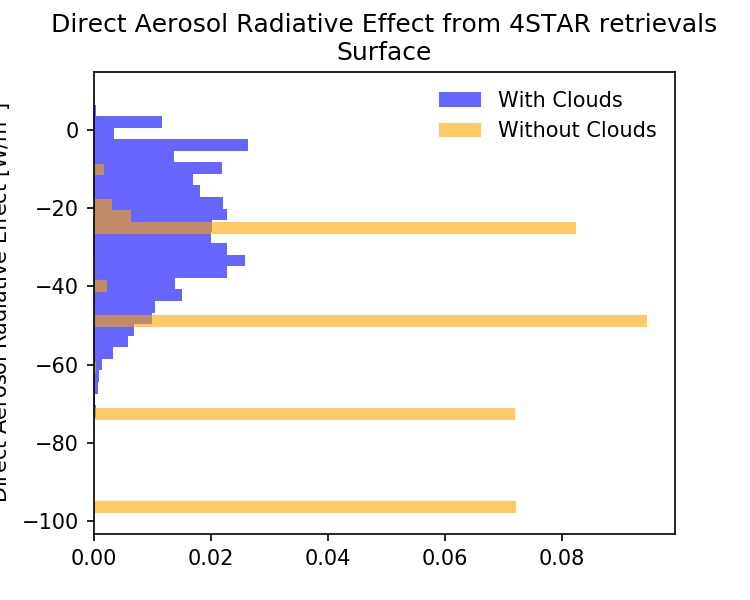

In [274]:
fig = plt.figure(figsize=(5,4))
#ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,20],xlim=[-0.5,1.5])
plt.hist(DAREs,label='With Clouds',normed=True,edgecolor='None',color='blue',alpha=0.6,orientation='horizontal',bins=30)
plt.hist(DAREs_clear,label='Without Clouds',normed=True,edgecolor='None',color='orange',alpha=0.6,orientation='horizontal',bins=30)
ax1 = plt.gca()
ax1.set_ylabel('Direct Aerosol Radiative Effect [W/m$^2$]')
ax1.set_title('Direct Aerosol Radiative Effect from 4STAR retrievals\nSurface')
plt.legend(frameon=False)
#pu.plot_vert_hist(fig,ax1,DAREs,0,[-100,20],legend=True,onlyhist=False,loc=2,color='b',bins=30)
#pu.plot_vert_hist(fig,ax1,DAREs_clear,1,[-100,20],legend=True,color='y',bins=30)
plt.savefig(fp+'../plot/ORACLES_DARE_surface_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

In [275]:
print 'Surface DARE'
print 'mean clouds: {}, no clouds: {}'.format(np.nanmean(DAREs),np.nanmean(DAREs_clear))
print 'median clouds: {}, no clouds: {}'.format(np.nanmedian(DAREs),np.nanmedian(DAREs_clear))
print 'std clouds: {}, no clouds: {}'.format(np.nanstd(DAREs),np.nanstd(DAREs_clear))

Surface DARE
mean clouds: -25.0156240552, no clouds: -57.3903214858
median clouds: -24.8686073858, no clouds: -49.435675
std clouds: 15.2687452446, no clouds: 26.8030231068


In [276]:
DAREt = (c['star_aero_CRE']['dn'][:,2]-c['star_aero_CRE']['up'][:,2])-\
       (c['star_noaero_CRE']['dn'][:,2]-c['star_noaero_CRE']['up'][:,2])
DAREt_clear = (c['star_aero_CRE_clear']['dn'][:,2]-c['star_aero_CRE_clear']['up'][:,2])-\
             (c['star_noaero_CRE_clear']['dn'][:,2]-c['star_noaero_CRE_clear']['up'][:,2])

<IPython.core.display.Javascript object>


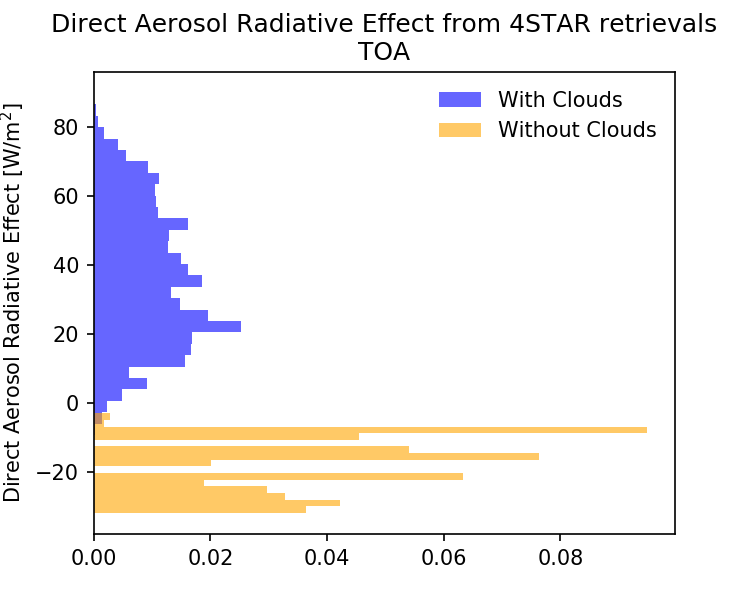

In [278]:
fig = plt.figure(figsize=(5,4))
#ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-100,20],xlim=[-0.5,1.5])
plt.hist(DAREt,label='With Clouds',normed=True,edgecolor='None',color='blue',alpha=0.6,orientation='horizontal',bins=30)
plt.hist(DAREt_clear,label='Without Clouds',normed=True,edgecolor='None',color='orange',alpha=0.6,orientation='horizontal',bins=15)
ax1 = plt.gca()
ax1.set_ylabel('Direct Aerosol Radiative Effect [W/m$^2$]')
ax1.set_title('Direct Aerosol Radiative Effect from 4STAR retrievals\nTOA')
plt.legend(frameon=False)
#pu.plot_vert_hist(fig,ax1,DAREs,0,[-100,20],legend=True,onlyhist=False,loc=2,color='b',bins=30)
#pu.plot_vert_hist(fig,ax1,DAREs_clear,1,[-100,20],legend=True,color='y',bins=30)
plt.savefig(fp+'../plot/ORACLES_DARE_toa_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


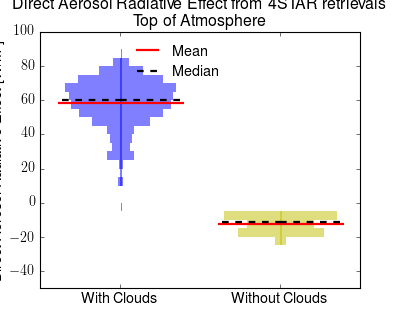

In [71]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-50,100],xlim=[-0.5,1.5])
ax1.set_ylabel('Direct Aerosol Radiative Effect [W/m$^2$]')
ax1.set_title('Direct Aerosol Radiative Effect from 4STAR retrievals\nTop of Atmosphere')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Clouds','Without Clouds'])

pu.plot_vert_hist(fig,ax1,DAREt,0,[-50,100],legend=True,onlyhist=False,loc=2,color='b',bins=30)
pu.plot_vert_hist(fig,ax1,DAREt_clear,1,[-50,100],legend=True,color='y',bins=30)
plt.savefig(fp+'../plot/ORACLES_DARE_toa_4STAR.png',transparent=True,dpi=600)

In [279]:
print 'TOA DARE'
print 'mean clouds: {}, no clouds: {}'.format(np.nanmean(DAREt),np.nanmean(DAREt_clear))
print 'median clouds: {}, no clouds: {}'.format(np.nanmedian(DAREt),np.nanmedian(DAREt_clear))
print 'std clouds: {}, no clouds: {}'.format(np.nanstd(DAREt),np.nanstd(DAREt_clear))

TOA DARE
mean clouds: 36.0220543751, no clouds: -17.9210482172
median clouds: 34.5405484654, no clouds: -16.0742643761
std clouds: 19.5195002503, no clouds: 7.91903454617


### Calculate the relative forcing efficiency

In [280]:
tau_500 = aod

In [281]:
rfes = DAREs/c['star_aero_CRE']['dn'][:,2]*100.0/tau_500
rfes_clear = DAREs_clear/c['star_aero_CRE']['dn'][:,2]*100.0/tau_500
rfet = DAREt/c['star_aero_CRE']['dn'][:,2]*100.0/tau_500
rfet_clear = DAREt_clear/c['star_aero_CRE']['dn'][:,2]*100.0/tau_500 

<IPython.core.display.Javascript object>


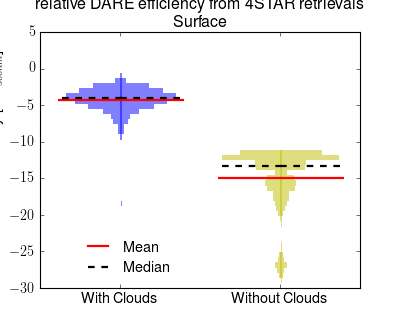

In [75]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-30,5],xlim=[-0.5,1.5])
ax1.set_ylabel('relative DARE efficiency [\%/$\\tau_{{500nm}}$]')
ax1.set_title('relative DARE efficiency from 4STAR retrievals\nSurface')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Clouds','Without Clouds'])
pu.plot_vert_hist(fig,ax1,rfes,0,[-30,5],legend=True,onlyhist=False,loc=4,color='b',bins=50)
pu.plot_vert_hist(fig,ax1,rfes_clear,1,[-30,5],legend=True,color='y',bins=50)
plt.savefig(fp+'../plot/ORACLES_rDAREe_surface_4STAR.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


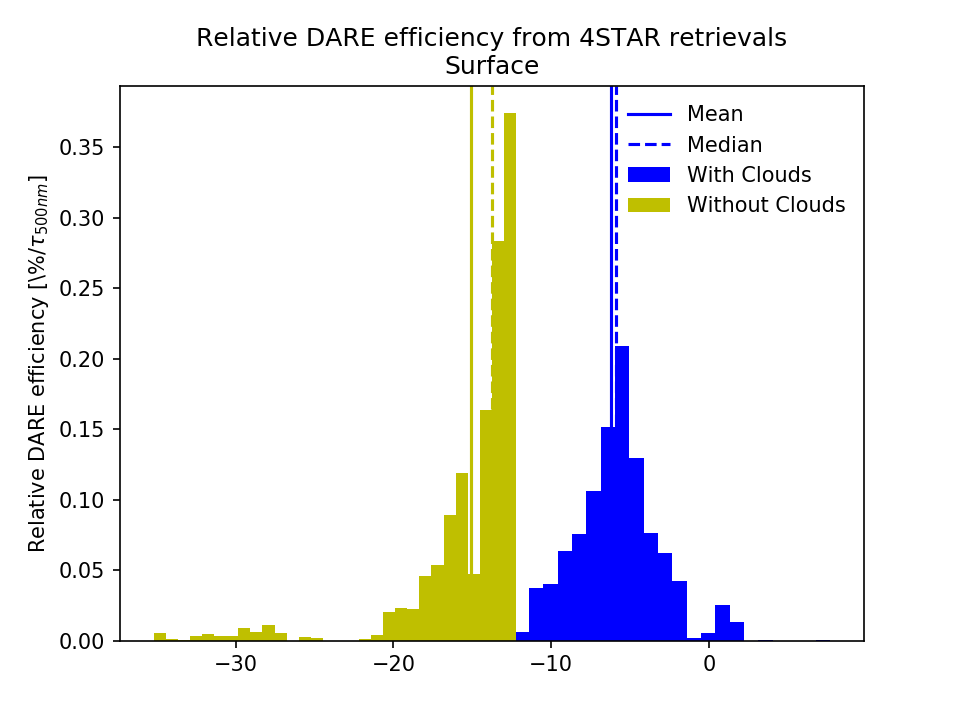

In [282]:
plt.figure()
plt.hist(rfes,color='b',bins=30,normed=True,edgecolor='None',label='With Clouds')
plt.hist(rfes_clear,color='y',bins=30,normed=True,edgecolor='None',label='Without Clouds')

plt.axvline(np.nanmean(rfes),ls='-',color='b',label='Mean')
plt.axvline(np.nanmedian(rfes),ls='--',color='b',label='Median')

plt.axvline(np.nanmean(rfes_clear),ls='-',color='y')
plt.axvline(np.nanmedian(rfes_clear),ls='--',color='y')
plt.legend(frameon=False)
plt.ylabel('Relative DARE efficiency [\%/$\\tau_{{500nm}}$]')
plt.title('Relative DARE efficiency from 4STAR retrievals\nSurface')
plt.savefig(fp+'../plot/ORACLES_rDAREe_surface_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


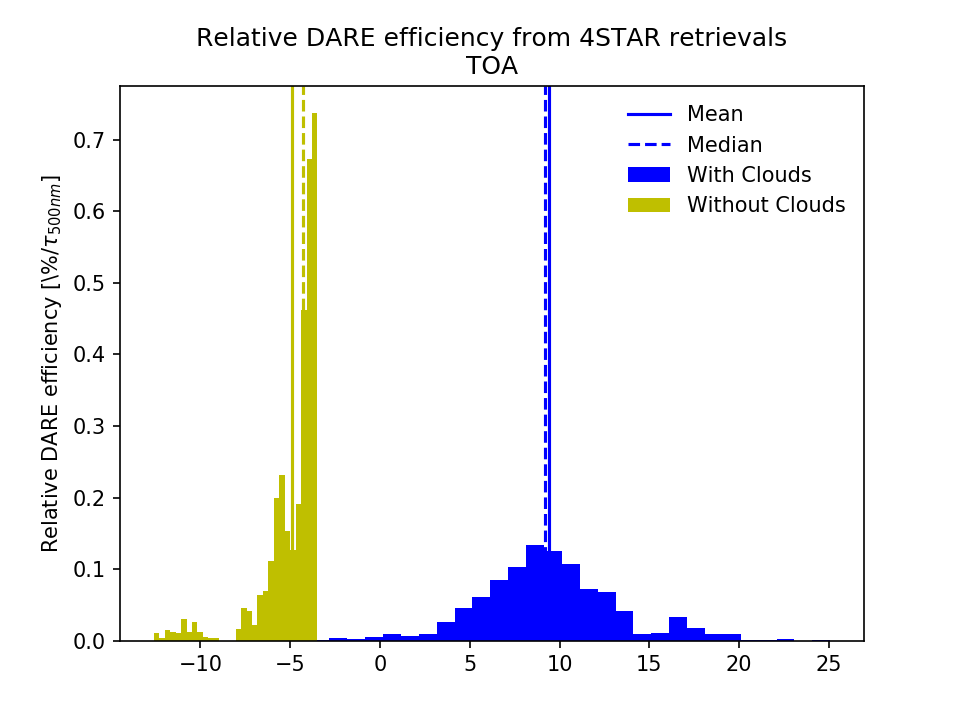

In [283]:
plt.figure()
plt.hist(rfet,color='b',bins=30,normed=True,edgecolor='None',label='With Clouds')
plt.hist(rfet_clear,color='y',bins=30,normed=True,edgecolor='None',label='Without Clouds')

plt.axvline(np.nanmean(rfet),ls='-',color='b',label='Mean')
plt.axvline(np.nanmedian(rfet),ls='--',color='b',label='Median')

plt.axvline(np.nanmean(rfet_clear),ls='-',color='y')
plt.axvline(np.nanmedian(rfet_clear),ls='--',color='y')
plt.legend(frameon=False)
plt.ylabel('Relative DARE efficiency [\%/$\\tau_{{500nm}}$]')
plt.title('Relative DARE efficiency from 4STAR retrievals\nTOA')
plt.savefig(fp+'../plot/ORACLES_rDAREe_TOA_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


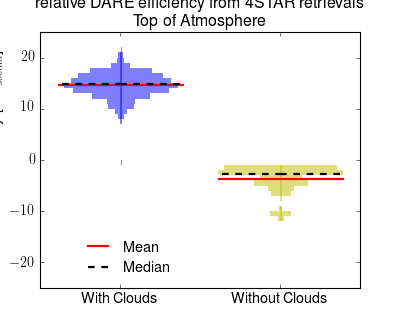

In [76]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-25,25],xlim=[-0.5,1.5])
ax1.set_ylabel('relative DARE efficiency [\%/$\\tau_{{500nm}}$]')
ax1.set_title('relative DARE efficiency from 4STAR retrievals\nTop of Atmosphere')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['With Clouds','Without Clouds'])
pu.plot_vert_hist(fig,ax1,rfet,0,[-25,25],legend=True,onlyhist=False,loc=4,color='b',bins=50)
pu.plot_vert_hist(fig,ax1,rfet_clear,1,[-25,25],legend=True,color='y',bins=50)
plt.savefig(fp+'../plot/ORACLES_rDAREe_TOA_4STAR.png',transparent=True,dpi=600)

In [284]:
print 'Surface rDAREe'
print 'mean clouds: {}, no clouds: {}'.format(np.nanmean(rfes),np.nanmean(rfes_clear))
print 'median clouds: {}, no clouds: {}'.format(np.nanmedian(rfes),np.nanmedian(rfes_clear))
print 'std clouds: {}, no clouds: {}'.format(np.nanstd(rfes),np.nanstd(rfes_clear))

Surface rDAREe
mean clouds: -6.2204776414, no clouds: -15.093232473
median clouds: -5.87741856065, no clouds: -13.7481186944
std clouds: 3.22782247442, no clouds: 3.75778400134


In [285]:
print 'TOA rDAREe'
print 'mean clouds: {}, no clouds: {}'.format(np.nanmean(rfet),np.nanmean(rfet_clear))
print 'median clouds: {}, no clouds: {}'.format(np.nanmedian(rfet),np.nanmedian(rfet_clear))
print 'std clouds: {}, no clouds: {}'.format(np.nanstd(rfet),np.nanstd(rfet_clear))

TOA rDAREe
mean clouds: 9.42581200288, no clouds: -4.88532407009
median clouds: 9.18351858264, no clouds: -4.27384779167
std clouds: 3.87043464159, no clouds: 1.64330061554


## Calculate the impact of aerosol on CRE

<IPython.core.display.Javascript object>


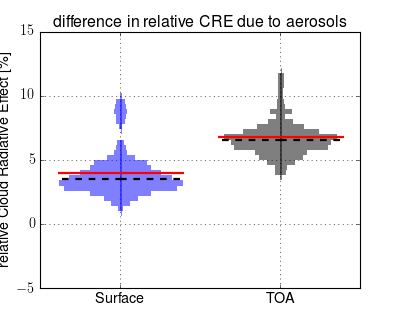

In [138]:
fig = plt.figure(figsize=(5,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-5,15],xlim=[-0.5,1.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('difference in relative CRE due to aerosols')
ax1.set_xticks([0,1])
ax1.set_xticklabels(['Surface','TOA'])
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,0]-star_noaero_rC[:,0],0,[-5,15],legend=True,onlyhist=True,loc=4,color='b',bins=50)
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,2]-star_noaero_rC[:,2],1,[-5,15],legend=True,color='k',bins=50)
ax1.grid()
plt.savefig(fp+'../plot/ORACLES_rCRE_from_aerosol_4STAR.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


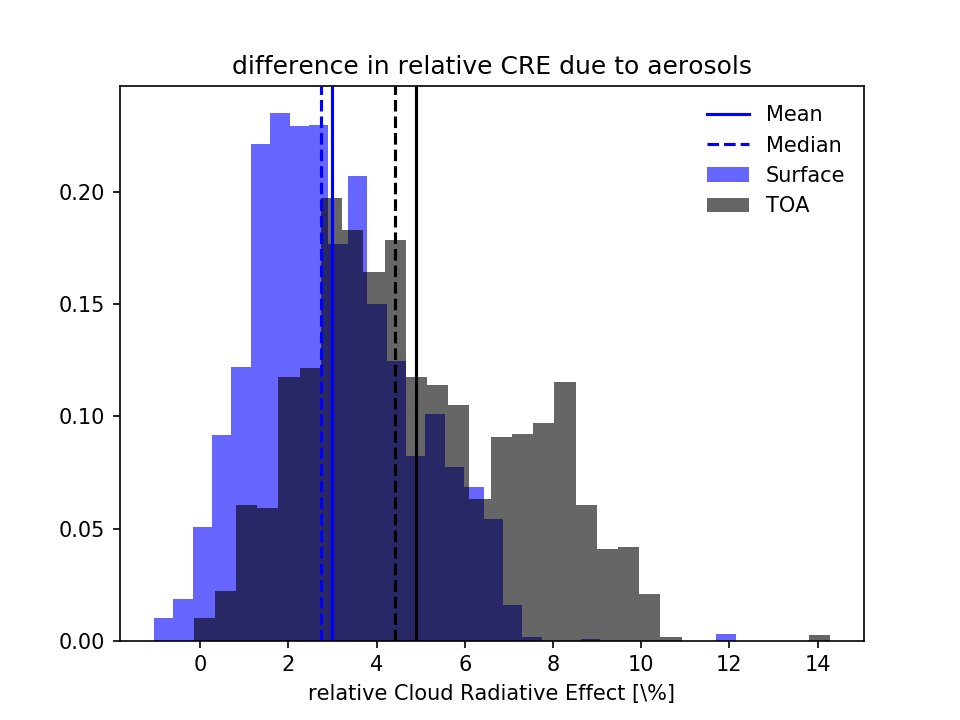

In [295]:
fig = plt.figure()
plt.hist(star_aero_rC[:,0]-star_noaero_rC[:,0],color='b',alpha=0.6,bins=30,normed=True,edgecolor='None',label='Surface')
plt.hist(star_aero_rC[:,2]-star_noaero_rC[:,2],color='k',alpha=0.6,bins=30,normed=True,edgecolor='None',label='TOA')

plt.axvline(np.nanmean(star_aero_rC[:,0]-star_noaero_rC[:,0]),ls='-',color='b',label='Mean')
plt.axvline(np.nanmedian(star_aero_rC[:,0]-star_noaero_rC[:,0]),ls='--',color='b',label='Median')

plt.axvline(np.nanmean(star_aero_rC[:,2]-star_noaero_rC[:,2]),ls='-',color='k')
plt.axvline(np.nanmedian(star_aero_rC[:,2]-star_noaero_rC[:,2]),ls='--',color='k')
plt.legend(frameon=False)

plt.xlabel('relative Cloud Radiative Effect [%]')
plt.title('difference in relative CRE due to aerosols')

plt.savefig(fp+'../plot/ORACLES_rCRE_from_aerosol_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

In [324]:
daod = np.unique(ca['aod'][:,3])
bins_diffrC = [star_aero_rC[ca['aod'][:,3]==a,0]-star_noaero_rC[ca['aod'][:,3]==a,0] for a in daod]

<IPython.core.display.Javascript object>


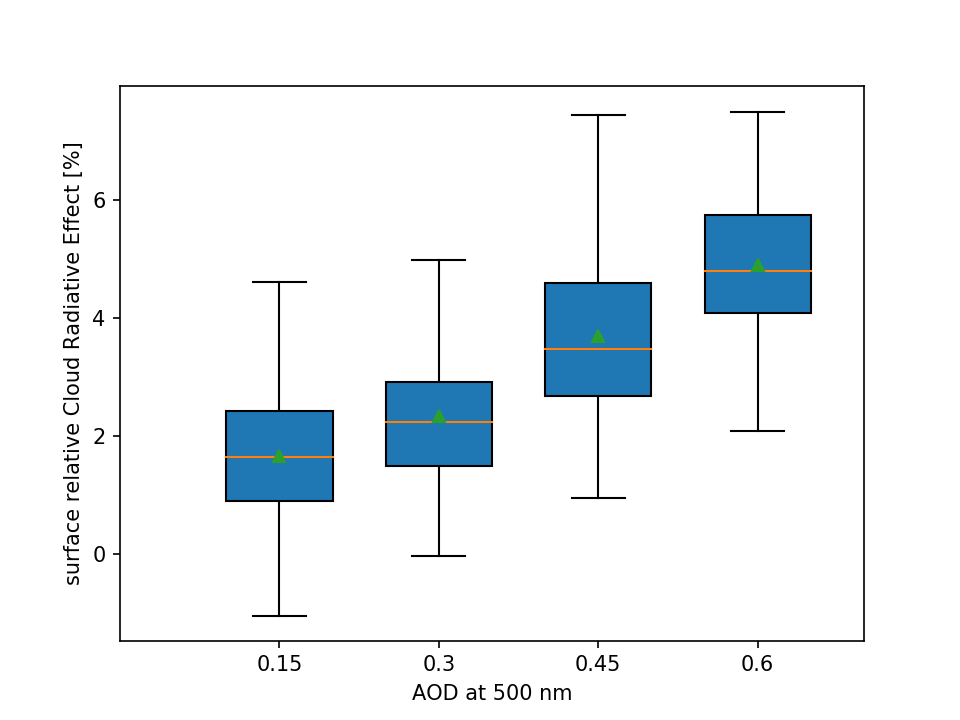

In [342]:
plt.figure()
plt.boxplot(bins_diffrC,positions=daod,showfliers=False,widths=0.1,showmeans=True,patch_artist=True)
plt.xlim(0,0.7)
plt.xticks([0.15,0.3,0.45,0.6])
plt.gca().set_xticklabels([0.15,0.3,0.45,0.6])
plt.xlabel('AOD at 500 nm')
plt.ylabel('surface relative Cloud Radiative Effect [%]')
plt.savefig(fp+'../plot/ORACLES_rCRE_vs_AOD_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

<IPython.core.display.Javascript object>


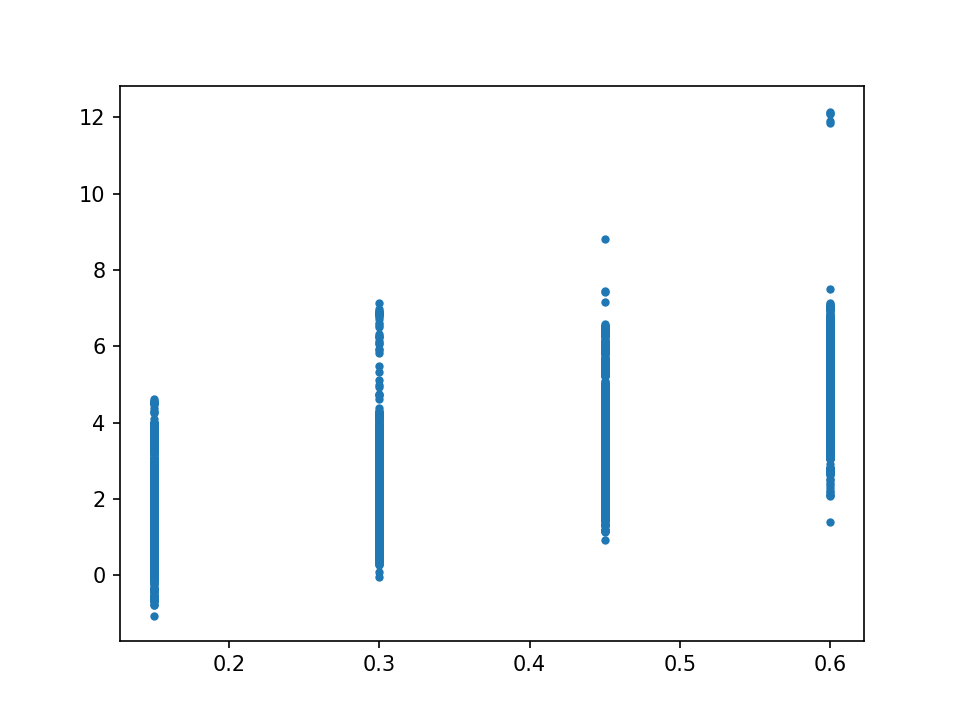

In [322]:
plt.figure()
plt.plot(ca['aod'][:,3],star_aero_rC[:,0]-star_noaero_rC[:,0],'.')

In [296]:
print 'difference in relative CRE due to aerosol'
print 'mean, surface: {}, toa: {}'.format(np.nanmean(star_aero_rC[:,0]-star_noaero_rC[:,0]),np.nanmean(star_aero_rC[:,2]-star_noaero_rC[:,2]))

difference in relative CRE due to aerosol
mean, surface: 2.99264232375, toa: 4.88557026045


In [314]:
c.keys()

[u'star_aero_CRE',
 u'star_noaero_C',
 u'star_noaero_CRE',
 u'star_noaero_CRE_clear',
 u'star_aero_CRE_clear',
 u'star_aero_C']

<IPython.core.display.Javascript object>


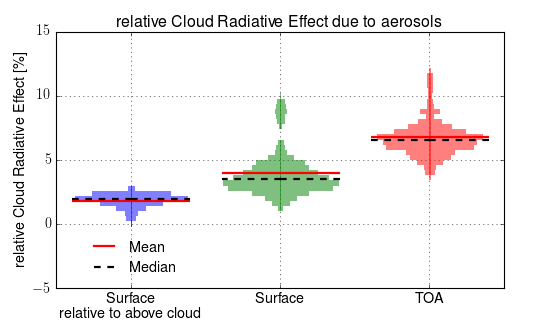

In [127]:
fig = plt.figure(figsize=(7,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-5,15],xlim=[-0.5,2.5])
ax1.set_ylabel('relative Cloud Radiative Effect [\%]')
ax1.set_title('relative Cloud Radiative Effect due to aerosols')
ax1.set_xticks([0,1,2])
ax1.set_xticklabels(['Surface\nrelative to above cloud','Surface','TOA'])
pu.plot_vert_hist(fig,ax1,star_aero_rC_abc[:,0]-star_noaero_rC_abc[:,0],0,[-5,15],legend=True,onlyhist=False,loc=4,color='b',bins=50)
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,0]-star_noaero_rC[:,0],1,[-5,15],legend=True,onlyhist=True,loc=4,color='g',bins=50)
pu.plot_vert_hist(fig,ax1,star_aero_rC[:,2]-star_noaero_rC[:,2],2,[-5,15],legend=True,color='r',bins=50)
ax1.grid()
plt.savefig(fp+'../plot/ORACLES_rCRE_from_aerosol_abc_4STAR.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


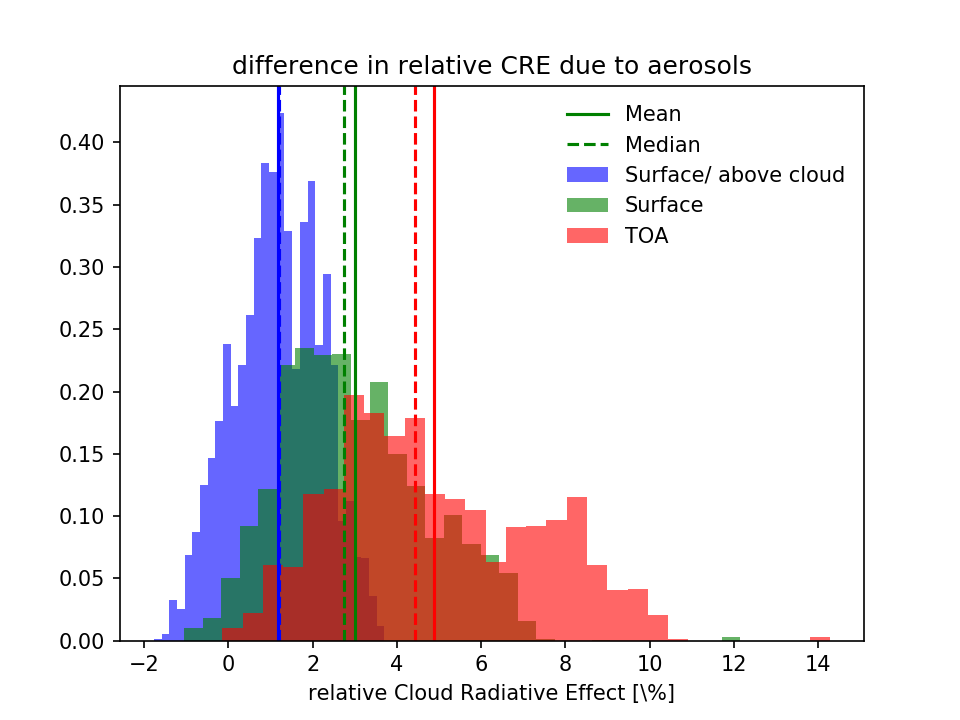

In [299]:
fig = plt.figure()
plt.hist(star_aero_rC_abc[:,0]-star_noaero_rC_abc[:,0],color='b',alpha=0.6,bins=30,normed=True,edgecolor='None',label='Surface/ above cloud')
plt.hist(star_aero_rC[:,0]-star_noaero_rC[:,0],color='g',alpha=0.6,bins=30,normed=True,edgecolor='None',label='Surface')
plt.hist(star_aero_rC[:,2]-star_noaero_rC[:,2],color='r',alpha=0.6,bins=30,normed=True,edgecolor='None',label='TOA')

plt.axvline(np.nanmean(star_aero_rC[:,0]-star_noaero_rC[:,0]),ls='-',color='g',label='Mean')
plt.axvline(np.nanmedian(star_aero_rC[:,0]-star_noaero_rC[:,0]),ls='--',color='g',label='Median')

plt.axvline(np.nanmean(star_aero_rC[:,2]-star_noaero_rC[:,2]),ls='-',color='r')
plt.axvline(np.nanmedian(star_aero_rC[:,2]-star_noaero_rC[:,2]),ls='--',color='r')
plt.axvline(np.nanmean(star_aero_rC_abc[:,0]-star_noaero_rC_abc[:,0]),ls='-',color='b')
plt.axvline(np.nanmedian(star_aero_rC_abc[:,0]-star_noaero_rC_abc[:,0]),ls='--',color='b')
plt.legend(frameon=False)

plt.xlabel('relative Cloud Radiative Effect [\%]')
plt.title('difference in relative CRE due to aerosols')

plt.savefig(fp+'../plot/ORACLES_rCRE_from_aerosol_abc_4STAR_{}.png'.format(vv),transparent=True,dpi=600)

In [300]:
c.keys()

[u'star_aero_CRE',
 u'star_noaero_C',
 u'star_noaero_CRE',
 u'star_noaero_CRE_clear',
 u'star_aero_CRE_clear',
 u'star_aero_C']

In [301]:
c['star_aero_C'].shape

(3816, 3)

In [302]:
ar.keys()

[u'fl_alt',
 u'tau',
 u'ref_err',
 u'LWP',
 u'sza',
 u'lat_fl',
 u'lat',
 u'alt',
 u'tau_err_fl',
 u'lon_fl',
 u'tau_err',
 u'alt_fl',
 u'lon',
 u'tau_fl',
 u'LWP_err',
 u'LWP_err_fl',
 u'ref',
 u'ref_err_fl',
 u'fl_ki',
 u'utc_fl',
 u'LWP_fl',
 u'delta',
 u'phase',
 u'fl',
 u'fl_match',
 u'utc',
 u'ki',
 u'days',
 u'fl_incld',
 u'ref_fl']

In [304]:
ar['tau_fl'].shape

(3816,)

<IPython.core.display.Javascript object>


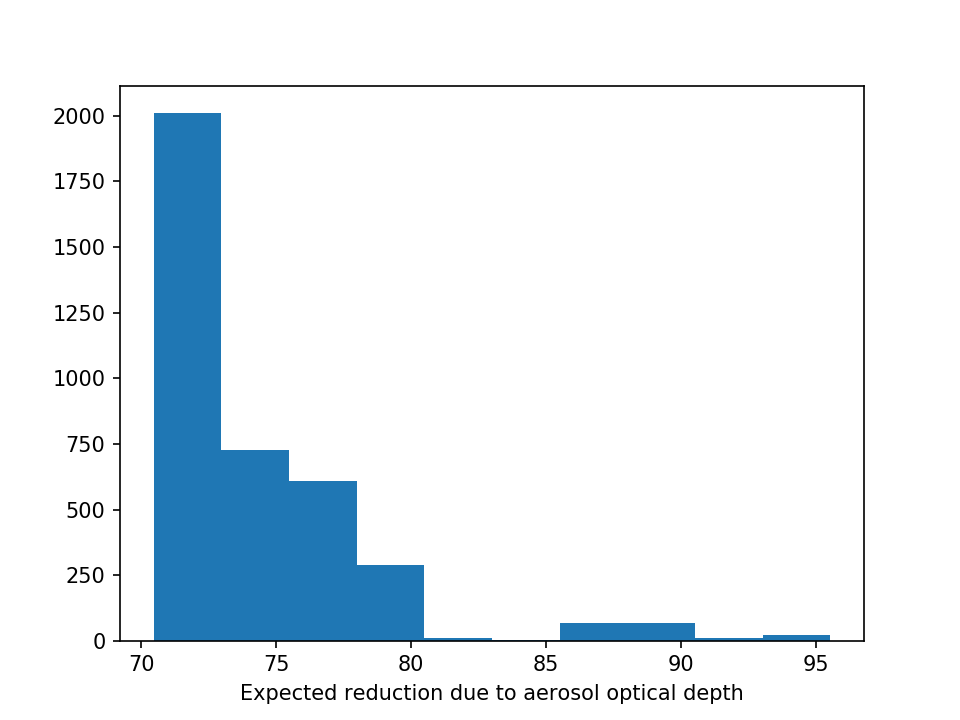

Text(0.5,0,'Expected reduction due to aerosol optical depth')

In [305]:
plt.figure()
plt.hist(np.exp(-1.0*0.36*np.cos(ar['sza'][ar['fl'].astype(bool)]*np.pi/180.0))*100.0,edgecolor='None')
plt.xlabel('Expected reduction due to aerosol optical depth')
#plt.title('TOA albedo')
#plt.savefig(fp+'../plot/ORACLES_albedo_toa_4STAR.png',transparent=True,dpi=600)

<IPython.core.display.Javascript object>


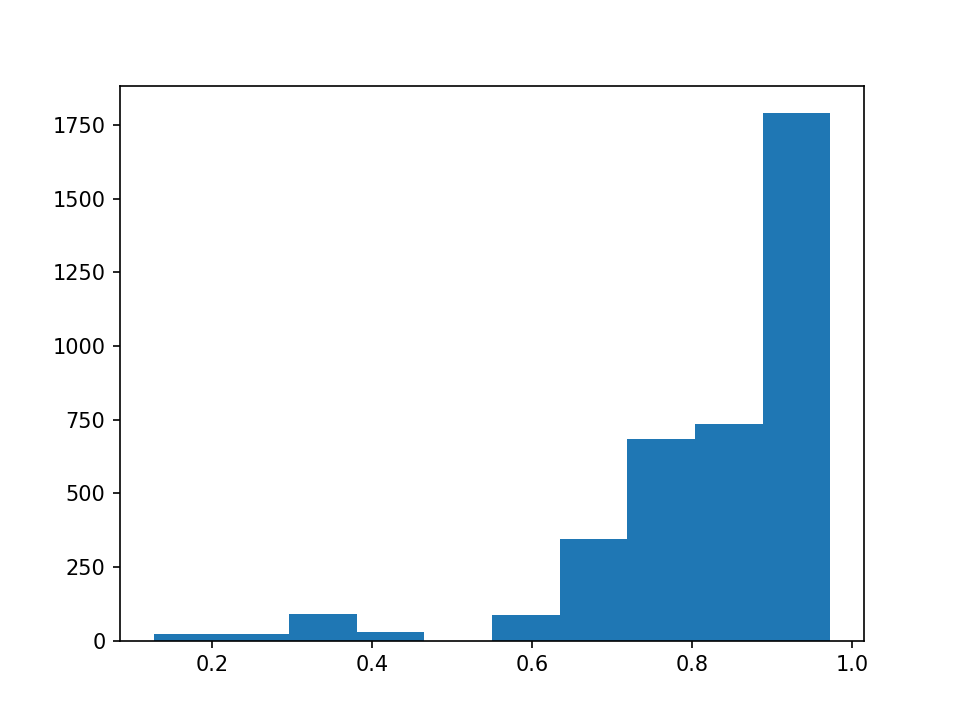

(array([  23.,   24.,   92.,   31.,    0.,   89.,  345.,  684.,  736.,
        1792.]),
 array([0.12712286, 0.21165852, 0.29619418, 0.38072983, 0.46526549,
        0.54980115, 0.6343368 , 0.71887246, 0.80340812, 0.88794377,
        0.97247943]),
 <a list of 10 Patch objects>)

In [306]:
plt.figure()
plt.hist( np.cos(ar['sza'][ar['fl'].astype(bool)]*np.pi/180.0) )

In [117]:
np.cos(4*np.pi/180)

0.9975640502598242

In [118]:
1.0/np.cos(45.0*np.pi/180.0)

1.4142135623730949

Ratio the expected reduction due to aerosol

In [311]:
aero_tau_ratio = np.exp(-1.0*0.36*np.cos(ar['sza'][ar['fl'].astype(bool)]*np.pi/180.0))

<IPython.core.display.Javascript object>


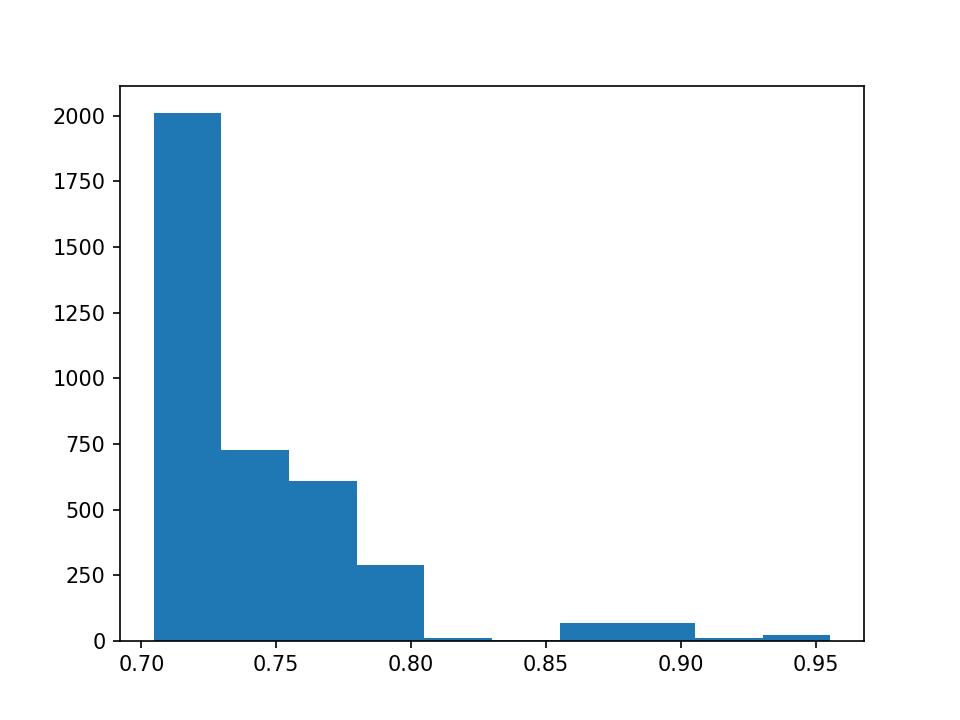

(array([2011.,  727.,  610.,  288.,   10.,    4.,   68.,   66.,    9.,
          23.]),
 array([0.70462284, 0.72968727, 0.75475171, 0.77981614, 0.80488057,
        0.829945  , 0.85500943, 0.88007386, 0.90513829, 0.93020273,
        0.95526716]),
 <a list of 10 Patch objects>)

In [312]:
plt.figure()
plt.hist(aero_tau_ratio)

In [307]:
print 'Surface CRE'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(c['star_aero_C'][:,0]),np.nanmean(c['star_noaero_C'][:,0]))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(c['star_aero_C'][:,0]),np.nanmedian(c['star_noaero_C'][:,0]))
print 'std aero: {}, no aero: {}'.format(np.nanstd(c['star_aero_C'][:,0]),np.nanstd(c['star_noaero_C'][:,0]))

Surface CRE
mean aero: -465.351602669, no aero: -497.7263001
median aero: -478.753291951, no aero: -512.492852741
std aero: 85.2393008031, no aero: 87.1436008012


In [313]:
print 'Surface CRE corrected for ratio'
print 'mean aero: {}, no aero: {}'.format(np.nanmean(c['star_aero_C'][:,0]),np.nanmean(c['star_noaero_C'][:,0]*aero_tau_ratio))
print 'median aero: {}, no aero: {}'.format(np.nanmedian(c['star_aero_C'][:,0]),np.nanmedian(c['star_noaero_C'][:,0]*aero_tau_ratio))
print 'std aero: {}, no aero: {}'.format(np.nanstd(c['star_aero_C'][:,0]),np.nanstd(c['star_noaero_C'][:,0]*aero_tau_ratio))


Surface CRE corrected for ratio
mean aero: -465.351602669, no aero: -366.464225416
median aero: -478.753291951, no aero: -372.684512425
std aero: 85.2393008031, no aero: 55.2035309539


In [309]:
-571.2/-610.3

0.9359331476323122

In [310]:
np.exp(-0.1)

0.9048374180359595